In [ ]:
import time
import numpy as np

# Audio utils

In [ ]:
from abc import abstractmethod

In [ ]:
class FeatureModule(object):
    
    def __init__(self, sample_rate, hop_length, num_channels=1, decibels=True):
        self.sample_rate = sample_rate
        self.hop_length = hop_length
        self.num_channels = num_channels
        self.decibels = decibels
        
    def get_expected_frames(self, audio):
         # Simply the number of hops plus one
        num_frames = 1 + len(audio) // self.hop_length
        return num_frames
    
    def get_sample_range(self, num_frames):
         # Calculate the boundaries
        max_samples = num_frames * self.hop_length - 1
        min_samples = max(1, max_samples - self.hop_length + 1)

        # Construct an array ranging between the minimum and maximum number of samples
        sample_range = np.arange(min_samples, max_samples + 1)
        return sample_range
    
    @abstractmethod
    def process_audio(self, audio):
        return NotImplementedError
    
    def to_decibels(self, feats):
        feats = librosa.core.amplitude_to_db(feats, ref=np.max)
        return feats

    def post_proc(self, feats):
        if self.decibels:
            # Convert to decibels (dB)
            feats = self.to_decibels(feats)

            # TODO - make additional variable for 0/1 scaling
            # Assuming range of -80 to 0 dB, scale between 0 and 1
            feats = feats / 80
            feats = feats + 1
        else:
            # TODO - should anything be done here? - would I ever not want decibels?
            pass

        # Add a channel dimension
        feats = np.expand_dims(feats, axis=0)
        return feats
    
    def get_times(self, audio):
        num_frames = self.get_expected_frames(audio)

        frame_idcs = np.arange(num_frames + 1)
        # Obtain the time of the first sample of each frame
        times = librosa.frames_to_time(frames=frame_idcs,
                                       sr=self.sample_rate,
                                       hop_length=self.hop_length)
        return times
    
    def get_sample_rate(self):
        sample_rate = self.sample_rate
        return sample_rate

    def get_hop_length(self):
        hop_length = self.hop_length
        return hop_length

    def get_num_channels(self):
        num_channels = self.num_channels
        return num_channels

    @classmethod
    def features_name(cls):
         return cls.__name__

## patch madmom import error with sed

In [ ]:
from madmom.audio.signal import SignalProcessor, FramedSignalProcessor
from madmom.audio.stft import ShortTimeFourierTransformProcessor
from madmom.audio.spectrogram import (
    FilteredSpectrogramProcessor, LogarithmicSpectrogramProcessor,
    SpectrogramDifferenceProcessor)
from madmom.processors import ParallelProcessor, SequentialProcessor

In [ ]:
class LOG_SPECT(FeatureModule):
    def __init__(self, num_channels=1, sample_rate=22050, win_length=2048, hop_size=512, n_bands=[12], mode='online'):
        sig = SignalProcessor(num_channels=num_channels, win_length=win_length, sample_rate=sample_rate)
        self.sample_rate = sample_rate
        self.hop_length = hop_size
        self.num_channels = num_channels
        multi = ParallelProcessor([])
        frame_sizes = [win_length]  
        num_bands = n_bands  
        for frame_size, num_bands in zip(frame_sizes, num_bands):
            if mode == 'online' or mode == 'offline':
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size) 
            else:   # for real-time and streaming modes 
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size, num_frames=4) 
            stft = ShortTimeFourierTransformProcessor()  # caching FFT window
            filt = FilteredSpectrogramProcessor(
                num_bands=num_bands, fmin=30, fmax=17000, norm_filters=True)
            spec = LogarithmicSpectrogramProcessor(mul=1, add=1)
            diff = SpectrogramDifferenceProcessor(
                diff_ratio=0.5, positive_diffs=True, stack_diffs=np.hstack)
            # process each frame size with spec and diff sequentially
            multi.append(SequentialProcessor((frames, stft, filt, spec, diff)))
        # stack the features and processes everything sequentially
        self.pipe = SequentialProcessor((sig, multi, np.hstack))

    def process_audio(self, audio):
        feats = self.pipe(audio)
        return feats.T

# Beatmap utils

In [ ]:
import re
import os
import torch
import math
import scipy.io.wavfile as wav
import subprocess

In [ ]:
class Beatmap():    
    
    def __init__(self, beatmap_dir, beatmap, proc, sample_rate=22050, tmp='./wav/', 
                 peak_type='gaussian', hop_size=512, width=4):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.proc = proc
        self.tmp = tmp
        self.wavf = None
        self.audiof = None
        self.rate = int(sample_rate / hop_size)
        self.w = width
    
        self.timestamp = []
        self.beat_len = []
        self.hitobjects = []
        self.frames = None
        self.beats = None
        self.m = None
        self.hitstream = None
        self.hits = None
        
        peaks = {
            'gaussian': self.create_gaussian_peak, 
            'linear': self.create_linear_peak, 
            'parabolic': self.create_parabolic_peak
        }
        self.create_peak = peaks[peak_type]
        
    def parse_audiof(self):
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'AudioFilename.*', l):
                    self.audiof = re.search('AudioFilename:\s*(.*)', l).group(1)
        
        if not os.path.exists(self.audiof):
            for f in os.listdir(self.beatmap_dir):
                if re.match(self.audiof, f, flags=re.IGNORECASE):
                    self.audiof = f
        
    def get_audiof(self):
        if self.audiof is None:
            self.parse_audiof()
        return self.audiof
        
    def parse_ids(self):
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'BeatmapID.*',  l):
                self.BeatmapID = re.search('BeatmapID:\s*(\d+).*', l).group(1)
            if re.match(r'BeatmapSetID.*', l):
                self.BeatmapSetID = re.search('BeatmapSetID:\s*(\d+).*', l).group(1)
        if 'BeatmapSetID' not in locals():
            self.BeatmapSetID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        if 'BeatmapID' not in locals():
            self.BeatmapID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        f.close()
            
    def parse_wav(self):
        self.parse_ids();
        self.wavf = str(self.BeatmapSetID) + '-' + str(self.BeatmapID) + '.wav'
        
    def create_wav(self):
        self.parse_wav()
        mp3 = os.path.join(self.beatmap_dir, self.get_audiof())
        wav = os.path.join(self.tmp, self.wavf)
        subprocess.call(['ffmpeg', '-hide_banner', '-loglevel', 'error', '-y', 
                         '-i', mp3, '-ar', str(self.sample_rate), wav])
        
    def get_wav(self):
        if self.wavf is None:
            self.parse_wav()
            if not os.path.exists(os.path.join(self.tmp, self.wavf)):
                self.create_wav()
        return self.wavf

    def parse_timings(self):
        rate, audio_data = wav.read(os.path.join(self.tmp, self.get_wav()))
        audio_len = np.shape(audio_data)[0]
        self.beat_len = []
        self.timestamp = []
        
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'BeatDivisor.*', l):
                    self.BeatDivisor = re.search('BeatDivisor:\s*(\d+).*', l).group(1)
                    self.BeatDivisor = int(self.BeatDivisor)
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0])) 
        self.timestamp.append(int(audio_len / rate * 1000))
        f.close()
        
    def parse_hitobjects(self):
        self.hitobjects = []
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'ApproachRate.*', l):
                    AR = float(l.split(':')[1])
                    if AR < 5.0:
                        preempt = 1200 + 600 * (5 - AR) / 5
                        fadein = 800 + 400 * (5 - AR) / 5
                    else:
                        preempt = 1200 - 750 * (AR - 5) / 5
                        fadein = 800 - 500 * (AR - 5) / 5
                    self.preempt = preempt - fadein*0.1
                    break
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'SliderMultiplier.*', l):
                    self.sliderMultiplier = float(l.split(':')[1])
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
        
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
    
    def process_audio(self):
        feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
        feats = torch.tensor(feats)
        self.frames = torch.transpose(feats, 0, 1)
        
    def create_gaussian_peak(self, y, i):
        alen = len(y)
        w = self.w/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_parabolic_peak(self, y, i):
        alen = len(y)
        limit = self.w*2
        w = self.w

        def func(x):
            return -(1/w**2 * x**2) + 1

        j = 0        
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_linear_peak(self, y, i):
        alen = len(y)
        w = self.w/2
        m = 1/w
        limit = w
        
        def func(x):
            return m*x + 1
        
        j=0
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        m = -m
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1  
    
    def process_beats(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        self.beats = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        i = self.timestamp[0] * 0.001 * self.rate
        while i > 0:
            x = round(i)
            self.create_peak(self.beats, x)
            i -= self.beat_len[0] * 0.001 * self.rate
        for j in range(len(self.timestamp) - 1):
            i = self.timestamp[j] * 0.001 * self.rate
            while i < (self.timestamp[j+1] * 0.001 * self.rate):
                x = round(i)
                self.create_peak(self.beats, x)
                i += self.beat_len[j] * 0.001 * self.rate
            if i >= self.timestamp[-1] * 0.001 * self.rate:
                break
                
    def process_hitobjects(self):
        global debug
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hitstream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
        
        sr = 1.0/self.rate * 1000
        time = 0.0
        i = 0
        k = 0
        self.hitstream[k] = []
        while i != len(self.hitobjects):
            if float(self.hitobjects[i][2]) < time:
                i += 1
                continue
            j = i
            while j < len(self.hitobjects):
                if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
                    break
                hit_type = int(self.hitobjects[j][3]) & 0b0011
                self.hitstream[k].append(hit_type)
                
                if int(hit_type) & 0b0010 != 0:
                    slider_rate = None
                    length = None
                    for i in range(len(self.timestamp)-1, 0-1, -1):
                        if slider_rate != None:
                            if self.beat_len[i] < 0.0:
                                continue
                            length = self.beat_len[i]
                            break
                        if self.timestamp[i] < float(self.hitobjects[j][2]):
                            if self.beat_len[i] > 0.0:
                                slides = 100
                                slider_rate = self.beat_len[i]
                                break
                            else:
                                slides = self.beat_len[i] * -1
                    if length == None:
                        length = self.beat_len[0]
                        slider_rate = 100
                    length = float(length)
                    y = round(float(self.hitobjects[j][7]) * length / (100/slider_rate * self.sliderMultiplier * 100.0) * 0.001 * self.rate)
                    for i in range(int(self.hitobjects[j][6])):
                        self.hitstream[k].append(-1)
                    
                j += 1
            
            time += sr
            debug = self.hitstream
            k += 1
            self.hitstream[k] = []
    
    def process_hits(self):
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hits = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        for h in self.hitobjects:
            x = round(float(h[2]) * 0.001 * self.rate)
            self.create_peak(self.hits, x)
            
            if int(h[3]) & 2 == 2:
                slider_rate = None
                length = None
                for i in range(len(self.timestamp)-1, 0-1, -1):
                    if slider_rate != None:
                        if self.beat_len[i] < 0.0:
                            continue
                        length = self.beat_len[i]
                        break
                    if self.timestamp[i] < float(h[2]):
                        if self.beat_len[i] > 0.0:
                            slides = 100
                            slider_rate = self.beat_len[i]
                            break
                        else:
                            slides = self.beat_len[i] * -1
                if length == None:
                    length = self.beat_len[0]
                    slider_rate = 100
                length = float(length)
                y = round(float(h[7]) * length / (100/slider_rate * self.sliderMultiplier * 100.0) * 0.001 * self.rate)
                for i in range(0, int(h[6])*y):
                    if x + i > self.hits.shape[0]:
                        break
                    self.create_peak(self.hits, x+i)
                    
    def get_audio(self):
        if self.frames is None:
            self.process_audio()
        return self.frames
    
    def get_hitobjects(self):
        if self.hitstream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitstream)
        for i in range(len(self.hitstream)):
            if self.hitstream[i] == [] or self.hitstream[i] == None:
                h = np.array([0])
            else:
                h = np.array(self.hitstream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_hits(self):
        if self.hits is None:
            self.process_hits()
        return torch.tensor(self.hits)
    
    def get_beats(self):
        if self.beats is None:
            self.process_beats()
        return torch.tensor(self.beats)
    
    def get_metadata(self):
        if self.BeatDivisor is None:
            self.parse_beatmap()
        return (self.beatmap, self.rate, self.BeatDivisor)
    
    def get_timings(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        return list(zip(self.timestamp, self.beat_len))

# Dataset

In [ ]:
import glob
import copy
import gc
import concurrent.futures
import traceback
import torch
from torch.utils.data import Dataset

In [ ]:
class Beatmap_Dataset(Dataset):  
    
    def __init__(self, beatmap_dir, proc, seq_dur=10, sample_rate=22050, hop_size=512, width=4, 
                 peak_type='gaussian', threads=4, threading=True):
        self.beatmap_dir = beatmap_dir
        self.proc = proc
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.beatmaps = []
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.width = width
        
        if beatmap_dir == None:
            self.a = []
            self.o = []
            self.b = []
            self.h = []
            self.t = []
            self.m = []
            return
        
        j = 0
        for r, dirs, _ in os.walk(beatmap_dir):
            for dir in dirs:
                for root, _, files in os.walk(os.path.join(r, dir)):
                    for f in files:
                        if re.match('.*.osu$', f):
                            self.beatmaps.append(Beatmap(root, f, proc, sample_rate=sample_rate, 
                                                         hop_size=hop_size, width=width, peak_type=peak_type))
                            j += 1
                                            
        self.a = [None] * j
        self.o = [None] * j
        self.b = [None] * j
        self.h = [None] * j
        self.t = [None] * j
        self.m = [None] * j 

        def process(i):
            m = self.beatmaps[i]
            self.beatmaps[i] = None
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)            
                self.a[i] = copy.deepcopy(m.get_audio())
                self.o[i] = copy.deepcopy(m.get_hitobjects())
                self.b[i] = copy.deepcopy(m.get_beats())
                self.h[i] = copy.deepcopy(m.get_hits())
                self.t[i] = copy.deepcopy(m.get_timings())
                self.m[i] = copy.deepcopy(m.get_metadata())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)     
                self.a[i] = None
                self.o[i] = None
                self.b[i] = None
                self.h[i] = None
                self.t[i] = None
                self.m[i] = None
            del m
            #gc.collect()

        if threading:
            executor = concurrent.futures.ThreadPoolExecutor(threads)
            list(executor.map(process, range(j)))
        else:
            list(map(process, range(j)))
                        
        self.beatmaps = list(filter(None, self.beatmaps))
        self.a = list(filter(lambda x: x != None, self.a))
        self.o = list(filter(lambda x: x != None, self.o))
        self.b = list(filter(lambda x: x != None, self.b))
        self.h = list(filter(lambda x: x != None, self.h))
        self.t = list(filter(None, self.t))
        self.m = list(filter(None, self.m))
        
    def take(self, ds, i, j):
        self.a = ds.a[i:j]
        self.o = ds.o[i:j]
        self.b = ds.b[i:j]
        self.h = ds.h[i:j]
        self.m = ds.m[i:j]
        self.t = ds.t[i:j]
        
    def __len__(self):
        return len(self.a)
    
    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        j = np.random.randint(0, self.a[i].shape[0] - self.seq_len)
        return self.a[i][j: j+self.seq_len], self.o[i][j: j+self.seq_len], self.b[i][j: j+self.seq_len], self.h[i][j: j+self.seq_len], self.t[i][0], (self.m[i], i, j)
    

In [ ]:
# debug
log_spect = LOG_SPECT(sample_rate=44100, hop_size=441*2, n_bands=[24], mode='offline')
s = Beatmap_Dataset('../ex/beatmaps', log_spect, sample_rate=44100, hop_size=441*2, width=2, peak_type='linear', threading=True)

0/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu
1/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [HOS' Normal].osu
2/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [RLC's Insane].osu
3/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [deetz' Deception].osu
4/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Easy].osu
5/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [toybot's Insane].osu
6/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Collab Advanced].osu
7/24 TMABird - Everybody's Circulation (Vncegd) [Very Easy].osu
8/24 TMABird - Everybody's Circulation (Vncegd) [Normal].osu
9/24 TMABird - Everybody's Circulation (Vncegd) [Hard (new)].osu
10/24 TMABird - Everybody's Circulation (Vncegd) [Easy (new)].osu
11/24 TMABird - Everybody's Circulation (Vncegd) [Insane].osu
1

# Constants

In [ ]:
sample_rate = 44100
hop_size = 441 * 2
seq_dur = 10
peak_type = 'gaussian'
width = 4

beatmap_dir = '../beatmaps'
ds_path = './datasets/HN/ds_' + peak_type + '.pkl'
model_path = './models/HN/model06_' + peak_type

# Process Data

In [ ]:
start = time.time()

log_spect = LOG_SPECT(sample_rate=sample_rate, hop_size=hop_size, n_bands=[24], mode='offline')
ds = Beatmap_Dataset(beatmap_dir, log_spect, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width, threads=16, threading=True)

end = time.time()
print(end - start, 'secs')

0/15111/1511 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
 Chata - Engage (Lasse) [Insane].osu
2/1511 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/1511 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/1511 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/1511 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/1511 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/1511 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/15119/1511 cYsmix - bells! (Gero) [normal!].osu
 fripSide - future gazer (TV Size) (alacat) [Insane].osu
10/1511 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/151112/1511 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu13/1511 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu

14/1511 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Ravers Fantasy (LoweH) [deadbeat's Hard].osu
36/1511 Matsutoya Yumi - Haru yo, koi (FlyJay Edit) (DTM9 Nowa) [Hard].osu
37/1511 MIMI - Lapis Lazuli (-Liban-) [NotEnough's Insane].osu
38/1511 cYsmix - Babaroque (Short Ver.) (Mao) [Collab Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 320, in get_hitobjects
    stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
  File "<__array_function__ internals>", line 180, in pad
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 743, in pad
    pad_width = _as_pairs(pad_width, array.ndim, as_index=True)
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 510, in _as_pairs
    raise ValueError("index can't contain negative values")
ValueError: index can't contain negative values


pruning: gmtn. (witch's slave) - furioso melodia (Alumetorz) [Wrath].osu
39/1511 Hanatan - Tengaku (Rakuen) [handsome's Insane].osu
40/1511 Afilia Saga - S.M.L (TV size ver.) (Kanau) [-lolist-'s Insane].osu
41/1511 HyuN feat. LyuU - Cross Over (Sonnyc) [Insane].osu
42/1511 yozuca - LOVING TRIP (Fycho) [Kyubey's Insane].osu
43/1511 Haruna Luna - Momoiro Typhoon (Trynna) [Net0's Insane].osu
44/1511 Last Note. - Caramel Heaven (Snepif) [Nyquill's Insane].osu
45/1511 USAO - The Commanders(Extended Mix) (Yusomi) [Another].osu
46/1511 Hanatan - Uta ni Katachi wa Nai keredo (Roll_Pan) [Melody -Short ver-].osu
47/1511 Station Earth - Cold Green Eyes ft. Roos Denayer (Bearizm) [apple's Insane].osu
48/1511 nomico - Bad Apple!! (James) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 47, in process
    self.h[i] = copy.deepcopy(m.get_hits())
  File "/tmp/ipykernel_16111/554882180.py", line 325, in get_hits
    self.process_hits()
  File "/tmp/ipykernel_16111/554882180.py", line 304, in process_hits
    self.create_peak(self.hits, x+i)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 12369 is out of bounds for axis 0 with size 12369


pruning: TheFatRat - Mayday (feat. Laura Brehm) (Voltaeyx) [[2B] Calling Out Mayday].osu
49/1511 Nightcore - Flower Dance (Harutora) [Flower Deal].osu
50/1511 Kalafina - red moon (Kalibe) [Lunar].osu
51/1511 Shiena Nishizawa - FUBUKI (Rizia) [eINess' Insane].osu
52/1511 Takahashi Yoko - Zankoku na Tenshi no These (TV Size) (CptSqBany) [Walao's Insane].osu
53/1511 Demetori - Koyoi wa Hyouitsu na Egoist ~ Ego, Schizoid, Beat. (Crissa) [Yorigami].osu
54/1511 HO-KAGO TEA TIME - Tenshi ni Fureta yo! (Asterisk DnB Remix) (Sotarks) [Reform's Insane].osu
55/1511 Tsunamaru - Daidai Genome (SkyLifeHope) [Orange].osu
56/1511 Shirakami Fubuki - Bitter Choco Decoration (NitroM_) [Dark Chocolate].osu
57/1511 Antonin Dvorak - Symphony No. 9, From the New World, IV. Allegro con fuoco (buraimaster1234) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: nomico - Bad Apple!! (James) [Normal].osu
58/1511 SawanoHiroyuki[nZk]Tielle & Gemie - sh0ut (Mir) [Rumiru's Insane].osu
59/1511 cYsmix - Fright March (Gero) [Insane].osu
60/1511 Fujijo Seitokai Shikkou-bu - Best FriendS (sahuang) [N a s y a's Insane].osu
61/1511 Omoi - Chiisana Koi no Uta (Synth Rock Cover) (val0108) [Marianna's Insane].osu
62/1511 Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
63/1511 Nico Nico Douga - U.Nknown Goose (Borokuzu) [Insane].osu
64/1511 Hatsune Miku - Moon (Saten ruiko) [Insane].osu
65/1511 fripSide - black bullet (TV Size) (Chloe) [Insane].osu
66/1511 Hatsune Miku - the last effect (Holoaz) [ringloid].osu
67/1511 Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
68/1511 REOL - Hibikase (Gero) [NiNo's Insane].osu
69/1511 Kuba Oms - My Love (W h i t e) [Insane].osu
70/1511 Yasuo - P - Electric Angel (- Ruby Rose -) [Insane].osu
71/1511 Shimotsuki Haruka, Suzuyu - Fairy Wreath (ImpurePug) [Angraecum].osu
72/1511 ClariS - Connect (TV

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
76/1511 toby fox - Nyeh Heh Heh! & Bonetrousle (DaxMasterix) [NORMAL].osu
77/1511 ryo (supercell) - ODDS&ENDS (Short Ver.) (Betsuto) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
78/1511 TRakker - Trail of Dust (Amamiya Yuko) [Trail of Star].osu
79/1511 Police Piccadilly feat. Hatsune Miku - Kire Carry On (Sinnoh) [negusver's Insane].osu
80/1511 MOSAIC.WAV - Zen Sekai Teki Touch Panel (Laurier) [CrystLer].osu
81/1511 Aiobahn & Yunomi - Makuramoto ni Ghost (feat. Nicamoq) (Swan) [Swan's Melanzana].osu
82/1511 Camellia - Routing (Shiirn) [pishi's Advanced].osu
83/1511 seleP feat. Lily - Chloe-Five Decades Ago- (Duftende Pizza) [V].osu
84/1511 dj TAKA - quaver (Monstrata) [Haru's Insane].osu
85/1511 Silver Forest Feat. Aki & Sakura Mayuko - Summer time Heaven -after (RVMathew) [Ojou].osu
86/1511 Van Darkholme - GachiMuchi circulation (Kr0n0s23) [Thank you, sir!].osu
87/1511 Ariabl'eyeS - Senkou no Furea (Kibbleru) [Redemption].osu
88/1511 ATeens - Gimme! Gimme! Gimme! (Nightcore Mix) (ShadowSoul) [Gimme!].osu
89/1511 Tomoe Tamiyasu - Yamato Nadeshiko Hanakotoba (Lasse) [Insane].osu
90/1511 Masayoshi M

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Masayoshi Minoshima ft. nomico - Bad Apple!! (Ephemeral) [Normal].osu
103/1511 Chata - len (Cami) [xiqingwa's Lunatic].osu
104/1511 Fractal Dreamers - Fata Morgana (Natsu) [captin's Insane].osu
105/1511 u's - Snow Halation (Asterisk DnB Remix) (jeydude) [Nico].osu
106/1511 Atoguru - Hana no Sadame (CSAQ) [Insane].osu
107/1511 Daisuke Ishiwatari - Condemnation Wings (Jounzan) [Requiem Aeternam].osu
108/1511 gmtn. (witch's slave) - furioso melodia (Urushi38) [EDITED].osu
109/1511 Warak - Once Upon A Time (Xilver) [UC's Insane].osu
110/1511 Gladenfold - ...To Eternity (LMT) [Yamicchi's Light Insane].osu
111/1511 Krewella - Say Goodbye (Nightcore Mix) (Cut Ver.) (Bquntii) [Ignorance].osu
112/1511 Hatsune Miku - Hand in Hand (Magical Mirai ver.) (Aureola) [Normal].osu
113/1511 livetune feat. Hatsune Miku - Hand in Hand (Magical Mirai ver.) (Inversal) [Marathon].osu
114/1511 Hatsuki Yura - Mitsu Matoishi Shiro no Himegimi ~Snow White~ (IceKalt) [Princess' Fury].osu
115/1511 Yoshimur

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 15863 is out of bounds for axis 0 with size 15850


pruning: Hatsuki Yura - Kowaku no Mori (mama2093) [Dance].osu
143/1511 u's - LOVELESS WORLD (Sakurauchi Riko) [Unbound by Fate].osu
144/1511 Hatsune Miku - World is Mine (tom800510) [Queen!!].osu
145/1511 Spacelectro feat.Setsunan - Little Little wish (Starfy) [Desire].osu
146/1511 Chihiro Yonekura - Koiseyo Otome! (Asahina Momoko) [VINXIS's Insane].osu
147/1511 Denkishiki Karen Ongaku Shuudan - Distorted Pain (Lasse) [Despair].osu
148/1511 Mitchie M - Hajimemashite Chikyuujin san (Osz) [Expert].osu
149/1511 Primastella - Koigokoro (Koakuma) [Insane].osu
150/1511 Ishida Yoko & 501st Joint Fighter Wing - Yakusoku no Sora e ~Watashi no Ita Basho~ (xNyamx) [Extra].osu
151/1511 Matsumoto Sara - Suika (Kihhou) [Evanescence].osu
152/1511 MIMI feat. Hatsune Miku - Mizuoto To Curtain (Mak Kau Hijau) [Insane].osu
153/1511 Komine Lisa - Resuscitated Hope (Okorin) [Insane].osu
154/1511 Hanatan - Senbonzakura (Karen) [Insane].osu
155/1511 Mami Kawada - Wings of Courage -Sora o Koete- (BetaStar) [I

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - World is Mine (tom800510) [Queen!!].osu
158/1511 yanaginagi - Tokohana (HabiHolic) [Kanto's Insane].osu
159/1511 Blackhole - Lagomorphic (happy623) [Lagomorph].osu
160/1511 Station Earth - Age Of Reason (Sotarks) [FCL's Insane].osu
161/1511 IA - Underdog Supremacist (-Hwangbo) [Hwang Kong City].osu
162/1511 cYsmix - Classic Pursuit (-kevincela-) [Insane].osu
163/1511 ClariS - Connect -TV MIX- (captin1) [Karia's Insane].osu
164/1511 Nanawo Akari - One Room Sugar Life (TV Size) (Fushimi Rio) [Bariton's Insane].osu
165/1511 Hanazawa Kana - Mousou Express (Remix) (-Tochi) [Koiyuki's Insane].osu
166/1511 fhana - little secret magic (Sotarks) [Linada's Insane].osu
167/1511 EastNewSound - Hiiro gekka, ky sakino zez (AlexTroIIPsy) [Blood Addicted].osu
168/1511 RYO - Shuffle Heaven (Nemis) [eXtra].osu
169/1511 Shimotsuki Haruka - small star (ImpurePug) [Lasse's Insane].osu
170/1511 Void222x - Destruction Armageddon (Animeshka92) [Destruct your arm].osu
171/1511 Marika - 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
  F

178/1511 Dark PHOENiX - Taketori Hishou (KanbeKotori) [Extra].osu
179/1511 Mili - Origin (TV Size) (Ryuusei Aika) [kanor's Insane].osu
180/1511 Hanataba - Night of Knights (v2b) [Normal].osu
181/1511 Sagara Kokoro - Hoshizora no Ima (Star Stream) [Insane].osu
182/1511 Hanatan - Uta ni Katachi wa Nai keredo (Asahina Momoko) [Recollection].osu
183/1511 PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
184/1511 Yoko Takahashi - Zankoku Na Tenshi No These (TV. Size Version) (moph) [Ambient's Insane].osu
185/1511 Noboru ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [ShiraHoki's Light Insane].osu
186/1511 Chitose Sara - Arcadia (Short ver.) (Riven) [-Tochi's Insane].osu
187/1511 eyemedia - Bloody Purity (tsuka) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hanataba - Night of Knights (v2b) [Normal].osu
188/1511 Atoguru - Itoshi Kimi wo Mitsuke ni (Pizza Kun) [Insane].osu
189/1511 Hanasaka Yui(CV M.A.O) - Harumachi Clover (Naotoshi) [Light Insane].osu
190/1511 Hatsune Miku - Ephemeral (Wishkey) [Fade Away].osu
191/1511 emon - shake it! (kosiga) [Normal].osu
192/1511 Suzuki Konomi - This game (TV Size) (Sekai-nyan) [Nyquill's Insane Game].osu
193/1511 Warak - REANIMATE (iyasine) [xsrs's Extra].osu
194/1511 Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu
195/1511 Kuroneko Dungeon - Ryoushi no Umi no Lindwurm (Crystal) [ak74's Insane].osu
196/1511 Feint - Reprise (Secretpipe) [Sieg's Light Insane].osu
197/1511 Umetora - Ifuudoudou (Nymph) [Insane].osu
198/1511 Hana - Kuukirikigaku Shoujo to Shounen no Uta (Soleily Remix) (Koiyuki) [Yuki].osu
199/1511 wowaka - Unknown Mother-Goose feat. Hatsune Miku (tutuhaha) [Insane].osu
200/1511 Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
201/1511 paraoka 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7829 is out of bounds for axis 0 with size 7829


pruning: Warak - REANIMATE (iyasine) [xsrs's Extra].osu
205/1511 Various Artists - IIDX collection (N a s y a) [V3].osu
206/1511 CHiCO with HoneyWorks - Heart no Shuchou (Sotarks) [Yuitarks' Insane].osu
207/1511 Demetori - Fall of Fall ~ The Door Into Summer (jonathanlfj) [Extra Stage].osu
208/1511 u's - Baby Maybe Koi no Button (Asterisk DnB Remix) (jeydude) [Love Live!].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'
Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
209/1511 ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
210/1511 Chiyoko - Baby Fantastic! -Short ver.- (Zweib) [iMage's Insane].osu
pruning: Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Normal].osu
211/1511 Apocalyptica - Rage of Poseidon (pishifat) [Extreme].osu
212/1511 fripSide - snow blind -after- (Mordred) [Tears Like Snowflakes].osu
213/1511 ryo (supercell) feat.Hatsune Miku - Tsumi no Namae (Monstrata) [Blooming].osu
214/1511 Uehara Rena - Todokanai Koi '13 (TV EDIT) (Sellenite) [Rewrite].osu
215/1511 Giga-P - LUVORATORRRRRY! (Selisi) [Insane].osu
216/1511 Barbarian On The Groove feat. Takizawa Ichiru - Yoi ni Kanawazu (Shurelia) [Hard].osu
217/1511 livetune feat.Hatsune Miku - Last Night, Good Night (Autumn) [Oyasumi].osu
218/1511 MiddleIsland - Achromat (zxhzxhz) [Insane].osu
219/1511 Tamura Yukari - MERRY MERRY MERRY MENU... Ne! (moonlightleaf) [wkyik's Insane].osu
220/1511 Dr

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: IOSYS - Hakurei Jinja (tieff) [Normal].osu
234/1511 a_hisa - Tokei no Heya to Seishin Sekai (Asahina Momoko) [wring's Hyper].osu
235/1511 Ogura Yui - Honey Come!! (TV size) (Sekai-nyan) [Kanto's Insane].osu
236/1511 Kano - Daisy Blue (Fycho) [Insane].osu
237/1511 bbn - Identic Conflict (- Rabbit -) [full version].osu
238/1511 Tsunamaru - paranoia (Chewin) [Insane].osu
239/1511 Hatsune - When The First Love End (prefect_kurumi) [Sayonara_2 (Play this)].osu
240/1511 Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
241/1511 IOSYS - Endless Tewi-ma Park (Erza) [228bpm Impossible mode ].osu
242/1511 maki ligon - Despito (cursed eurobeat mix) - INITIAL Despacito (Testo) [Insane].osu
243/1511 Mili - Vulnerability (Alphabet) [Normal].osu
244/1511 Petit Rabbit's - No Poi! (NerO) [Rabbit].osu
245/1511 Ryu - I'm so Happy (Yauxo) [Krimek's Insane].osu
246/1511 a_hisa - Tokei no heya to seishin sekai (ad4857) [IIIOTL].osu
247/1511248/1511 otetsu feat.Megurine Luka 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: K2 - Karaburi Sadistic (Shinxyn) [Insane].osu
253/1511 a_hisa - Star Prism (-Amane-) [Refraction].osu
254/1511 MUMEI_ver.SP - Kokoro ga Odoru Herb Tea yoo (- G I D Z -) [Left's Insane].osu
255/1511 Panda Eyes & Teminite - Highscore (Fort) [LGV's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
256/1511 yanaginagi - Vidro Moyou (QL Tell Your World Mashup) (- t e n n y a -) [Laurier's Insane].osu
257/1511 MIMI feat. Hatsune Miku - Ai no Sukima (theramdans) [Insane].osu
258/1511 REDALiCE - Bad Apple!! (Rena-chan) [Insane].osu
259/1511 storyteller(cosMo x GAiA) feat. IA, Kagamine Rin - Anti the EuphoriaHOLiC (SaltyLucario) [Nowa's Insane].osu
260/1511 Tamura Yukari - Songs Compilation (Milan-) [lolis].osu
261/1511 LeaF - Alice in Misanthrope -Ensei Alice- (eiri-) [Uberzolik's Insane].osu
262/1511 Rita - dorchadas (Delis) [Mirash's Insane].osu
263/1511 Hatsuki Yura - Diabolikha (Lan wings) [Death].osu
264/1511 Miki Sayaka (CV Kitamura Eri), Sakura Kyoko (CV Nonaka Ai) - and I'm home (Kyuukai) [Sayaka].osu
265/1511 seleP - BELHALA (Bara-) [Perpetual Loneliness].osu
266/1511 Hatsuki Yura - Diabolikha (pkuai) [chart with upwards trend].osu
267/1511 DECO 27 feat. Hatsune Miku - Delusion Tax (Bluepurr) 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: REDALiCE - Bad Apple!! (Rena-chan) [Insane].osu
271/1511 Hanatan - RED Signal (Koalazy) [Insane].osu
272/1511 Tsukudani Norio - Atashi no Kamisama (Amateurre) [Shizuku's Insane].osu
273/1511 MowtenDoo - Blend W (Kalindraz) [Alex's Insane].osu
274/1511 Oshima Haruna - WePace!! (TV Size) (Asaiga) [LMT's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Jan Wayne Vs. Raindropz - Numb (Nightcore Ver.) (KIA) [SteRRuM's Insane].osu
275/1511 Camellia (Feat. Nanahira) - Can I Friend You On BassBook Lol (GameBoy) [Nanahira invited you to play FarmVille.].osu
276/1511 Wakeshima Kanon - killy killy JOKER (TV Size) (Alexsander) [Insane].osu
277/1511 Hanatan - Karakuri Pierrot (Annai Kun) [NK-Insane].osu
278/1511 Acme Iku - Akume Heaven (Doctor Flippers) [Jumping Moans].osu
279/1511 Dave Rodgers - Deja Vu (Faust) [Tutorial Stage].osu
280/1511 Nobunaga - Shinkai Shoujo (gowww) [Insane].osu
281/1511 ClariS - Hologram (Yasaija 714) [Karen's Insane].osu
282/1511 Dormir - Une mage blanche (Realazy) [Standard].osu
283/1511 Hatsune Miku - Cat food (nannou_2009) [Insane].osu
284/1511 Wan Dan P - Douseo mae rakonna kyokuga suki nandaro (lollibaby) [Sudkdkdn].osu
285/1511 Amane - Snow, White, Echo (Cirno) [Normal].osu
286/1511 Nanahoshi Kangengakudan - anoko dokonoko (kwk) [Insane].osu
287/1511 Lily - Under of Fragment (Lightning Terminator) [L.

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Nekomimi Switch (Yes) [Relaxing].osu
302/1511 Shimotsuki Haruka - Byakuya Gensoutan (Chaoslitz) [sahuang's Insane].osu
303/1511 a_hisa - Magic Logic Labyrinth (Muya) [Normal].osu
304/1511 NoboruP ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [Zerkichi's Insane].osu
305/1511 SYNC.ART'S ft. Sakaue Nachi - Green Grass Garden (SENSEABEL) [Extra].osu
306/1511 Mitani Nana - Chikyuu Saigo no Kokuhaku o (Star Stream) [toybot's Insane].osu
307/1511 ClariS - Anemone -TV MIX- (xxdeathx) [wkyik's Insane].osu
308/1511 Mitchie M - Viva Happy (Larissa) [Kyun].osu
309/1511 TeamSASAKURATION - AVALON (Leader) [gowww's Extra].osu
310/1511 TheFatRat ft. Laura Brehm - MAYDAY (Nightcore Mix) (Peter) [Collab Insane].osu
311/1511 Hatsuki Yura - TRICK or TREAT (ByBy13) [Insane].osu
312/1511 Suzuki Konomi - Redo (Rizia) [xxdeathx's Insane].osu
313/1511 ClariS - Connect -TV Size- (Blastoise243) [^o^].osu
314/1511 S3RL - Well, That Was Awkward (DeRandom Otaku) [FCL's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 11588 is out of bounds for axis 0 with size 11588


pruning: SYNC.ART'S ft. Sakaue Nachi - Green Grass Garden (SENSEABEL) [Extra].osu
325/1511 fripSide - sword of virgin (Short Ver.) (Gloria Guard) [Insane].osu
326/1511 Luka,Miku,Rin,IA & Gumi - Pomp and Circumstance (If you do do) (Hinanawi-sama) [Insane].osu
327/1511 dj TAKA - V -conclusion- (Su1fu7) [Insane].osu
328/1511 RD-Sounds feat. Meramipopnayuta - Shiten (Icekalt) [Duet].osu
329/1511 Tomatsu Haruka - courage (fuyuyu-) [Insane].osu
330/1511 Mako Niina - Sensen no Realism (Command DDOS) [everything is cruel].osu
331/1511 Omoi - Snow Drive (Hasiva) [Insane].osu
332/1511 Kano - Sakura no Zenya ([XV]) [Lukas' Insane].osu
333/1511 P remixed by colate - Sweet Devil(colate remix) (syoutoku1) [Insane].osu
334/1511 LeaF - Wizdomiot (Asahina Momoko) [Normal].osu
335/1511 Nanahira - Petals (b00) [Fluorescence].osu
336/1511 capitaro - Karen Aikyou Hanasaka gumi (Tari) [Insane].osu
337/1511 XXme - escape (TV Size) (Hakura) [Log Off Alphakura's Insane].osu
338/1511 Hatsune Miku - Triple Baka

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Triple Baka (Mafiamaster) [Insane].osu
345/1511 Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu
346/1511 Horie Yui - True Truly Love (Thite) [Insane].osu
347/1511 M2U - Myosotis (bor) [Insane ft. sdafsf].osu
348/1511 Hatsune Miku - Uraomote Lovers (CCC-Re) [CCC-Re].osu
349/1511 xi - Happy End of the World (Liiraye) [Happy End].osu
350/1511 CHiCO with HoneyWorks - Ai no Scenario (HabiHolic) [Insane].osu
351/1511 DJ Noriken ft. Yukacco - Lucent (JAKAZiD Remix) (_ZaZa) [Lucent].osu
352/1511 MikitoP feat. Hatsune Miku - 39 Music! (Aureola) [Insane].osu
353/1511 Seiryu - BLUE DRAGON (Blue Dragon) [Tarrasky's Light Insane].osu
354/1511 Touhou Gensou Shiten 2Canon - Otenba Renjyo (cc09212100) [yet].osu
355/1511 LiSA - Rally Go Round (FrostxE) [Insane].osu
356/1511 Ariabl'eyeS - Senko no Furea (My Angel RangE) [Flare].osu
357/1511 Mili - Vitamins feat. world's end girlfriend (Present) [Reverberation].osu
358/1511 Meg & Dia - Monster (DotEXE Remix)(Nightcore Mix) (

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 320, in get_hitobjects
    stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
  File "<__array_function__ internals>", line 180, in pad
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 743, in pad
    pad_width = _as_pairs(pad_width, array.ndim, as_index=True)
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 510, in _as_pairs
    raise ValueError("index can't contain negative values")
ValueError: index can't contain negative values


pruning: Seiryu - BLUE DRAGON (Blue Dragon) [Tarrasky's Light Insane].osu
366/1511 Konuko - Toumei Elegy (Awaken) [G's Insane].osu
367/1511 dj TAKA - True Blue (Monstrata) [Halcyon].osu
368/1511 nameless - Milk Crown on Sonnetica (Len) [toybot's Insane].osu
369/1511 Various Artists - Ar3's eggpain maps project ([CSGA]Ar3sgice) [unfinished].osu
370/1511 Nightcore - Pinball (jericho2442) [Ultimate's Craziness].osu
371/1511 Kanon Wakeshima - Love your enemies (Delis) [Insane].osu
372/1511 Hatsune Miku - Dou Iu Koto Nano! (Raging Bull) [Insane!].osu
373/1511 M2U - Moon Halo (Minorsonek) [Namki's Insane].osu
374/1511 senya - Hitomi ni Kakusareta Omoi (Satellite) [wring's Hard].osu
375/1511 Ito Kanako - Uncontrollable (TV Size) (Hakura) [LCFC's Insane].osu
376/1511 UNDEAD CORPORATION - Yoru Naku Usagi wa Yume o Miru (Smoothie) [Normal].osu
377/1511 dj TAKA - quaver (Sotarks) [Yukiyo's Insane].osu
378/1511 penoreri - Monochrome and Vivid (Nube) [Awake].osu
379/1511 Sharlo - Eisou Youga ~Meiky

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Pinball (jericho2442) [Ultimate's Craziness].osu
380/1511 HachioujiP feat. Hatsune Miku - take it easy (Seto Kousuke) [Insane].osu
381/1511 PinocchioP - I'm glad you're evil too (Monstrata) [Devious].osu
382/1511 Wisp X - Crimson feat. Hatsune Miku (Radio Edit) (Nao Tomori) [yaspo's insane].osu
383/1511 Aiobahn & Yunomi - Makuramoto Ni Ghost (- Yoshimaro -) [Bounce C].osu
384/1511 Haru - Skygazer (Instrumental) (Mukku) [Yes].osu
385/1511 Ceui - MeltyMoment short.ver (Down) [Left's Light Insane].osu
386/1511 Camellia_feat._Nanahira_-_Can_I_Friend_You_On_Bassbook_Lol_Cranky_Remix_-_Theya_-_Can_I_map_you_an_O.osu
387/1511 Yokomin - Yukari (Shiirn) [from Love to Grief].osu
388/1511 ~DJ YOSHITAKA~ - GalacticFlower (Mazukito) [Sakura].osu
389/1511 M2U - Masquerade (Melt) [Insane].osu
390/1511 ALiCE'S EMOTiON - Dark Flight Dreamer (Natsu) [Insane].osu
391/1511 Hatsuki Yura - Dark Night Fairy finis (KKipalt) [defiance's Insane].osu
392/1511 ginkiha - EOS (alacat) [RLC's An

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Haru - Skygazer (Instrumental) (Mukku) [Yes].osu
398/1511 Nanahoshi Kangengakudan - Dance Number o Tomo ni (pkk) [deetz' Insaner].osu
399/1511 senya - Zetsubou no Fuchi (-Mo-) [Insane].osu
400/1511 Hatsuki Yura - Dark Prince (Sallang) [Dark Prince].osu
401/1511 Ceui - Hana ni Natta Shounen no Shinwa (Narcissu) [Calendula].osu
402/1511 sweet ARMS - Date A Live (Mordred) [Naosse's Insane].osu
403/1511 Franz Liszt - La Campanella (8 Bit Remix) (Louis Cyphre) [Ultimate].osu
404/1511 Gachi - Energy Spank (SinonTopWaifu) [That's amazing].osu
405/1511 S3RL feat Krystal - R4V3 B0Y (DeRandom Otaku) [Shmik's 34SY].osu
406/1511 PSYQUI - Hype feat. Such (Nines) [FULL DIVE].osu
407/1511 SYNC.ART'S - MIND READER (Lasse) [Normal].osu
408/1511 Drop - Granat (diraimur) [Rohit's Insane].osu
409/1511 FELT - Closed Wings (Nanashima Asami) [apple's Insane].osu
410/1511 Tsubaki = Yayoi (CV Imai Asami) - Shinsou (Seikatu) [Insane].osu
411/1511 STARTails - ne! ne! ne! (Firis Mistlud) [Mochi's Insane]

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Silver Forest - EXTRA BITTER (Pokie) [Normal].osu
425/1511 Nitta Emi - White Eternity (Soleily & Epsilon Remix) (Lasse) [Snowfall].osu
426/1511 kofunp - FATAL MOMENT (Jenny) [8441able].osu
427/1511 UNDEAD CORPORATION - Yoru Naku Usagi wa Yume o Miru (tokiko) [Extra Stage].osu
428/1511 Roses Epicurean - Yoru no Kodomo-tachi (Gordon123) [tutuhara's Hard].osu
429/1511 petit milady - Hakone Hakoiri Musume (Rizia) [Chaoz's Insane].osu
430/1511 Mili - Rightfully (TV Size) (Moxie) [Reclaim what was Rightfully Ours.].osu
431/1511 Kalafina - Kimi no Gin no Niwa (Bearizm) [Mirage].osu
432/1511 Omoi - Snow Drive(01.23) (Kroytz) [pk's Insane].osu
433/1511 Rostik - Liquid (Paul Rosenthal Remix) (Charles445) [Insane].osu
434/1511 Casandra - Freaks Romanticism (Ohwow) [Insane].osu
435/1511 MAKOOTO - Tanuki Chi no Bouken (0ugi) [rrat].osu
436/1511 Touno Sakura - PRIZMCIRCUiT (moonlightleaf) [Insane].osu
437/1511 witch's slave - disperagioia (huu) [Despair].osu
438/1511 SOUND HOLIC - HOLY WORL

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Uraomote Lovers (Shinxyn) [Insane].osu
451/1511 Horie Yui - Asymmetry (TV Size) (Owens) [Mitsuna's Light Insane].osu
452/1511 Will Stetson - Despacito ft. R3 Music Box (Sotarks) [NiNo's Insane].osu
453/1511 Studio EIM - Soul Worker Login Theme (Ohwow) [Insane].osu
454/1511 senya - Zouka de Arou to Shita Mono (Satellite) [Sellenite's Normal].osu
455/1511 Reol & nqrse - Ooedo Ranvu (Pho) [Yumifat's Insane].osu
456/1511 RD-Sounds feat. Meramipop - Shinkirou (DJ Lucky) [Extra].osu
457/1511 MIMI ft Hatsune Miku - Ai no sukima (Yellowtuber) [Brilliance].osu
458/1511 Yunomi - Oedo Controller(feat. TORIENA)[Batsu Remix] (Left) [Insane].osu
459/1511 Daisuke Ishiwatari - Bullet Dance (Keleron) [Vermilion].osu
460/1511 Roselia - Tamashii no Refrain (-Aqua) [Akitoshi's Insane].osu
461/1511 Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (Remix) (BlackSheep) [It's a Snowy Dream [AR9]].osu
462/1511 PinocchioP - All I Need are Things I Like (tutuhaha) [Insane].osu
463/1511

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 320, in get_hitobjects
    stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
  File "<__array_function__ internals>", line 180, in pad
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 743, in pad
    pad_width = _as_pairs(pad_width, array.ndim, as_index=True)
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 510, in _as_pairs
    raise ValueError("index can't contain negative values")
ValueError: index can't contain negative values


480/1511 capitaro - Tenshinranman Haikara Hime (z1085684963) [LunaYoru's Insane].osu
481/1511 shoujo byou - Guren ni Kegareshi Mono (Lasse) [Petal].osu
482/1511 zts - the executioner (-kevincela-) [Insane].osu
483/1511 riya (eufonius)  Ceui - Chroma (Game Ver.) (Firis Mistlud) [Insane Suelle].osu
484/1511 Police Piccadilly feat. Hatsune Miku - Separate (Astronic) [Insane].osu
485/1511 Halozy - Masshiro na Yuki (MrSergio) [Everlasting Snow].osu
486/1511 Ceui - Stardust Melodia (Kibbleru) [Fixxis' Insane].osu
487/1511 Suzuki Konomi - Redo (Kalibe) [FCL's Insane].osu
488/1511 01 - Mermaid girl (RyuRemix) (moscoil) [Insane].osu
489/1511 ALI PROJECT - Seishoujo Ryouiki (TV size) (IsomirDiAngelo) [Normal].osu
490/1511 fhana - Comet Lucifer ~The Seed and the Sower~ (Mikii) [Insane].osu
491/1511 Project Grimoire - Excalibur ~Revived resolution~ (SnowNiNo_) [LEGENDARY SWORD].osu
492/1511 Hatsune Miku - KOKORO-GAME-BOX (ztrot) [Shinde's Easy].osu
493/1511 DECO27 - First Storm -Japanese Version- 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


524/1511 Haru - Crimson Belvedere ~ Eastern Dream (Instrumental) (Shinxyn) [Normal].osu
525/1511 Hatsune Miku - After The End (yutaso) [Insane].osu
526/1511 YuugouP - YELLOW TRICK (Noffy) [oko's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: ALI PROJECT - GOD DIVA (Armin) [Normal].osu
527/1511 Antiserum & Mayhem - Cry Baby (Shadren) [Insane].osu
528/1511 Amamiya Sora - Skyreach (smallboat) [wkyikboat's Insane Slash].osu
529/1511 Shimotsuki Haruka - SilentFlame (Gust) [Insane].osu
530/1511 a_hisa - Snow Prism (Necroh) [AR9].osu
531/1511 Tamura Yukari - Fantastic future (TV Size) (Ryafuka) [Insane].osu
532/1511 Yamazaki Haruka, Tadokoro Azusa, Machico - Dreaming! (hvick225) [bbNorm@l].osu
533/1511 bbn - Identic Conflict (Myxo) [Anto's Insane].osu
534/1511 Iori Nomizu - DARAKENA (TV-size) (handsome) [Insane].osu
535/1511 3L - Tiny Little Adiantum (MaridiuS) [Collab Lunatic].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Sasha Asuka - Kamigami no Inori (tsukamaete) [Normal].osu
536/1511 Toyosaki Aki - Diamond (Fycho) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Haru - Crimson Belvedere ~ Eastern Dream (Instrumental) (Shinxyn) [Normal].osu
537/1511 Rengoku Kozou - Comical Chuuka Chuuihou (Xexxar) [Touch Fluffy Tail].osu
538/1511 EastNewSound - Eisou Youga ~Meikyou Shisui~ (GraySilvers) [~MxG~].osu
539/1511 Ariabl'eyes - Arcadia (Fuseka) [Fuseka].osu
540/1511 Aitsuki Nakuru - Presenter (Hanazawa Kana) [newqua's Hard].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7464 is out of bounds for axis 0 with size 7464


pruning: YuugouP - YELLOW TRICK (Noffy) [oko's Insane].osu
541/1511 KOTOKO - Sakura no Ame Moegi no yo (Urushi38) [Insane].osu
542/1511 Haru - Reach For The Moon, Immortal Smoke (Instrumental) (Doomsday93) [Nexy's Normal].osu
543/1511 Chata - Akikaze Girl (hoLysoup) [Insane].osu
544/1511 Mutsuhiko Izumi - Snow Goose (Flower) [Avalanche].osu
545/1511 Ariabl'eyeS - Souzou no idea (Kutsa) [a].osu
546/1511 Aoi Eir - IGNITE (TV size ver.) (Guy) [Insane].osu
547/1511 FELT - Rendezvous (UndeadCapulet) [Insane].osu
548/1511 DJ S3RL feat. Tamika - Rainbow Girl ([Te][Amo]) [Insane].osu
549/1511 Hatsuki Yura - Ruined Angels (LuxuriaLust) [Lucifer].osu
550/1511 Zips - Heisei Cataclysm (Dark Fang) [Zej's Easy].osu
551/1511 Halozy - Don't let you down (Sophia) [Fenrir's Bad Low BPM Mapping].osu
552/1511 ASY - SEE THE LIGHTS feat. IA (Jazzeh) [Insane].osu
553/1511 ZUN - Septette for the Dead Princess (Pereira006) [Normal].osu
554/1511 seleP feat. Lily - Re;2 (Bara-) [Insane;2].osu
555/1511 cYsmix - M

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


558/1511 TrySail - High Free Spirits (nenpulse bootleg remix) (Kibbleru) [Horizon~].osu
559/1511 Hanazawa Kana - Inochi Mijikashi Koiseyo Otome (TV Size) (Shiki) [Insane].osu
560/1511 XXme - Torikago (Mordred) [Dakini's Insane].osu
561/1511 cosMo@BousouP feat.Hatsune Miku - Hatsune Miku no Shoushitsu (val0108) [Insane].osu
562/1511 sakuzyo - Imprinting (Squigly) [lfj's Insane].osu
563/1511 Hazuki - Legend of Millennium (Syph) [Log's Insane].osu
564/1511 Kousaki Satoru - Fun Fun Fun dayo, LuckyStar (Gabe) [Normal].osu
565/1511 namirin - only my railgun (GreenHue) [Insane].osu
566/1511 TRUE - Soundscape (Rizia) [Pata-Mon's Insane].osu
567/1511 C-Show - Sideflip (tpz Despair Remix) (DeRandom Otaku) [NiNo's Insane].osu
568/1511 Akiyama Uni - Niiru Renka Chou ~ Ancients (My Angel Azusa) [Frey's Insane].osu
569/1511 millstones - Pomegranate (Zero__wind) [English is important for japanese learning].osu
570/1511 Reol feat. Ill.Bell - Nounai Kakumei Girl (Dron4ik_G) [Insane].osu
571/1511 Kairik

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Ievan Polkka (James) [Normal].osu
581/1511 sasakure.UK - HeavenZ-ArmZ (Raose) [Heaven].osu
582/1511 Sakaue nachi - Think of You (__Ag) [Ag style].osu
583/1511 Hatsune Miku - My Time (illuminist) [Insane].osu
584/1511 Dzeko & Torres - L'Amour Toujours feat. Delaney Jane (Nightcore Mix) (Nuvolina) [Anto's Insane].osu
585/1511 seleP feat. IA ROCKS - ReLief (Bara-) [Fateful Re;2].osu
586/1511 KOKOMI - Seikyou no Igreja (IceKalt) [Insane].osu
587/1511 ryo (supercell) - ODDS&ENDS (marikokkokokko) [Extra].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - My Time (illuminist) [Insane].osu
588/1511 IA  ASY - See the Lights (Isrealrc) [Normal].osu
589/1511 Utsu-P - Baby Deathmatch (Net0) [Trynna's Insane].osu
590/1511 xi - ANiMA (liaoxingyao) [Vert's LV.11].osu
591/1511 Gachi - Clapped To Death (AngeLNaoTomori) [Zaklapsowany na smierc].osu
592/1511 S3RL - Bass Slut (Original Mix) (Secretpipe) [Tari's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 2952 is out of bounds for axis 0 with size 2952


pruning: Utsu-P - Baby Deathmatch (Net0) [Trynna's Insane].osu
593/1511 supercell - Giniro Hikousen  (Ttm bootleg Edit) (TT Mouse) [reMix with yf's Distant Horizon].osu
594/1511 hololive - Ochame Kinou (Liszt) [OTAKU].osu
595/1511 IA - Six Trillion Years and Overnight Story (tutuhaha) [Insane].osu
596/1511 Natsuiro Matsuri & Rikka - Hakujitsu (-Aqua) [Regret].osu
597/1511 hatsune miku - Kouon Chu Oniki Test (joelboniao12345) [High Note ~Ar9~].osu
598/1511 xi - .357 Magnum (Akali) [Normal].osu
599/1511 ak+q - Axium Crisis (MrSergio) [Marcuddles' Insane].osu
600/1511 Kajiura Yuki - Sis puella magica! (Asonate) [Tea Party].osu
601/1511 Soh Yoshioka - tractrix (captin1) [Extreme].osu
602/1511 Black Raison d'etre - Van!shment Th!s World (TV Size) (Weez) [Insane].osu
603/1511 Hagumi Nishizawa - My Hero! Up to you! (Xexxar) [Insane].osu
604/1511 Ariabl'eyeS - Romanesque Romancia (Hybrid Theory) [Farewell].osu
605/1511 Hatsune Miku & IA - Mousou Question (_xxxholic_) [Holic].osu
606/1511 DECO2

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 6639 is out of bounds for axis 0 with size 6639


pruning: xi - .357 Magnum (Akali) [Normal].osu
608/1511 Kiyoura Natsumi - Tabi no Tochuu (TV size) (Cookie147) [Insane].osu
609/1511610/1511  Panda Eyes - On My Own (Plaudible) [Yamicchi's Insane].osuItoki Hana - Wa-cycle- (TV Size) (Kaitjuh) [Crys' Insane].osu

611/1511 Kanon Wakeshima - World's End, Girl's Rondo(Asterisk DnB Remix) (Venax) [My Wish is That You End This World].osu
612/1511 eyelis - Mirai e no Tobira (OVA EDIT) (Bearizm) [Insane].osu
613/1511 Hatsuki Yura - Saramandora no Odoriko (Reimoe) [Insane].osu
614/1511 Ariabl'eyeS - Shuen no kane (My Angel RangE) [Death species].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo (supercell) - ODDS&ENDS (marikokkokokko) [Extra].osu
615/1511 Ariabl'eyeS - EDEN (-Shiroki-) [Moeyoken].osu
616/1511 yanaginagi - Tokohana (TV Size) (Sharlo) [Insane].osu
617/1511 LamazeP - Triple Baka (CDFA).osu
618/1511 orangentle  Yu_Asahina - HAELEQUIN (Extended ver.) (Cellina) [Dissociative Identity Disorder].osu
619/1511 Ogura Yui - Honey Come!! (TV size) (Moeka) [Insane].osu
620/1511 Sawai Miku - Colorful. (Asterisk DnB Remix) (Amamiya Yuko) [Megumi].osu
621/1511 S3RL - Catchit (HML) [Neko].osu
622/1511 WALKUERE - Ichido dake no Koi nara (Fumika) [Insane].osu
623/1511 Tokisawa Nao - BRYNHILDR IN THE DARKNESS -Ver.EJECTED- (l______l) [Opacity].osu
624/1511 Omoi - Snow drive - Miku (khaemlx15) [Snow drive].osu
625/1511 Cilvery - Kamisama Nejimaki (sukiNathan) [Insane].osu
626/1511 Camellia - NUCLEAR-STAR (Ora) [FUSION].osu
627/1511 Various Nightcore - Jump Training #2 (rezoons) [We Go Down].osu
628/1511 THE ROLLING GIRLS - Hito ni Yasashiku (Pata-Mon) [Bread's insane]

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Sound Horizon - Raijin no Hidariude (AngelHoney) [Insane].osu
648/1511 Lily - Chloe (Kochiya Sanae) [Snow].osu
649/1511 ClariS - Hitorigoto -TV MIX- (Tofu1222) [kanor's Insane].osu
650/1511 ClariS - CLICK (TV Size) (KantoKun) [Regou's Insane].osu
651/1511 Roselia - ETERNAL BLAZE (Atalanta) [Limitless Future].osu
652/1511 Blend A - Bon Appetit S (TV Size ver) (Hey lululu) [Insane].osu
653/1511 Laur - Pristine (J1_) [Viola].osu
654/1511 Sagittarius - Raise the FLAG (Asuka_-) [gary00737's Insane].osu
655/1511 May'n - Belief (Kibbleru) [Kinshara's Insane].osu
656/1511 Halozy - PLAZMA (Hakurei Yoru) [Nightmare].osu
657/1511 otetsu feat.Megurine Luka - umbrella (ZZHBOY) [Awaken's Insane].osu
658/1511 Hatsune Miku - Netoge Haijin Sprechchor (Lalarun) [Insane].osu
659/1511 Lisa Komine - Resuscitated Hope (TV Size) (Taikuta) [Everlasting].osu
660/1511 Getter Jaani - Rockefeller Street (Nightcore 2011) (Sakshi) [Sakshi's Insane [AR 9]].osu
661/1511 Kano - Six trillion years and overnigh

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 17445 is out of bounds for axis 0 with size 17445


pruning: MISATO - Necro Fantasia (Chromoxx) [Lasse's Lunatic].osu
669/1511 DJ TOTTO & Qrispy Joybox - Curtain Call Memories (StarForYou) [Special].osu
670/1511 Kimuta feat. Hatsune Miku & Megpoid GUMI & Nekomura Iroha - A Tomboy's Big Adventure ! (BarkingMadDog) [ADVENTURE].osu
671/1511 Ceui - Hoshi Ori Yume Mirai (-Nanaka-) [Silky's Insane].osu
672/1511 Halozy - Don't let you down (fooders) [Desire].osu
673/1511 chelly x yanaginagi - Melt 10th ANNIVERSARY MIX (jimmy55555) [Melted Heart].osu
674/1511 Gachimuchi - Gachimuchi Circulation (Dominik393) [Insane Boi].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Yellow Zebra - Hyouketsu Musume (Full Ver.) (S i R i R u) [Normal].osu
675/1511 Various Artists - Koigonome FriendS (cheezstik) [Marathon].osu
676/1511 u's - KiRa-KiRa Sensation! (TV Size) (eINess) [Insane].osu
677/1511 Hanasaka Yui(CVM.A.O) - Harumachi Clover -blooming mix- (Naotoshi) [Misure's Insane].osu
678/1511 Tamura Yukari - CordlessTerePHONE ~ Yukatan Concert Version ~ (AIR) [Insane].osu
679/1511 Halozy - Kanshou no Matenrou (Rumia-) [Immortal].osu
680/1511 3R2 - Bounce Bounce (Nozhomi) [Nozely's Advanced].osu
681/1511 HoneyWorks meets TrySail - Senpai. (-Mo-) [Satellite's Admission].osu
682/1511 saradisk - 083 - nekomimi (Nozhomi) [Zer0's Insane].osu
683/1511 Hatsune Miku - Monochloride (Saruh) [Chloride].osu
684/1511 Umetora - 7 (EviFoxx) [Sleepless City].osu
685/1511 Nardis - Cosmo Memory (Shiirn) [Ongaku's Another].osu
686/1511 Lil Boom - Already Dead (NekoStar) [Insane].osu
687/1511 EGOIST - KABANERI OF THE IRON FORTRESS (TV Edit) (Monstrata) [Insane].osu
688/1511

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: IOSYS - Heartful Necromancer (DJPop) [Insane].osu
745/1511 Jibril (CV Tamura Yukari) - Yes,my master my lord (Vignette-) [Insane].osu
746/1511 Kuroneko Dungeon - Ryuu to Shoujo to Decoherence (Flower) [Overdrive].osu
747/1511 DJ Ozawa - Tokyo (Innovaderz Remix) (Asphyxia) [byfar's Insane].osu
748/1511 fhana - Sorairo Picture (Sotarks) [Haruto's Insane].osu
749/1511 Hatsuki Yura - HAMELN (karenying) [Insane].osu
750/1511 Sharlo & Sabbo - Sakura no Hana ga Maiochiru Toki (Wing My Way) [117's Insane].osu
751/1511 iyuna - Emukko Kyun Kyun (cRyo[iceeicee]) [Insane].osu
752/1511 Shimotsuki Haruka - Hidra Heteromycin (Lasse) [Hymn].osu
753/1511 Teto - Kasane Teto Fukkireta (Flamestorm123) [CRAZY!!!].osu
754/1511 mikitoP - 1, 2 Fan Club (Chewin) [Insane].osu
755/1511 nmk - sola (Morinaga) [Insane].osu
756/1511 Rameses B - Flaklypa (-kevincela-) [Insane].osu
757/1511 Tianshi - Alice (Kecco) [Normal].osu
758/1511 Atoguru & Mai Kotoge - VaizravaNa (Natsume) [Insane].osu
759/1511 dark and

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7230 is out of bounds for axis 0 with size 7230


767/1511 TrySail - High Free Spirits -TV.Ver- (Rizia) [xxdeathx's Insane].osu
768/1511 An - artcore JINJA (Flower) [Skystar].osu
769/1511 Yu Tokiwa - Shounen Ripples (Sotarks) [NiNo's Insane].osu
770/1511 Shikata Akiko - Umineko no Naku Koro ni (ScubDomino) [Icekalt's Insane].osu
771/1511 ClariS - Hirahira Hirara (kong12345wai) [Version2,jumping map..for DT].osu
772/1511 Pegboard Nerds - Hero ft. Elizaveta (Rolniczy) [In The Name of Love].osu
773/1511 Denkishiki Karen Ongaku Shuudan - Toki Hatsuru Yume (Alphabet) [Forgotten Memory].osu
774/1511 Kanpyohgo - Ummei no Dark Side -Rolling Gothic mix (Misure) [Rolling Gothic].osu
775/1511 Amidst - Phantasy (ZLOdeuka-) [VincetLow's Insane].osu
776/1511 TrySail - Cobalt TV Size (Rizia) [XxDeAtHx'S iNsAnE].osu
777/1511 MiddleIsland - Time for Crown (Lan wings) [Insane].osu
778/1511 YunomiFdby - indoor kei nara track maker (Fdby Remix) (Uru Feneshisu) [bluelon].osu
779/1511 senya - Saihate no Kotoba (Satellite) [Ghostly].osu
780/1511 Emi Evans -

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/554882180.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_16111/554882180.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, flags)


802/1511 Plasmagica - Seishun wa Non-Stop! (Asterisk DnB Remix) (chucentry) [=A=].osu
803/1511 bbn - Identic Conflict (soretun) [Extra].osu
804/1511 Bernd Krueger - Sonata No.14 in cis-Moll, Op. 272 - 3. Satz (Fenza) [Presto Agitato].osu
805/1511 Hatsuki Yura - Diabolikha (AlReev) [aaaaaaaaaaa].osu
806/1511 Lime - Renai Syndrome (Cheri) [Insane].osu
807/1511 FELT - Puppet in the Dark (Part I & II) (ailv) [Marionette].osu
808/1511 PINK GUY - Sekkusu Daisuki (abuZ) [Ecchi].osu
809/1511 Sengoku Nadeko (CV Hanazawa Kana) - Mousou Express (TV size) (Bariton) [Komore's Insane].osu
810/1511 Tia - The Glory Days (Nara) [P A N's Insane].osu
811/1511 Gachi - Bockey Mouse Mash (snezni) [how  to maping ].osu
812/1511 petit milady - Hakone Hakoiri Musume (Lami) [Kalibe's Insane].osu
813/1511 Atoguru - To the Limit (Heatherfield) [TRaSH].osu
814/1511 Houshou Marine with Holoism Fantasy - HoihoiGensou Holoism (Amateurre) [Shizurre's Extra Stage].osu
815/1511 Nishi Asuka - Hajimari Iro Splash (Asteris

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo (supercell) - ODDS&ENDS (Colin Hou) [Insane].osu
851/1511 Sharlo - Yellow (Zero__wind) [Insane].osu
852/1511 Tristam - I Remember (Imakuri) [vanucik's Insane].osu
853/1511 Various Nightcore - Jump Training (rezoons) [Time is ticking (Jump Lvl 1)].osu
854/1511 Kajiura Yuki - Sis puella magica! (gorgonsample) [Insane].osu
855/1511 Konomi Suzuki - Cyber Thunder Cider (KikisLV) [Insane].osu
856/1511 ZUN remixed by LeaF - Resurrection Spell (Muya) [VOLCANO].osu
857/1511 Ayalis - Ai o Chikaishi Hime Kazari (handsome) [toybot's Insane].osu
858/1511 ClariS - SHIORI -TV size mix- (Monstrata) [NiNo's Insane].osu
859/1511 Hana - Sakura to Kotori (Giralda) [Laurier's Insane].osu
860/1511 Pink Guy - Ramen King (TheBlaiZe) [The dark lord is here].osu
861/1511 R3 Music Box - FREEDOM DiVE (SUPERGLB05) [Insane].osu
862/1511 Mameyudoufu - Kemono Friends VS Cerulean BGM Recreation (DeRandom Otaku) [Standard].osu
863/1511 REDALiCE feat. anporin - Beautiful Dream (Dailycare) [Normal].osu
864/1

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 15650 is out of bounds for axis 0 with size 15650


pruning: kradness&Reol - Remote Control (Priti) [BREK].osu
876/1511 Camellia - Controlled dive (Side) [Sequence Break].osu
877/1511 ISHIDA YOKO - Ashita no Tsubasa (TV Size) (Del05) [Little's Insane].osu
878/1511 Lil Boom - Already Dead (Mulciber) [Insane].osu
879/1511 Minato Aqua - One Room Sugar Life (Mimari) [Cami's Insane].osu
880/1511 ClariS - Colorful (tamame's apostate remix) (Bearizm) [Tainted].osu
881/1511 Hatsune miku - Ievan Polkka (SHO! Remix) (Mega_AL) [Insane (SUPER SPEEDY SLIDERS!!!)].osu
882/1511 DJ Noriken ft. Yukacco - Lucent (JAKAZiD Remix) (zenithlight) [Kiai debug].osu
883/1511 ChouCho - starlog (Karia) [Insane].osu
884/1511 Pinocchio-P - Common World Domination (MatryoshkaMania) [Insane].osu
885/1511 Jin - Kisaragi Attention (S o r d a) [Lan].osu
886/1511 Phao - 2 Phut Hon (KAIZ Remix) (Cut Ver.) (Elinor) [Insane].osu
887/1511 Hatsune Miku - Love-colored Ward (Krisom) [Insane].osu
888/1511 dj TAKA meets DJ YOSHITAKA ft.guit.good-cool - Elemental Creation -GITADO R

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 320, in get_hitobjects
    stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
  File "<__array_function__ internals>", line 180, in pad
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 743, in pad
    pad_width = _as_pairs(pad_width, array.ndim, as_index=True)
  File "/home/poi/.local/lib/python3.10/site-packages/numpy/lib/arraypad.py", line 510, in _as_pairs
    raise ValueError("index can't contain negative values")
ValueError: index can't contain negative values


892/1511 Suzuki Konomi - Zenbu Kimi ga Ita Kara Shittanda (Kalibe) [Irohas x Kalibe x Haruto's Insane].osu
893/1511 Ariabl'Eyes - Reflect (Short ver.) (Jean Bon) [Deception].osu
894/1511 Aitsuki Nakuru - Monochrome Butterfly (Sotarks) [NiNo's Insane].osu
895/1511 Memme - Avalanche (Starfy) [Insane].osu
896/1511 Lia - My Soul, Your Beats! (Full ver.) (NatsumeRin) [samipale's Normal].osu
897/1511 Reol feat. nqrse - LUVORATORRRRRY! (Nimagan) [Insane].osu
898/1511 RYO - Fantazindy (gxytcgxytc) [timing].osu
899/1511 Halozy - Paranoid Lost (Hakurei Yoru) [Soda's Lunatic].osu
900/1511 DJ Command - Mermaid girl - Festa Mix - (oslea) [Collab].osu
901/1511 ZUN - U.N. Owen Was Her (Xgor) [Normal].osu
902/1511 BobGmbH - BEST OF IMPOSSIBLE REMIX (sahuang) [Heaven of Miracles].osu
903/1511 Various - Stamina Training Compilation (Lumision) [#4 Aerodynamics Girls and Boys Song].osu
904/1511 MiddleIsland - Piano Concerto No.1 Scream (apaffy) [RLC's Insane].osu
905/1511 07th Expansion - liberatedliberat

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: ZUN - U.N. Owen Was Her (Xgor) [Normal].osu
909/1511 Lia - Bravely You (TV Size) (Homura-) [KIRANAGAMATU's Insane].osu
910/1511 Kalafina - Manten (Rolniczy) [Despair].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Lia - My Soul, Your Beats! (Full ver.) (NatsumeRin) [samipale's Normal].osu
911/1511 Yonder Voice - Setsugen Tir na nOg off vocal (Akareh) [Niamh].osu
912/1511 Komiya Mao - (can you) understand me (Sotarks) [insane].osu
913/1511 Nhato - Magic (Jenny) [Sugar].osu
914/1511 TrySail - adrenaline!!! -TV Ver- (Lami) [Pentori's Insane].osu
915/1511 Yura Hatsuki - Yuki no Hana (Lan wings) [Sharlo's Insane].osu
916/1511 Hatsune Miku - High School Days (DIVA edit) (banvi) [phonic's Hard].osu
917/1511 seleP - Segments Blue (baraatje123) [Winek's Segments White].osu
918/1511 Mili - Rightfully (Ultima Fox) [Mordred's Insane].osu
919/1511 Mittsies - Vitality (t+pazolite Remix) (9ami) [Hell].osu
920/1511 YURRY CANON - Suicide Parade (kwk) [Asaiga's Insane].osu
921/1511 a_hisa - Snow Prism (Ora) [Solstice].osu
922/1511 yuikonnu & ayaponzu - Happy Halloween (Loneight) [Normal].osu
923/1511 Ariabl'eyes - Shuuen No Kane (Circus) [OK].osu
924/1511 IA - SEE THE LIGHTS feat. IA  ASY (BitterShadow) 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Yellow Zebra - Hyouketsu Musume (S i R i R u) [Normal].osu
959/1511 S.S.H. - The Decisive Battle with the Fugitives (sjoy) [wkyik's Insane].osu
960/1511 Hatsune Miku - Tell Your World (zKuriyamaMiraiz) [Insane].osu
961/1511 Kagamine Rin and Len - Migikata no Chou (Clement) [H-boy's Insane].osu
962/1511 supercell - Hoshi ga Matataku Konna Yoru ni ([Teichan]) [Sharlo's Insane].osu
963/1511 Nomizu Iori - Black + White (Byakugan249) [Normal].osu
pruning: Dark PHOENiX - Stirring an Autumn Moon (_lolipop) [Stirring Moon].osu
964/1511 KISIDA KYODAN & THE AKEBOSI ROCKETS - GATE II ~Sekai o Koete~ (TV-size) (Anxient) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


965/1511 O2i3 - TSLove (Lotragon) [Heart].osu
966/1511 Kano - Stella-rium (Tsukuyomi) [Yuki's Insane].osu
967/1511 senya - Koakuma Apple (EUROBEAT Remix) (Chocopikel) [Normal].osu
968/1511 minato - SECRET & TRAP (neonat) [Insane].osu
969/1511 Memme - China Dress (Tear) [Yoeri's Insane].osu
970/1511 Fidel Wicked - Memories (Do You Remember) (Phyloukz) [Normal].osu
971/1511 Hitomi Harada - 50% Alive'n'Dead (Gabi) [Normal].osu
972/1511 Icon For Hire - Make a Move (Speed Up Ver.) (Sotarks) [NiNo's Insane].osu
973/1511 emon - shake it! (4kobun) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Kagamine Rin and Len - Migikata no Chou (Clement) [H-boy's Insane].osu
974/1511 fhana - Comet Lucifer ~The Seed and the Sower~ (Sotarks) [toybot's Insane].osu
975/1511 Hatsune Miku - Silent World (Shinxyn) [Normal].osu
976/1511 TheFatRat - MAYDAY (feat. Laura Brehm) (Sotarks) [Insane].osu
977/1511 Hanazawa Kana - Mousou Express (TV Size) (Lolicore_Komari) [Insane].osu
978/1511 wakaG - Yozora ni Saita Hana (Awaken) [wkyik's Another].osu
979/1511 Miki Sayaka vs. Miki Sayaka (fw. Miki Sayaka) - squartatrice (Muya) [yuineee's Hyper].osu
980/1511 IOSYS - Marisa Tanked My Score With an Incredible Hand (ouranhshc) [Insane].osu
981/1511 Himeringo - Shinitai-chan  Miss Wanna Die (Efso) [Insane].osu
982/1511 cosMo@bousouP - Hatsune Miku no Gekishou (LONG VERSION) (BarkingMadDog) [HAPPY END].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Silent World (Shinxyn) [Normal].osu
983/1511 Drop - Granat (Left) [Insane].osu
984/1511 Hatsune Miku - This is the Happiness and Peace of Mind Commitee (Assasin-Peluri) [ExtRa].osu
985/1511 YUC'e - Cinderella Syndrome (Kibbleru) [Insane].osu
986/1511 Iguchi Yuka - Lostorage (TV-size) (VINXIS) [Vintec's Insane].osu
987/1511 Higashi - no - Seizon Penguin - Gensou Propaganda (Frey) [Insane].osu
988/1511 Oreimo - Irony (Asterisk DnB Remix) (Dejirum) [Friends].osu
989/1511 Hatsune Miku - Infinity (leehosung) [Collab].osu
pruning: Hatsune Miku - Infinity (leehosung) [Collab].osu
990/1511 Imai Asami - Asayake no Starmine (Anime Ver.) (Crystal) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
  F

pruning: Hitomi Harada - 50% Alive'n'Dead (Gabi) [Normal].osu
991/1511 xi - ANiMA (1112deng) [ExPeRT lv.13].osu
992/1511 Eir Aoi - Cynthia No Hikari (Shad0w1and) [Kencho's Insane].osu
993/1511 Megpoid GUMI & Megurine Luka - Speed (val0108) [Speed].osu
994/1511 Fractal Dreamers - Celestial Horizon (Pho) [Insane Collab].osu
995/1511 ClariS - Colorful -movie MIX- (KantoKun) [Lost's Insane].osu
996/1511 mafumafu - Heart no Atoaji (Left) [sahuang's Insane].osu
997/1511 Shimotsuki Haruka - Liblume (Lasse) [Expert].osu
998/1511 Hatsune Miku - Aka Hinoha (Al-Azif) [Hard].osu
999/1511 supercell feat. Hatsune Miku - BLACK ROCK SHOOTER (-Nya-) [Milan-'s Insane].osu
pruning: supercell feat. Hatsune Miku - BLACK ROCK SHOOTER (-Nya-) [Milan-'s Insane].osu
1000/1511 Komiya Mao - (can you) understand me (Sotarks) [kalibe's insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/554882180.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_16111/554882180.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, flags)


1001/1511 REOL - YoiYoi Kokon (Ongaku) [MrSergio's Insane].osu
1002/1511 Yura Hatsuki - Shadows ~Kage Iro Yousei Ehon~ (Sakurauchi Riko) [Normal].osu
1003/1511 Ogura Yui - Honey Come!! (Rizia) [Neria's Insane].osu
1004/1511 Hatsuki Yura - Shoujo to Ougonryuu no Monogatari (Garden) [Collab Insane].osu
1005/1511 fourfolium - SAKURA Skip (Boruma) [Insane].osu
1006/1511 chano & 40mP - Natsukoi Hanabi (Riven) [N a s y a's Insane].osu
1007/1511 Miho Arakawa - Inochi no Karakuri (Toshino Kyoko) [The Queen].osu
1008/1511 ELISA connect EFP - EONIAN -eonian- (ZZHBOY) [Expelled].osu
1009/1511 TrySail - adrenaline!!! -TV Ver- (Left) [Linada's Insane].osu
1010/1511 KOTOKO - One Small Step (Akitoshi) [Kalibe's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 12002 is out of bounds for axis 0 with size 12002


pruning: YUC'e - Cinderella Syndrome (Kibbleru) [Insane].osu
1011/1511 a_hisa - Pastel Subliminal (Albatro) [Insane].osu
1012/1511 Shoujo Fractal - Hatenaki Kaze no Kiseki sae (-Mo-) [Normal].osu
1013/1511 seleP - Blood Error (gaten) [Insane].osu
1014/1511 Quynh Nhu - Don Coi (Instrumental) (- Rabbit -) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Aka Hinoha (Al-Azif) [Hard].osu
1015/1511 seleP feat. MAYU - No,28 (kwk) [[!]].osu
1016/1511 Wakeshima Kanon - killy killy JOKER TV size (Urushi38) [momimann's Insane].osu
1017/1511 Yooh - MariannE (Mordred) [Death].osu
1018/1511 ClariS - Colorful - Magibeat Remix (Neta) [WhiteAries' Insane].osu
1019/1511 Giga & Reol - No title -XFD- (- M a o n -) [Insane].osu
1020/1511 cYsmix - Moonlight Sonata (Okorin) [Insane].osu
1021/1511 Nakamura Meiko - Aka no Ha (Lily Bread) [Insane Collab].osu
1022/1511 MYTH & ROID - Remembrance (Diriusse) [Insane].osu
1023/1511 Gachi - Kyoto (SinonTopWaifu) [wub wub wub].osu
1024/1511 IOSYS - Cirno no Perfect Sansuu Kyoushitsu (alacat) [Insane].osu
1025/1511 yuikonnu - Ghost Rule (Len) [Sonnyc's Insane].osu
1026/1511 yuikonnu & ayaponzu - Happy Halloween (poxyboy100) [Trick or Treat].osu
1027/1511 zakuro - Inochi ni Kirawarete Iru. (Mirash) [PandaHero's Light Insane].osu
1028/1511 senya - Koyoi Index (jonathanlfj) [Railgun's Easy].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 14604 is out of bounds for axis 0 with size 14604


pruning: seleP - Blood Error (gaten) [Insane].osu
1035/1511 MIMI feat. Hatsune Miku - Ai no Sukima (Log Off Now) [Light Insane].osu
1036/1511 DJ S3RL - T-T-Techno (feat. Jesskah) (nold_1702) [wkyik's Insane].osu
1037/1511 Hatsune Miku, Kagamine Rin - 2008 seleP Medley (Liona) [Hinarika's Style D].osu
1038/1511 samfree feat. Yuzuki Yukari - Yuka YukaHeavenly Night (Sangzin) [HEAVENLY WORLD].osu
1039/1511 yanaginagi - Vidro Moyou (Hokichi) [Yamicchi's Light Insane].osu
1040/1511 Hatsuki Yura - Halloween of the Dead (Gamu) [Insane].osu
1041/1511 Hatsune Miku - Sayonara Goodbye (banvi) [Normal].osu
1042/1511 Diao Ye Zong feat. Meramipop - Genki ni Natta Toki no Uta (anunymous) [Entheogenia].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 11443 is out of bounds for axis 0 with size 11443


pruning: senya - Koyoi Index (jonathanlfj) [Railgun's Easy].osu
1043/1511 Wu gui - Quan Yu Tian Xia (clp012345) [remap extra].osu
1044/1511 IA - Hejilnek MemiEilgi (Rit-ka) [Insane].osu
pruning: IA - Hejilnek MemiEilgi (Rit-ka) [Insane].osu
1045/1511 gachi - Huh (SinonTopWaifu) [lalala].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/554882180.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_16111/554882180.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, flags)


1046/1511 S3RL - Catchit (Radio Edit) (Rolniczy) [Insane].osu
1047/1511 Shikata Akiko - EXEC_CHRONICLE=KEY. (Mir) [Shurelia's Hard].osu
1048/1511 Ice - Parodia Sonatina -Grande- (celerih) [Prelude].osu
1049/1511 Mutsuhiko Izumi - Red Goose (nold_1702) [eikka Medium].osu
1050/1511 ClariS - Luminous (CloudSplash16) [Insane].osu
1051/1511 Cysmix feat. Emmy - Tear Rain (Usubiki) [Insane].osu
1052/1511 Rie Kugimiya, Eri Kitamura & Yui Horie - Pre-Parade (TV Size) (Weezy) [Gladi's Taiga-Insane].osu
1053/1511 yanaginagi - Tokohana (TV Size) (xChippy) [captin's Insane].osu
1054/1511 Casandra - Freaks Romanticism (Ohwow) [Insane].osu
1055/1511 fourfolium - SAKURA Skip (Doormat) [Sekai's Insane].osu
1056/1511 ClariS - PRIMALove -TV Mix- (NeonLights) [ailv's Insane].osu
1057/1511 REOL - YoiYoi Kokon (Pho) [Drop's Insane].osu
1058/1511 HSP feat. Hatsune Miku - Scapecoat (Skyanide) [wub].osu
1059/1511 umu. - Dareka no Shinzou ni Nareta Nara (xbopost) [Collab Insane].osu
1060/1511 501st Joint Fighte

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


1106/1511 Halozy - Secret Sister Complex (moonlightleaf) [Flandre].osu
1107/1511 Yuyoyuppe - Hidamari no Uta (Seto Kousuke) [Expert].osu
1108/1511 steampianist - The Undertakers Daughter instrumental (TheNexus) [Lonely Travel].osu
1109/1511 Hatsuki Yura - Salamander no Odoriko (Zero__wind) [Carousel].osu
1110/1511 cYsmix feat. Emmy - Tear Rain (jonathanlfj) [Insane].osu
1111/1511 SawanoHiroyuki[nZk]mizuki - aLIEz (TV size) (Asphyxia) [Insane].osu
1112/1511 Yooh - snow storm -euphoria- (-Chata-) [KSHR's NOVICE].osu
1113/1511 Yooh - Dynasty (Sylith) [iyasine's ADVANCED].osu
1114/1511 Maksim Mrvica - Croatian Rhapsody (haha5957) [Presto].osu
1115/1511 (Asterisk) - Over!! (Crystal Geyser) [Regular].osu
1116/1511 ClariS - Connect (TV Size) (DDanya) [Mahou Shoujo DDanya Magica].osu
1117/1511 Quynh Nhu - Don Coi (Mako Sakata) [Normal].osu
1118/1511 namirin - The Noise of Rain (Sotarks) [NiNo's Insane].osu
1119/1511 Nakamura Meiko - Core of Spark (Lortus) [Dash the Heart].osu
1120/1511 XXme - 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: fripSide - LEVEL5 -judgelight- (TV Size) (DJPop) [Insane].osu
1234/1511 Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
1235/1511 Halozy - Secret Sister Complex (moonlightleaf) [Flandre Scarlet].osu
1236/1511 Ariabl'eyeS - Symmetric Rose (Pawlyk here) [Rose].osu
1237/1511 Kushi - Yuumeikyou o Wakatsu Koto (09kami) [Yuumei].osu
1238/1511 Moso Calibration - Seishun Prologue (Left) [Shad0w1and's Insane].osu
1239/1511 zakooon - Socialnet Girl (MoleAkarin) [Holic].osu
1240/1511 Tenshi (CV Matsumoto Tamaki) - Tenshi-teki Kenpou Yon-jou (TV Size) (Agent_James) [Light Insane].osu
1241/1511 RURUTIA - Phronesis (Lavender) [Insane].osu
1242/1511 Ice - Entrance (im hide) [idk lol].osu
1243/1511 Yunomi - Wakusei Rabbit (feat. TORIENA) (Nathan) [NiNo's Insane].osu
1244/1511 PLight - YELLOW SPLASH!! (Minakami Yuki) [Enjoy's Insane].osu
1245/1511 Tanya Degurechaff (CV Yuki Aoi) - Los! Los! Los! (Sotarks) [Insane].osu
1246/1511 Ravel Nightstar - The Drum and Bass of F

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
1248/1511 Yooh - salvation (ktgster) [Redemption].osu
1249/1511 Feryquitous - Dstorv (RLC) [Ende Fateind Trasfomate].osu
1250/1511 supercell - HARD PACK ([Karen_]) [Kimi no Shiranai Monogatari x1.4 - mapped by monstrata].osu
1251/1511 yuikonnu - Tsumi no Namae (Syph) [Why am I me].osu
1252/1511 ShinRa-Bansho - Zenryoku Happy Life (Asagi) [Overdrive].osu
1253/1511 a_hisa - Fairy Dance (Marry) [Dance].osu
1254/1511 Ceui - Hana ni Natta Shounen no Shinwa (_MiaoFUuU_) [Calendula].osu
1255/1511 Kagamine Rin - Love is War (Remix) (xxheroxx) [Insane].osu
1256/1511 Kurenainagi Tabibito - Beloved Tomboyish Girl (Andrea) [Baka].osu
1257/1511 EGOIST - Lovely Icecream Princess Sweetie (yateson) [Insane].osu
1258/1511 Mayama Rika - Liar Mask anime size (smallboat) [Irie's Insane].osu
1259/1511 IA - CARLA (KoTo) [Insane].osu
1260/1511 Ariabl'eyeS - Kegare Naki Bara Juuji (My Angel RangE) [Left's Insane].osu
1261/1511 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Kagamine Rin - Love is War (Remix) (xxheroxx) [Insane].osu
1265/1511 EastNewSound - Eisou Youga ~Meikyou Shisui~ (Romantic) [Tranquility].osu
1266/1511 EastNewSound - Black Lotus (S i R i R u) [SG - Death].osu
1267/1511 Hatsune Miku - Cat Food (Hikan) [yun].osu
1268/1511 Demetori - Otenba Koimusume no Bouken (GoldenWolf) [baka].osu
1269/1511 Megpoid Gumi - A Fake, Fake, Psychotropic (Malikil) [humanftv's Insane].osu
1270/1511 Perfume - Sweet Refrain (eiri-) [Memory].osu
1271/1511 HujuniseikouyuuP - Sayonara Lechenaultia (qq944364487) [Normal].osu
1272/1511 Azusa Tadokoro - Junshin Always (handsome) [Insane].osu
1273/1511 Various Artists - Square Jump Practice Maps (Jemmmmy) [Rockefeller Street BPM162.5 Holy Shit!!This is Square Jump!!AR10].osu
1274/1511 DDRKirby(ISQ) - Take It to the Limit (Expert Mix) (Jarryproclicker) [Higher than the Limit].osu
1275/1511 Erik Jit Scheele - Negastrife (P o M u T a) [Marathon].osu
1276/1511 HoneyWorks - Miraizu feat. Aida Miou (CV Toyosaki Ak

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: EastNewSound - Black Lotus (S i R i R u) [SG - Death].osu
1284/1511 bibuko - Sorairo Gahou (val0108) [Nouk-Insane].osu
1285/1511 Silver Forest - Eternally Unreachable Distance (blissfulyoshi) [Insane].osu
1286/1511 Horie Yui - The World's End (_Epreus) [Serendipity].osu
1287/1511 fhana - Wonder Stella (eINess) [Pho's Insane].osu
1288/1511 Mitchie M - Suki Yuki Maji Magic (-Riamu-) [Riamu].osu
pruning: Mitchie M - Suki Yuki Maji Magic (-Riamu-) [Riamu].osu
1289/1511 fripSide - fortissimo -the ultimate crisis- (osuplayer111) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_16111/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_16111/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_16111/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
  F

1290/1511 niconico live - Echo x Hibikase live (Actemomo) [Normal].osu
1291/1511 ZUN - Lunatic Red Eyes ~ Invisible Full Moon (Lybydose) [Normal].osu
1292/1511 GET IN THE RING - Rebirth (Metaku) [Paradise Tries to Be Reborn Again].osu
1293/1511 Momoi Haruko - Luka Luka Night Fever (Lunah) [Lissette's Insane].osu
1294/1511 YooSanHyakurei - Sen no Yukari (kwk) [A Thousand Fated Connections].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Silver Forest - Eternally Unreachable Distance (blissfulyoshi) [Insane].osu
1295/1511 Tinayi Luo - Heart of Kela (Ragnarok_404) [404].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: ZUN - Lunatic Red Eyes ~ Invisible Full Moon (Lybydose) [Normal].osu
1296/1511 EastNewSound - Sadistic Paranoia (ScharlachScythe) [Normal].osu
1297/1511 nanawoakari - Doppel ally (Irohas) [Silky's Insane].osu
1298/1511 Kaneko Chiharu - LachrymaReQueen'M (Kroytz) [toybot's GRAVITY].osu
1299/1511 Hatsune Miku - Hatsune Miku no Tomadoi (Arieeru) [Arieeru no Tomadoi].osu
1300/1511 DJ TOTTO feat.3L - Youkakushi -Ayakashi Kakushi- (jonathanlfj) [Trust's Lunatic].osu
1301/1511 Ariabl'eyeS - Senkou no Furea (Xenok) [Tragedia].osu
1302/1511 Sayaka Sasaki - Snow halation (ktgster) [Insane].osu
1303/1511 RD-Sounds feat. Meramipop & Shizuki Nano - A Secret Adventure (Hailie) [Lunatic].osu
1304/1511 ryo(supercell) Feat. Hatsune Miku - ODDS&ENDS (Heilia) [IDEALS&ECHOS].osu
pruning: Erik Jit Scheele - Negastrife (P o M u T a) [Marathon].osu
1305/1511 cYsmix - Aumetra the Sequel (Extended Mix) (Lucy Deer 10) [Aureola's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 19492 is out of bounds for axis 0 with size 19460


1306/1511 xi - Time files (gowww) [Standard].osu
1307/1511 Otani Kow - Zetsubo to no Wakare ~Kyozo to no Tatakai~ (RanthFox) [Normal].osu
1308/1511 MARETU ft. Hatsune Miku - Darling (-Cacadrilo-) [Yume].osu
1309/1511 senya - Kimi o Nosete (-Mo-) [smsh150's Hard].osu
1310/1511 Fujiwara Chika (CV Kohara Konomi) - Chikatto Chika Chika (TV Size) (Yukiyo) [Amity's Insane].osu
1311/1511 EZFG - Hurting for a Very Hurtful Pain (tutuhaha) [Insane].osu
1312/1511 Reol - Yoiyoi Kokon (Not Tomori) [Sore].osu
1313/1511 Ocelot - ENISHI (feat. Hatsune Miku) (DeRandom Otaku) [Standard].osu
1314/1511 FELT - Crescent Moon (-Stella man) [].osu
1315/1511 Mitchie M - BLOOMING THE IDOL (Mythol) [Insane].osu
1316/1511 halca - Sentimental Crisis (TV Size) (Nao Tomori) [Light Insane].osu
1317/1511 Natsume Chiaki - Hanairo Biyori (rinsukir) [wkyik's Insane].osu
1318/1511 Kuroneko Dungeon - Ryuu to Shoujo to Decoherence (C8N16O32) [Insane].osu
1319/1511 Silver Forest - (9) Destiny ~ Ever Lasting Turn of Cirno (Le

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo(supercell) Feat. Hatsune Miku - ODDS&ENDS (Heilia) [IDEALS&ECHOS].osu
1330/1511 Two Steps From Hell - Sons of War (Sieg) [Insane].osu
1331/1511 Amane - Eternal Fullmoon (Basch) [Remap].osu
1332/1511 Wakeshima Kanon - Tsukinami (saikurondark) [Moon].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Yukari Hashimoto - Lost My Pieces (emaal) [Teara's Normal].osu
1333/1511 KOTOKO - Sakura Mau Saka o, Kimi to Aruku (-Nanaka-) [Sinku's Insane].osu
1334/1511 Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu
1335/1511 shoujo byou - Fukakutei Shinkirou wa Haiiro no Machi no Katasumi de (102335) [melophobia].osu
1336/1511 Hatsune Miku - Tell Your World (Miu Matsuoka) [Insane].osu
1337/1511 Umetora - Ifuudoudou (Natsume) [Final].osu
1338/1511 SEREBRO - Mi Mi Mi (Nightcore) (Fluffy Tiger) [Sexi Mi].osu
1339/1511 Camellia - Fly to night, tonight (feat. Hatsune Miku) (ErunamoJAZZ) [True Feelings].osu
1340/1511 Kinoshita Ringo (CV.Tamura Yukari) - CordlessTerePHONE (-Nitrous) [Call Me].osu
1341/1511 Amane - desolate night (tieff) [Hard].osu
1342/1511 P4koo - Crystal Illusion (Beomsan) [Down's Insane].osu
1343/1511 Memme - Chinese Restaurant (M o k o r i) [Standard].osu
1344/1511 WALKURE - ikenai BORDERLINE (Yueyeyue) [Extra].osu
1345/1511 Touyama Nao - Tomoshibi no Manimani (TV Siz

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Amane - desolate night (tieff) [Hard].osu
1350/1511 emon(Tes.) - Lucky Orb feat. Hatsune Miku (CircleFairy) [Insane].osu
1351/1511 MIMI feat. Hatsune Miku - Marshmary (Log Off Now) [Insane].osu
1352/1511 PInk Guy - Thomas the Frank Engine (Mank0 Sensei) [Normal].osu
1353/1511 Satou Shizuku & Sakakibara Yui - Eternal Melodia (Short Ver.) (Melophobia) [cRyo's Hard].osu
1354/1511 Hatsuki Yura - Shoujo to ougonryuu no monogatari (Cyc17-) [shoujo gatari].osu
1355/1511 EastNewSound - Limited Dimension (kwk) [Limited Dimension].osu
1356/1511 Hatsune Miku - Nico Nico Messe no Uta (happy30) [Hard].osu
1357/1511 Nightcore - Festa! (xxheroxx) [Insane].osu
1358/1511 Silent Spica - Anhedonia (Muya) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 13781 is out of bounds for axis 0 with size 13781


pruning: Camellia - Fly to night, tonight (feat. Hatsune Miku) (ErunamoJAZZ) [True Feelings].osu
1359/1511 Halozy - K.O.K.O.R.O (__Ag) [Mei's Insane].osu
1360/1511 Noix Tranche starring Nanahira - Lie chi te la di hul ~Shiawase no Mahou~ feat. Kano (Moa) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Nico Nico Messe no Uta (happy30) [Hard].osu
1361/1511 cYsmix feat.Emmy - Tear Rain (Taekyon) [Eyes in the Clouds].osu
1362/1511 Sakura Chiyo (CVOzawa Ari) - URAOMOTE FORTUNE (Asterisk DnB Remix) (MethClass) [CHIYO].osu
1363/1511 a_hisa - Inertia (winber1) [Extra].osu
1364/1511 supercell - Kimi no Shiranai Monogatari (monstrata) [Celestial].osu
1365/1511 Hatsune Miku - Clover Club (Krisom) [Insane].osu
1366/1511 Hotaru Murasaki - ReTrymenT (toybot) [Left's Insane].osu
1367/1511 REDALiCE - Acceleration (Leader) [NORMAL].osu
1368/1511 Orangestar - Asu no Yozora Shoukaihan (Gelbana) [TmTk's Insane].osu
1369/1511 Kizuna AI - FUCK YOU! (Kawashiro) [Insane].osu
1370/1511 Chiyoko - Alice's Mad Tea Party (neonat) [Insane].osu
1371/1511 Dark PHOENiX - Fall of fall (Momizi) [Luntaic].osu
1372/1511 Mutsuhiko Izumi - Snow Goose(Full ver.) ([ UniCiTy ]) [White Snow Flurries].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Festa! (xxheroxx) [Insane].osu
1373/1511 Primastella - Koigokoro (Luerxa) [Insane].osu
1374/1511 Hatsune Miku - Rubik's Cube (rui) [7x7x7].osu
1375/1511 Yousei Teikoku - Kokou no Sousei (Saten-san) [Insane].osu
1376/1511 Girls Dead Monster - Ichiban no Takaramono ~Yui final ver.~ (Clare) [Odaril's Easy].osu
1377/1511 Yiruma & Skullee - River Flows In You (A Love Note) (h3k1ru) [cRyo's Note].osu
1378/1511 Hatsune Miku - Hatsune Miku no Shoushitsu (DJPop) [Insane].osu
1379/1511 Aiobahn & Yunomi - Ginga Tetsudou no Penguin ft. nicamoq (Stripe.P Remix) (Mentai) [Shiwaga's Light Insane].osu
1380/1511 fhana - Sorairo Picture (Sotarks) [Haruto's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Hatsune Miku no Shoushitsu (DJPop) [Insane].osu
1381/1511 Ariabl'eyeS - EDEN (Kutsa).osu
1382/1511 DJ Genericname - Dear You (Rue) [Dear Rue].osu
1383/1511 UNDEAD CORPORATION - Everything will freeze (Ekoro) [Insane].osu
1384/1511 Yunomi & Nicamoq - Indoor Kei Nara Trackmaker (Reazen) [Lolis].osu
1385/1511 Petit Rabbit's - Daydream cafe(you Remix) (M o k o r i) [Collab Insane].osu
1386/1511 qinche - Meltdown (Reesespuffs) [Daidai].osu
1387/1511 HyuN feat. YURI - Disorder (eiri-) [Plaudible's Insane].osu
1388/1511 Hatsune Miku - Ohigan FuzzyClap (val0108) [Prankster0108].osu
1389/1511 EGOIST - RELOADED (handsome) [RECOIL].osu
1390/1511 Thaehan - Help (_Epreus) [Insane].osu
1391/1511 Mitchie M - News 39 (Natsu) [Normal].osu
1392/1511 KOTOKO - INFINITE SKY (Garden) [Yomi's Insane].osu
1393/1511 Hatsune Miku & Megpoid Gumi - Spinal Fluid Explosion Girl (Kyshiro) [Superior].osu
1394/1511 Rin - Eientewi set 08 A ~ Maiden's Capriccio (Mentai) [Dreaming of a Night Long 

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 9587 is out of bounds for axis 0 with size 9587


1411/1511 wowaka - World's End Dancehall (ROCKETMAN remix) (Ducky-) [Insane].osu
1412/1511 Hatsune Miku - Look This Way, Baby! (Krisom) [Insane].osu
1413/1511 Hatuki Yura - Shoujo to ougonryuu no monogatari (syameimaru888) [Insane].osu
1414/1511 Camellia - First Town Of This Journey (Manteith) [Blan_C's Insane].osu
1415/1511 HyuN feat. LyuU - CROSS OVER (Realazy) [pishi's Insane].osu
1416/1511 REDALiCE feat. Ayumi Nomiya - Little Star (DavidEd) [Insane].osu
1417/1511 wavforme x Annabel - own phrases (Mordred) [Narcissu's Insane].osu
1418/1511 Yairi - Ryuusei&Gradation (Painketsu) [Ketsu v2].osu
1419/1511 TEA,ginkiha - Luvin'Epoch (Meg) [Collab].osu
1420/1511 Nishikino Maki(CV.Pile) & Yazawa Nico(CV.Tokui Sora) - Zurui yo Magnetic today (Xinely) [Nelymat's Insane].osu
1421/1511 Shihori - Bloody Night (StarForYou) [Lunatic].osu
1422/1511 EYKHA (CV  Sawashiro Miyuki) LOU (CV  Uchida Maaya) MERYL (CV  Terui Haruka) - Delta Decision (Sotarks) [Kalitarks' Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Look This Way, Baby! (Krisom) [Insane].osu
1423/1511 Luschka - Kami no Kotoba (byfar) [toybot's Insane].osu
1424/1511 Agematsu Noriyasu - Towa ni (Ametrin) [Dancing around you ~Eternity~].osu
1425/1511 Nekomata Master+ - Kung-fu Empire (Damnae) [Backdrop].osu
1426/1511 Amane - Snow, White, Echo (Sworn) [[DROID]Expert].osu
1427/1511 livetune feat. Hatsune Miku - Tell Your World (Colin Hou) [Insane].osu
1428/1511 Taishi.feat Mitose Noriko - Personalizer (Alex Li) [Marathon].osu
1429/1511 Hamburgaga - Fubuki Guys (-Aqua) [Amateurre's Insane].osu
1430/1511 Liz Triangle x Like a Rabbit - Moonlight Step (Leorda) [Lightness].osu
1431/1511 Hatsune Miku - Love is War (Saturos-fangirl) [animask's Difficulty].osu
1432/1511 REDALiCE - Selfish (Meg) [Lunatic].osu
1433/1511 Nakagawa Shouko - Sorairo Days (Rizen) [Fizz's Insane].osu
1434/1511 Amamiya Sora - Skyreach (smallboat) [wkyik's Insane].osu
1435/1511 Hatsune Miku - Parade of Liars (Kiddo-Kun) [Krisom's Insane].osu
1436

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Love is War (Saturos-fangirl) [animask's Difficulty].osu
1443/1511 Hastune Miku - Uraomote Lovers (Star_Dolphin) [Failed!].osu
1444/1511 Camellia - flower of wilderness (ProfessionalBox) [a very magical flower indeed].osu
1445/1511 CINDERELLA PROJECT - Shine!! (Karen) [yf's Insane].osu
1446/1511 Atoguru - UNDER WORLD (rem1rya) [Insane].osu
1447/1511 Hatsuki Yura - confession -Mitsuyaku Langage- (Kotone) [Normal].osu
1448/1511 O-Life Japan - Yakujinsama no Couple Dance (AngelHoney) [Insane].osu
1449/1511 Kuroneko Dungeon - Lilieze to Enryuu Laevateinn (Nyquill) [captin's Another].osu
1450/1511 Cranky - Flugel (Net0) [CMB Collab].osu
1451/1511 yuikonnu & ayaponzu - Super Nuko World (AllStar12) [Insane].osu
1452/1511 Aiobahn (w YUC'e) - Towa no Utage (871) [Midnight Flower Dance].osu
1453/1511 kalon. - Juubaku (Meg) [VINXIS' Insane].osu
1454/1511 Remixed by DJ Command - Mermaid girl -Akiba Koubou MIX- (Priti) [Pritiversible's Hyper].osu
1455/1511 hatsune miku - hat

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 5576 is out of bounds for axis 0 with size 5576


1459/1511 sakuzyo - Imprinting (Nozhomi) [Krfawy's Insane].osu
1460/1511 TrySail - Honto da yo (Yamicchi) [Asaiga's Insane].osu
1461/1511 Tia - Heart Realize (TV Size) (Unsfamiliar) [Insane].osu
1462/1511 Mitchie M - Birthday Song for Miku (dennischan) [Insane].osu
1463/1511 Halozy - Deconstruction Star (Lasse) [Constellation].osu
1464/1511 Tanya Degurechaff (CV Yuki Aoi) - Los! Los! Los! (Milan-) [apple's Insane].osu
1465/1511 Falcom Sound Team jdk feat. Suehiro Yuri - Nageki no Refrain (AIR) [OriginatorZero].osu
1466/1511 40mP ft. Hatsune Miku - Dan Dan Hayaku Naru (HybRidChrome) [Hayaku Naru].osu
1467/1511 Reol - No title (VINXIS) [toybot's Insane].osu
1468/1511 Sumireko Hanabusa (CV Miho Arakawa) - Inochi no Karakuri (Seni) [fsdfdsf XD].osu
1469/1511 Primastella - Koigokoro (Trynna) [Testo's Insane].osu
1470/1511 Sakakibara Yui - Dokidoki kokoro flavor (Minakami Yuki) [Neko].osu
1471/1511 Amane - Space Time (caned) [Easy].osu
1472/1511 Hatsune Miku - Kogane No Seiya Sousetsu Ni Kuc

Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_16111/554882180.py", line 313, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_16111/554882180.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: SYNC.ART'S feat. Sakaue Nachi - Last Dance (S i R i R u) [Normal].osu
1507/1511 EastNewSound - Eisou Youga ~Meikyou Shisui~ (Forseen) [Normal].osu
1508/1511 Akatsuki Records - Silent Silence Siren (Zelq) [Rolniczy's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_16111/2904171237.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_16111/554882180.py", line 330, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_16111/554882180.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_16111/554882180.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7230 is out of bounds for axis 0 with size 7230


pruning: nmk - sola (sjoy) [cwR's Insane].osu
1509/1511 nameless - Milk Crown on Sonnetica (Milan-) [deetz' Insaner].osu
1510/1511 Nitta Emi - White Eternity (Soleily & Epsilon Remix) (- Sana -) [Snow].osu
1511/1511 ClariS - SHIORI vs. Hitorigoto (Sotarks) [Kencho's Insane].osu
2430.7975957393646 secs


In [ ]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

139.03285455703735 secs


# Model

In [ ]:
import torch

In [ ]:
import torch.nn as nn
import torch.nn.functional as nnF

In [ ]:
class HN(nn.Module):
    def __init__(self, dim_in, device):
        super(HN, self).__init__()
        
        self.dim_in = dim_in
        self.dim_out = 1
        self.device = device
        
        # convolution
        K = 5
        P = 1
        S = 1
        # pooling
        p = 0
        k = 2
        s = 2
        
        # temporal
        W = dim_in[1]
        W = int(((W - K + 2*P)/S) + 1)
        K = 3
        temporal_dim = int(((W - K + 2*P)/S) + 1)
        self.temporal_dim = temporal_dim
        
        self.conv_out = self.temporal_dim
        self.lstmX_size = self.conv_out + 64 + 1
        print(self.lstmX_size)
        
        self.convA1 = nn.Conv2d(1, 1, (3, 5), padding=1)
        self.convA2 = nn.Conv2d(1, 1, (3, 3), padding=1)

        self.lstmX1 = nn.LSTM(input_size=self.lstmX_size,
                   hidden_size=self.lstmX_size,
                   num_layers=1,
                   batch_first=True,
                   bidirectional=False) 
        self.linearX1 = nn.Linear(self.lstmX_size, 128)
                                  
        self.lstmX2 = nn.LSTM(input_size=128,
                   hidden_size=128,
                   num_layers=1,
                   batch_first=True,
                   bidirectional=False) 
        self.linearX2 = nn.Linear(128, 64)
                                  
        self.lstmX3 = nn.LSTM(input_size=64,
                   hidden_size=64,
                   num_layers=1,
                   batch_first=True,
                   bidirectional=False) 
        self.linearX3 = nn.Linear(64, 32)

        self.lstmX4 = nn.LSTM(input_size=32,
                   hidden_size=32,
                   num_layers=1,
                   batch_first=True,
                   bidirectional=False) 
        self.linearX4 = nn.Linear(32, 16)
                                  
        #self.linear2 = nn.Linear(int(self.lstmX_size/self.lstm_layers), int(self.lstmX_size/self.lstm_layers/2))
        self.linear1 = nn.Linear(16, self.dim_out)

        
    def init_hidden(self, batch_size):
        h = torch.zeros(1, batch_size, self.lstmX_size).to(self.device)
        c = torch.zeros(1, batch_size, self.lstmX_size).to(self.device)
        self.hiddenX1 = (h, c)
        
        h = torch.zeros(1, batch_size, 128).to(self.device)
        c = torch.zeros(1, batch_size, 128).to(self.device)
        self.hiddenX2 = (h, c)
        
        h = torch.zeros(1, batch_size, 64).to(self.device)
        c = torch.zeros(1, batch_size, 64).to(self.device)
        self.hiddenX3 = (h, c)
                                  
        h = torch.zeros(1, batch_size, 32).to(self.device)
        c = torch.zeros(1, batch_size, 32).to(self.device)
        self.hiddenX4 = (h, c)
        

    def forward(self, a, b, o):
        a = a.unsqueeze(1)
        a = self.convA1(a)
        a = nnF.relu(a)
        a = self.convA2(a)
        a = nnF.relu(a)
        a = a.squeeze(1)
        
        b = b.unsqueeze(2)
        
        x = torch.cat([a, b, o], dim=2)
        
        x, self.hiddenX1 = self.lstmX1(x, self.hiddenX1)
        x = self.linearX1(x)
        x = nnF.relu(x)
        x, self.hiddenX2 = self.lstmX2(x, self.hiddenX2)
        x = self.linearX2(x)
        x = nnF.relu(x)
        x, self.hiddenX3 = self.lstmX3(x, self.hiddenX3)
        x = self.linearX3(x)
        x = nnF.relu(x)      
        x, self.hiddenX4 = self.lstmX4(x, self.hiddenX4)
        x = self.linearX4(x)
        x = nnF.relu(x)
        
        #x = self.linear2(x)
        #x = nnF.relu(x)
        x = self.linear1(x)
        
        return x

# Training

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt

In [ ]:
epochs = 256
batch_size = 32
init_trunc = 1

In [ ]:
dim_in = (ds.seq_len, ds.a[0].shape[1])
dim_out = 1 #ds.y[0].shape[0]

In [ ]:
device = torch.device('cuda')

In [ ]:
epoch_cum = 0
val_hist = []
train_hist = []
model = HN(dim_in=dim_in, device=device)
model.to(device)
model.init_hidden(1)

343


In [ ]:
summary(model, input_data=[ds.a[0].unsqueeze(0).to(device), ds.b[0].unsqueeze(0).to(device), ds.o[0].unsqueeze(0).to(device)], col_width=16,
        col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
HN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 14206, 280] [1, 1, 14206, 278] 16               [1, 1, 3, 5]     63,188,288
├─Conv2d: 1-2                            [1, 1, 14206, 278] [1, 1, 14206, 278] 10               [1, 1, 3, 3]     39,492,680
├─LSTM: 1-3                              [1, 14206, 343]  [1, 14206, 343]  943,936          --               13,409,554,816
├─Linear: 1-4                            [1, 14206, 343]  [1, 14206, 128]  44,032           [343, 128]       44,032
├─LSTM: 1-5                              [1, 14206, 128]  [1, 14206, 128]  132,096          --               1,876,555,776
├─Linear: 1-6                            [1, 14206, 128]  [1, 14206, 64]   8,256            [128, 64]        8,256
├─LSTM: 1-7                              [1

In [ ]:
train_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)
val_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

In [ ]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
def hit_precentage(pred, gt, thresh):
    c = 0
    n = 0
    for i in range(1, gt.shape[0]-2):
        n += 1 if gt[i] == 1.0 else 0
        #print(gt[i], n)
        if pred[i] > pred[i-1] and pred[i] > pred[i+1] and pred[i] >= thresh:
            c += 1 if gt[i] > 0.0 else 0
    if n == 0:
        return 1
    return c / n

In [ ]:
def train():
    global epoch_cum
    global A, O, B, H, P
    global l
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for a, o, b, h, t, m, in info:
            model.init_hidden(a.shape[0])
            A, O, B, H = a.to(device), o.to(device), b.to(device), h.to(device)

            optimizer.zero_grad()
            P = model(A, B, O)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                H[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)


            loss = criterion(P[:,:,0:dim_out], H.unsqueeze(2))
            loss.backward()
            optimizer.step()
      
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        model.eval()
        torch.no_grad()
        val_loss = 0
        val_acc05 = 0
        val_acc04 = 0
        for a, o, b, h, t, m, in val_ldr:
            model.init_hidden(a.shape[0])
            A, O, B, H = a.to(device), o.to(device), b.to(device), h.to(device)

            P = model(A, B, O)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                H[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)

            loss = criterion(P[:,:,0:dim_out], H.unsqueeze(2))
            acc = 0
            for i in range(P.shape[0]):
                acc += hit_precentage(P[i].cpu().detach().numpy(), h[i], 0.5)
            val_acc05 += acc
            acc = 0
            for i in range(P.shape[0]):
                acc += hit_precentage(P[i].cpu().detach().numpy(), h[i], 0.4)
                #print(acc)
            val_acc04 += acc
            
            val_loss += loss.item()

        train_loss = train_loss/len(train_ldr)    
        val_loss = val_loss/len(val_ldr)
        val_acc05 = val_acc05/len(val_ldr)/batch_size
        val_acc04 = val_acc04/len(val_ldr)/batch_size
        print(epoch+epoch_cum, 'of', epochs+epoch_cum)
        print("TRAIN LOSS:", train_loss)
        print("VAL LOSS:", val_loss)
        print("VAL_ACC05:", val_acc05)
        print("VAL_ACC04:", val_acc04)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        plt.rcParams["figure.figsize"] = (20,1)
        for i in range(dim_out):
            plt.plot(P[0,:,i].cpu().detach().numpy())
            plt.plot(h[i])
            plt.show()
        
        plt.rcParams["figure.figsize"] = (10, 5)
        plt.plot(train_hist)
        plt.plot(val_hist)
        plt.show()
            
    epoch_cum += epochs

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.69it/s  0.2009                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 64
TRAIN LOSS: 0.24521082929439014
VAL LOSS: 0.20406549837854174
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.08933207093239531


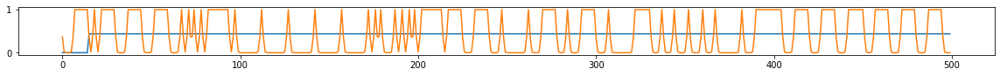

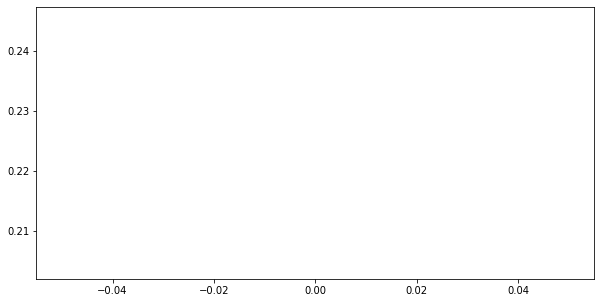

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.65it/s  0.2072                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 64
TRAIN LOSS: 0.2038886331849628
VAL LOSS: 0.20199192563692728
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.06656658494886021


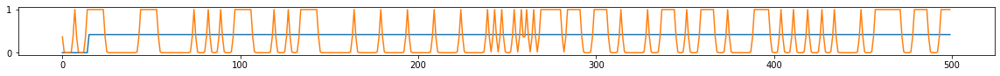

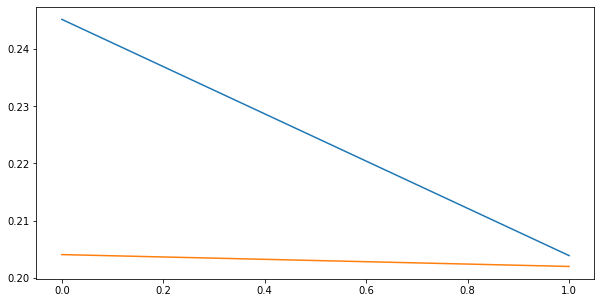

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.62it/s  0.2003                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 64
TRAIN LOSS: 0.20074553622139824
VAL LOSS: 0.1998724573188358
VAL_ACC05: 0.09375
VAL_ACC04: 0.09375


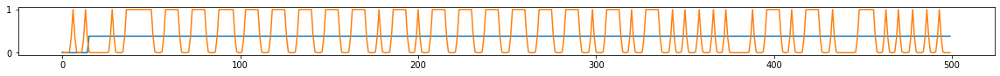

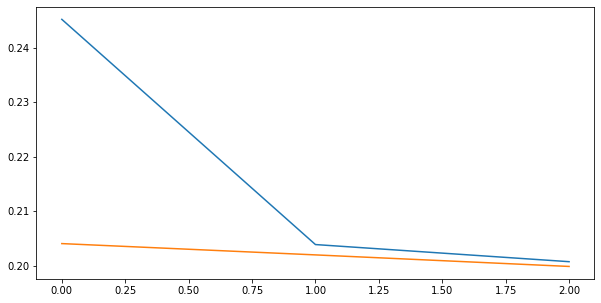

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.63it/s  0.1917                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 64
TRAIN LOSS: 0.20277112474044165
VAL LOSS: 0.20124454299608865
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.14899017779366364


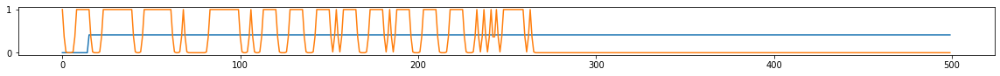

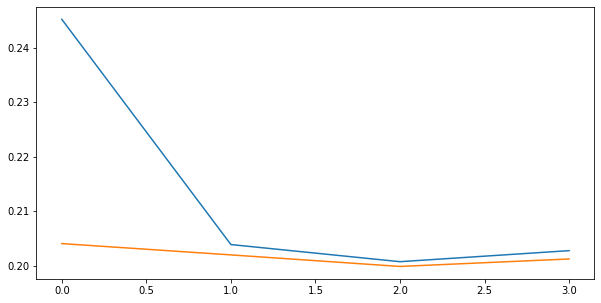

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.61it/s  0.1959                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 64
TRAIN LOSS: 0.2019987441599369
VAL LOSS: 0.20165182484520805
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.23302774143830915


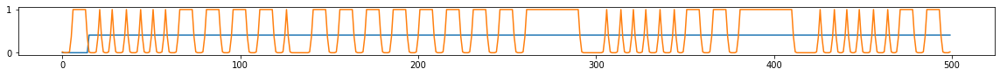

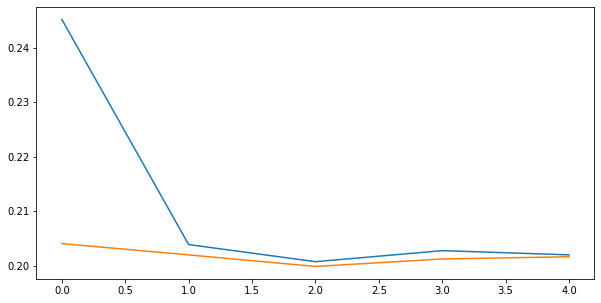

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.65it/s  0.1988                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 64
TRAIN LOSS: 0.20340077330668768
VAL LOSS: 0.20503723124663034
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.23441799991941956


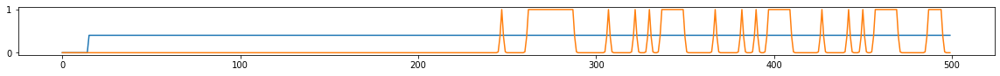

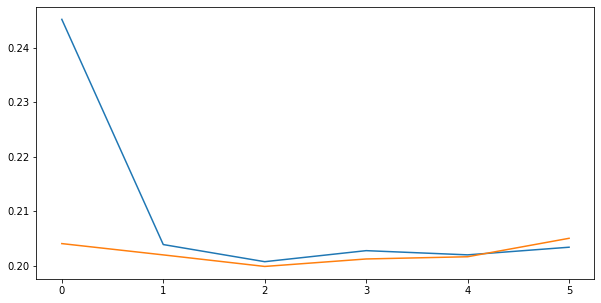

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.62it/s  0.2026                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 64
TRAIN LOSS: 0.2019812154273192
VAL LOSS: 0.2053389930062824
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.06944444444444445


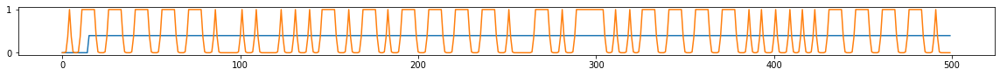

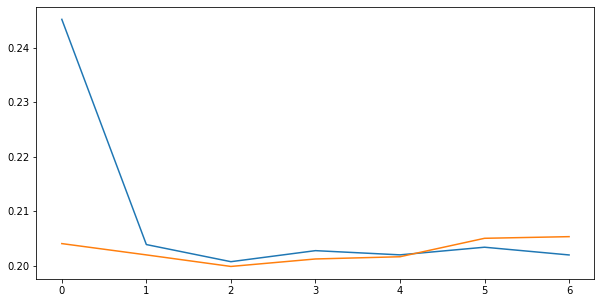

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.62it/s  0.1985                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 64
TRAIN LOSS: 0.20261924382713106
VAL LOSS: 0.20315011176798078
VAL_ACC05: 0.052083333333333336
VAL_ACC04: 0.07502258322291726


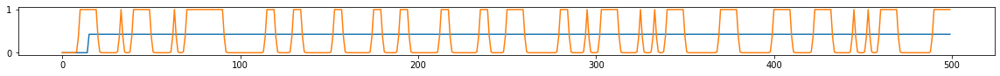

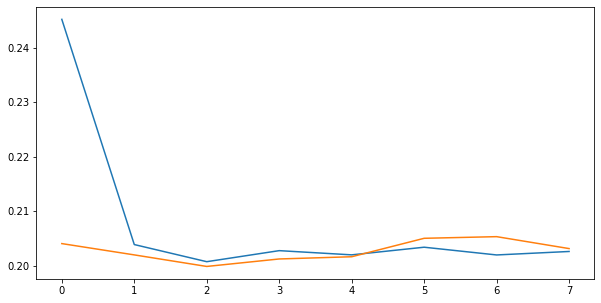

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2070                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 64
TRAIN LOSS: 0.20272492037879097
VAL LOSS: 0.2042633444070816
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06597222222222222


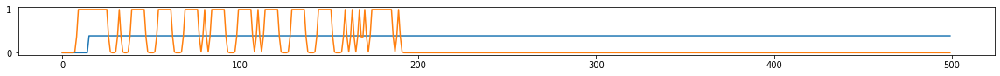

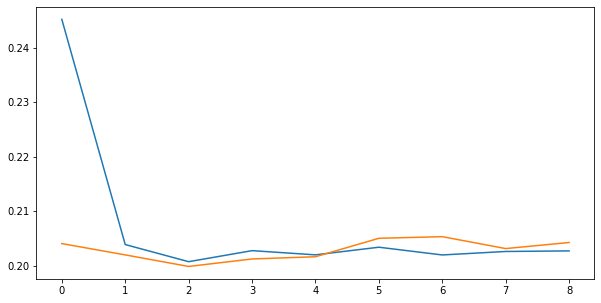

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1988                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 64
TRAIN LOSS: 0.2015577368438244
VAL LOSS: 0.20398135317696464
VAL_ACC05: 0.09722222222222222
VAL_ACC04: 0.09722222222222222


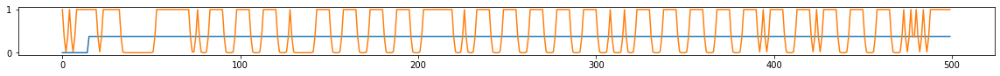

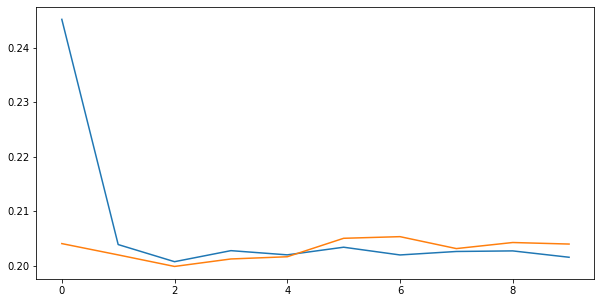

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.62it/s  0.2065                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 64
TRAIN LOSS: 0.2013033524983459
VAL LOSS: 0.20490454468462202
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.07291666666666667


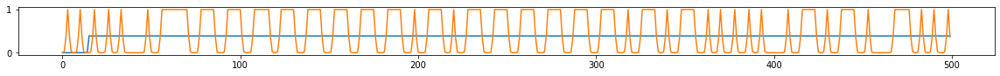

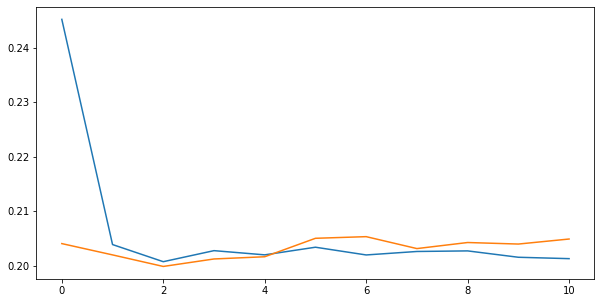

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.61it/s  0.2079                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 64
TRAIN LOSS: 0.20194199598497814
VAL LOSS: 0.20246252748701307
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.0798611111111111


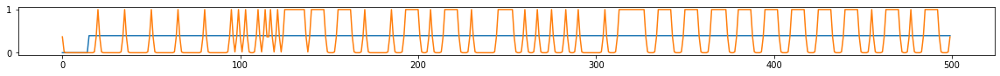

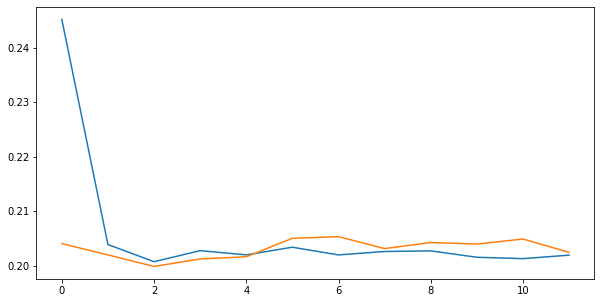

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.61it/s  0.2035                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 64
TRAIN LOSS: 0.20218966032067934
VAL LOSS: 0.2009394582774904
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.202242899303811


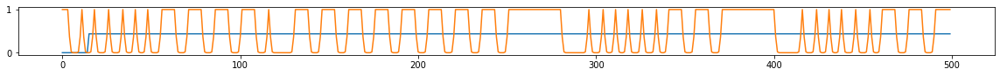

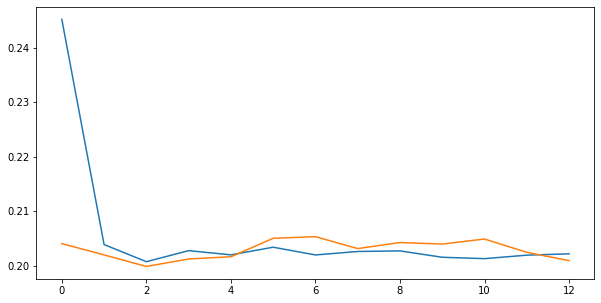

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.61it/s  0.2034                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 64
TRAIN LOSS: 0.2033010816408528
VAL LOSS: 0.20329691304100883
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.15252478681459491


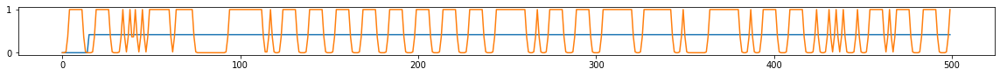

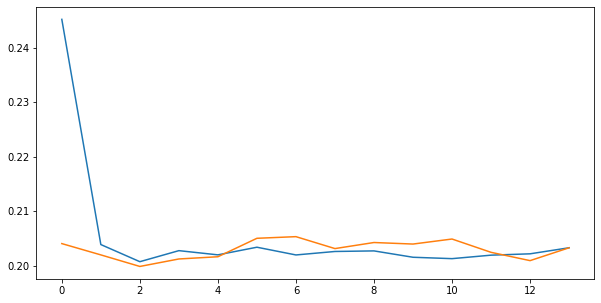

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1979                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 64
TRAIN LOSS: 0.2029436036116547
VAL LOSS: 0.20247061716185677
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06858144472661347


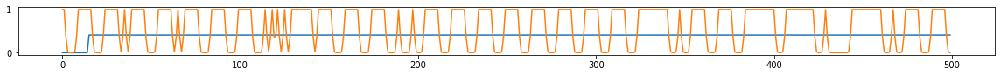

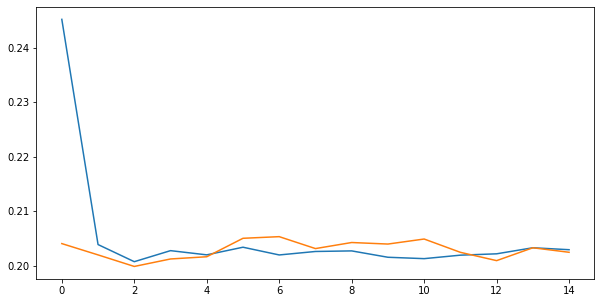

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2102                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 64
TRAIN LOSS: 0.2026182363430659
VAL LOSS: 0.20481932163238525
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.06964894532033925


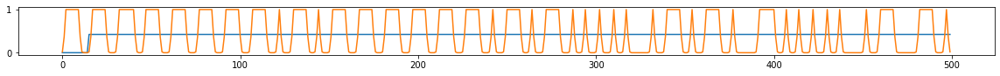

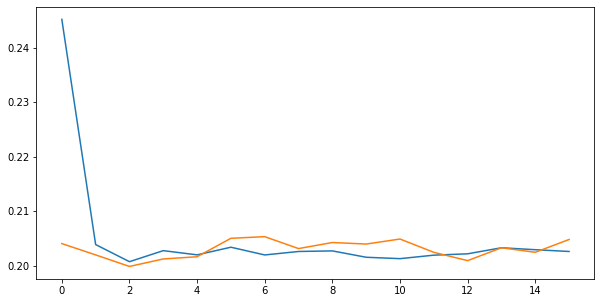

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.62it/s  0.1978                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 64
TRAIN LOSS: 0.20286859944462776
VAL LOSS: 0.20399421950181326
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.09007427155162841


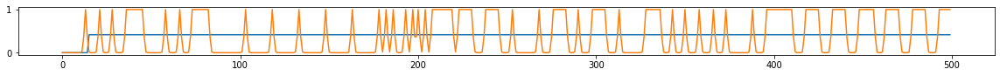

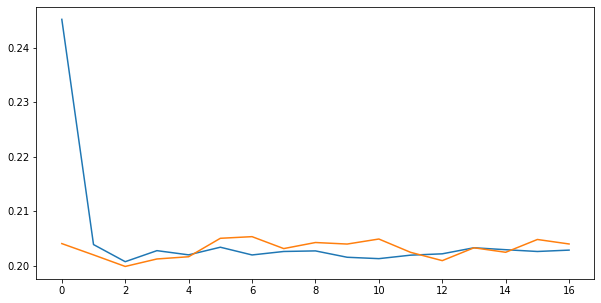

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.2085                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 64
TRAIN LOSS: 0.20168191153142187
VAL LOSS: 0.20276679264174569
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.13325351114437065


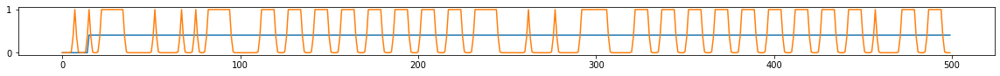

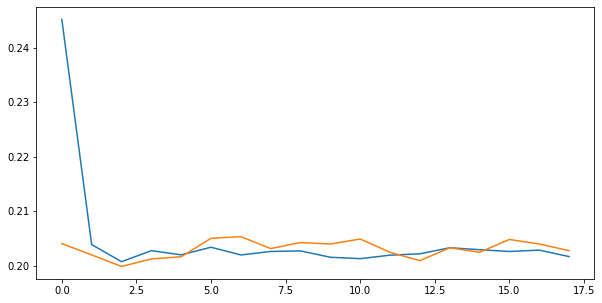

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.1923                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 64
TRAIN LOSS: 0.20252210357122952
VAL LOSS: 0.2037018040815989
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.08311861380230932


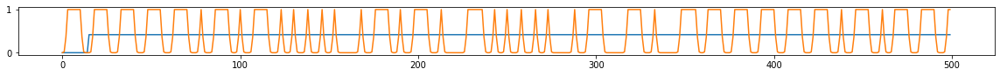

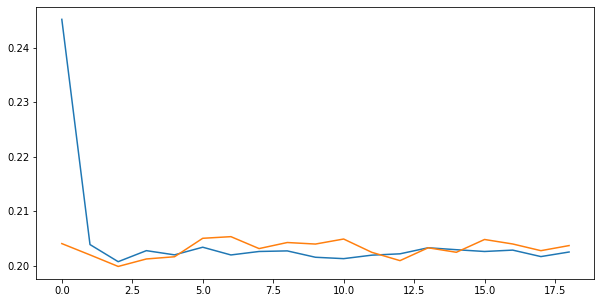

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2069                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 64
TRAIN LOSS: 0.20123598683211538
VAL LOSS: 0.20028694305155012
VAL_ACC05: 0.09375
VAL_ACC04: 0.10143544891859718


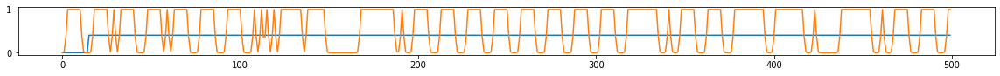

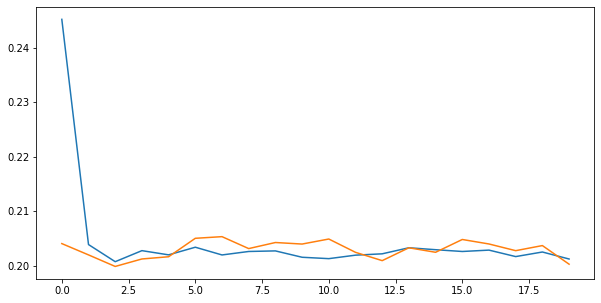

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2023                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 64
TRAIN LOSS: 0.2015901654958725
VAL LOSS: 0.2048220286766688
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.08091850835800755


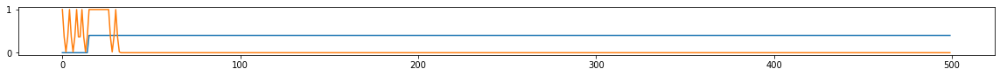

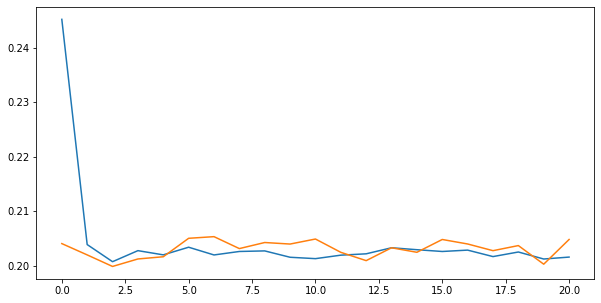

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2137                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 64
TRAIN LOSS: 0.20158996805548668
VAL LOSS: 0.20220225718286303
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.1359299091753362


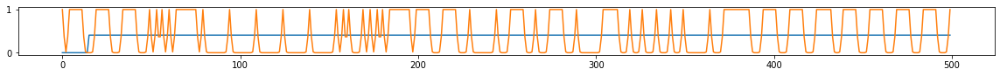

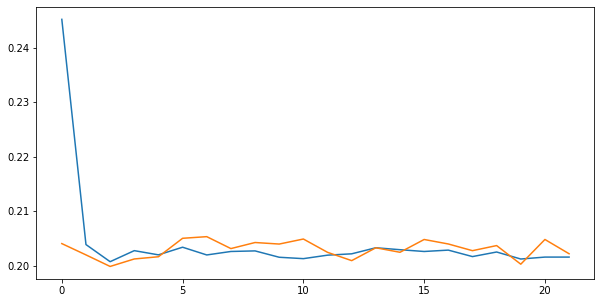

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1947                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 64
TRAIN LOSS: 0.20090239288078415
VAL LOSS: 0.20613751808802286
VAL_ACC05: 0.09027777777777778
VAL_ACC04: 0.09027777777777778


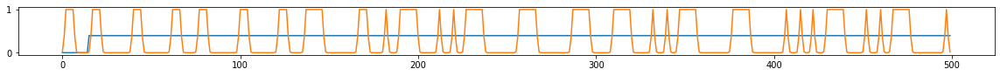

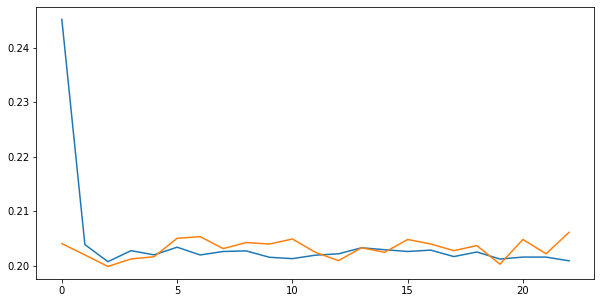

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2012                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 64
TRAIN LOSS: 0.2023567631840706
VAL LOSS: 0.20317263901233673
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.059027777777777776


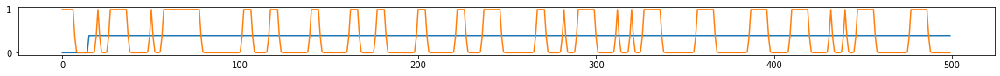

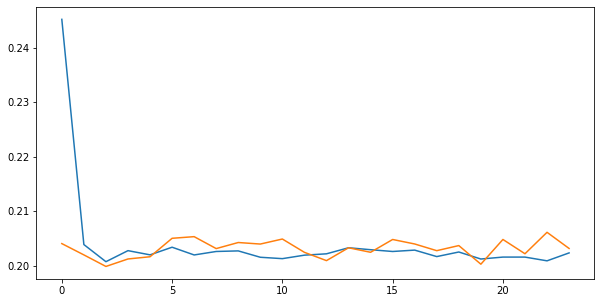

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2025                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 64
TRAIN LOSS: 0.20150742969579166
VAL LOSS: 0.20370384719636705
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.10373804350997626


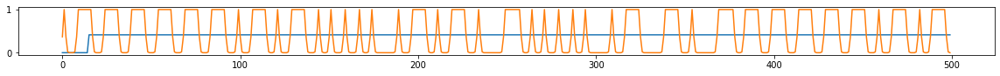

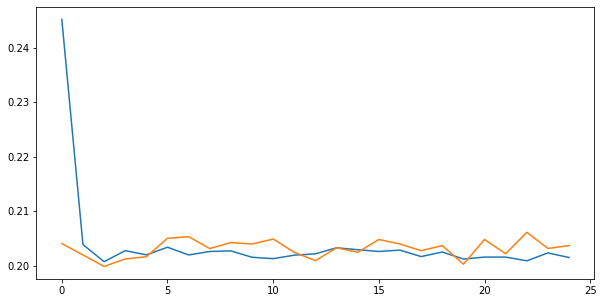

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2004                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 64
TRAIN LOSS: 0.20243359067373806
VAL LOSS: 0.20216352244218191
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.11663336668645462


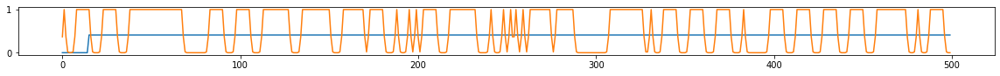

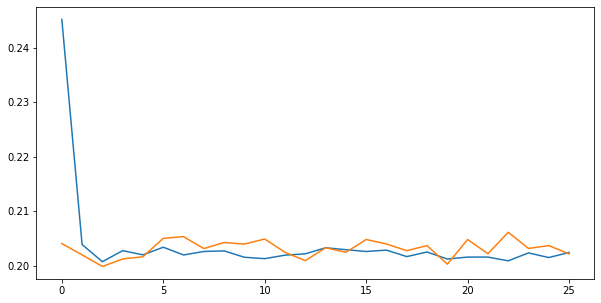

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1975                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 64
TRAIN LOSS: 0.2022286955681112
VAL LOSS: 0.20558718840281168
VAL_ACC05: 0.052083333333333336
VAL_ACC04: 0.11627217450795163


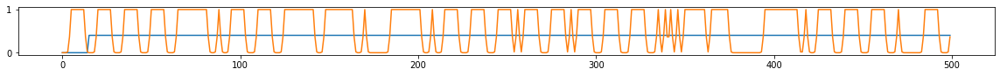

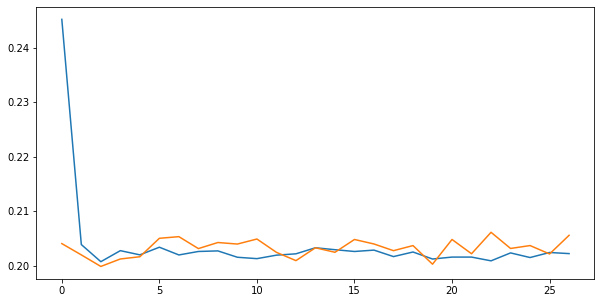

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1969                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 64
TRAIN LOSS: 0.20306145565377343
VAL LOSS: 0.20621303386158413
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.20930363021584278


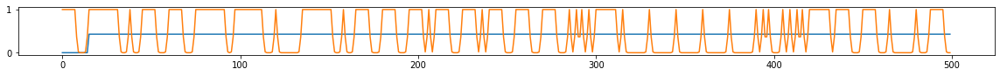

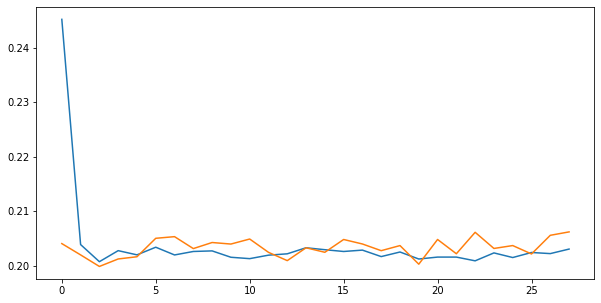

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1972                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 64
TRAIN LOSS: 0.20149693803654778
VAL LOSS: 0.20371922353903452
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08578458727666886


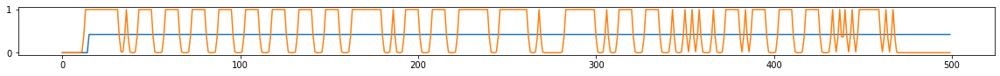

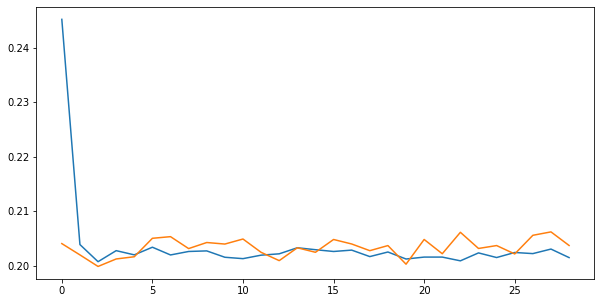

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1996                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 64
TRAIN LOSS: 0.2027160707447264
VAL LOSS: 0.20210839807987213
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.14731798681285635


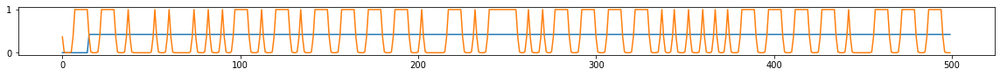

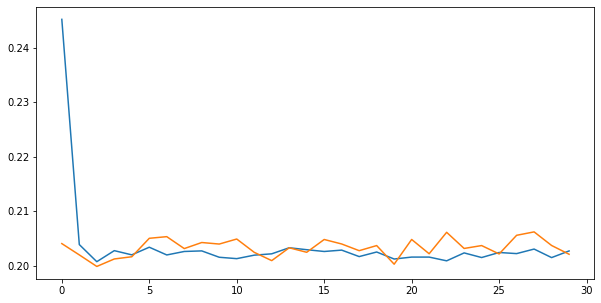

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2142                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 64
TRAIN LOSS: 0.2027475709716479
VAL LOSS: 0.203233293361134
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.07737628122017892


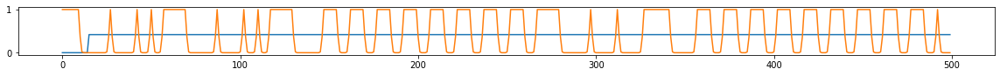

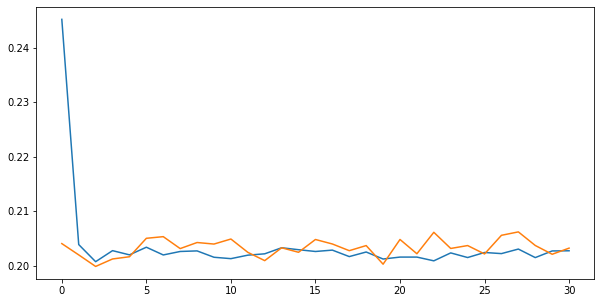

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1990                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 64
TRAIN LOSS: 0.20189978182315826
VAL LOSS: 0.20544206764962938
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.059027777777777776


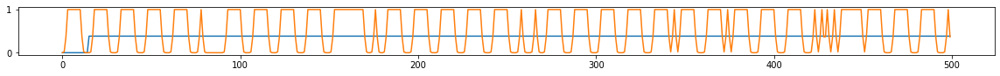

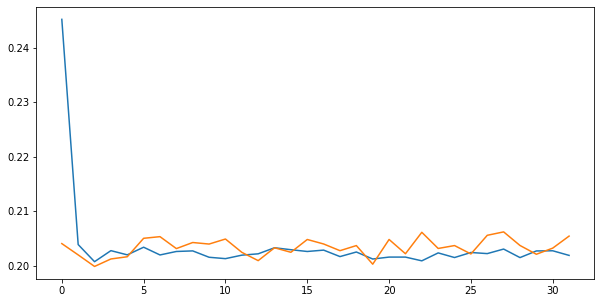

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2040                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 64
TRAIN LOSS: 0.2022213472260369
VAL LOSS: 0.2040456384420395
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.098074159700429


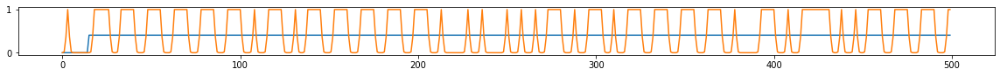

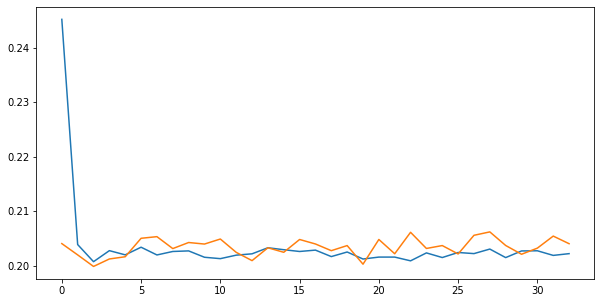

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1981                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 64
TRAIN LOSS: 0.20218090009358194
VAL LOSS: 0.20119459264808232
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.10739830686115781


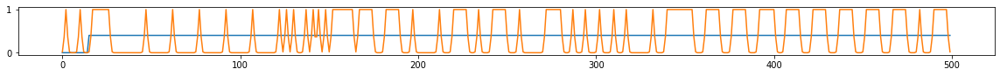

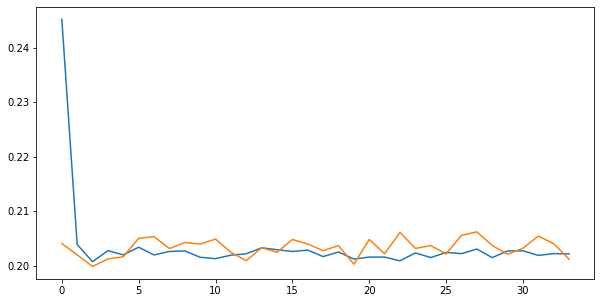

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2097                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 64
TRAIN LOSS: 0.20221191065178978
VAL LOSS: 0.20175746911101872
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.12601559792949993


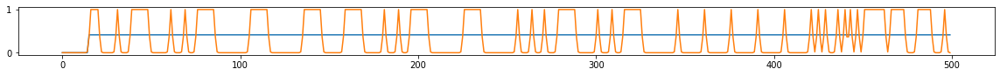

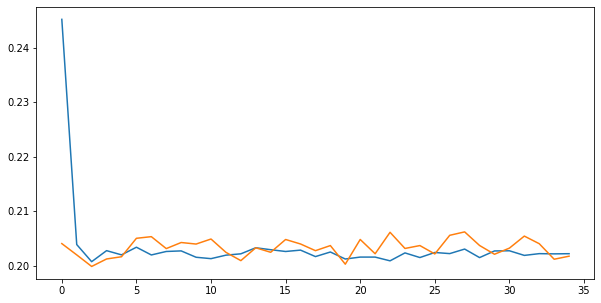

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.54it/s  0.2028                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 64
TRAIN LOSS: 0.20163969116078484
VAL LOSS: 0.20522801412476432
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.06944444444444445


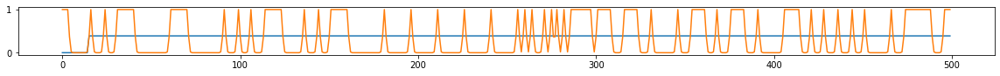

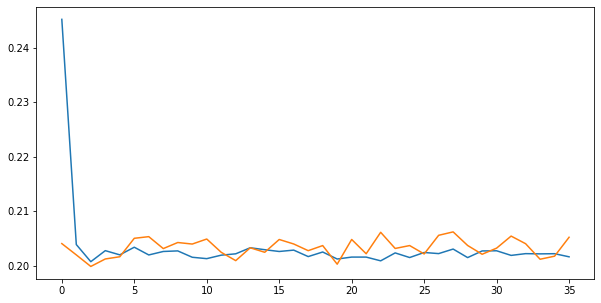

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1964                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 64
TRAIN LOSS: 0.20156076716052163
VAL LOSS: 0.20231256716781193
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.1119983320185917


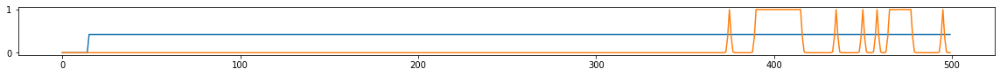

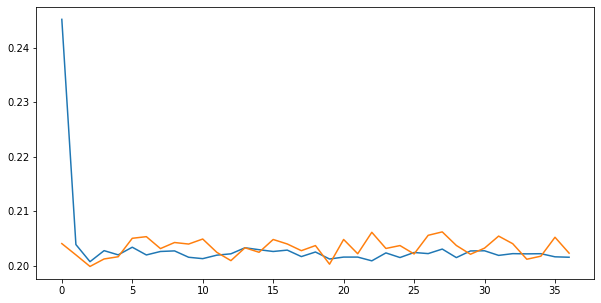

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1879                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 64
TRAIN LOSS: 0.20224219063917795
VAL LOSS: 0.20433610015445286
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.07359296582746021


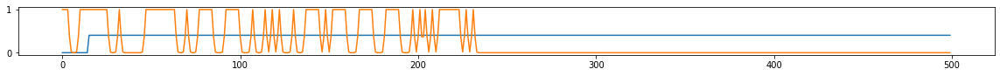

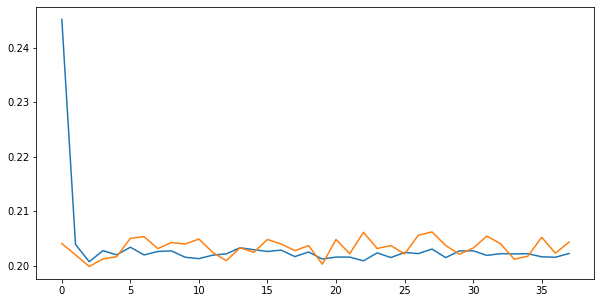

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2078                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 64
TRAIN LOSS: 0.20208713163932165
VAL LOSS: 0.20573813219865164
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06863349957735063


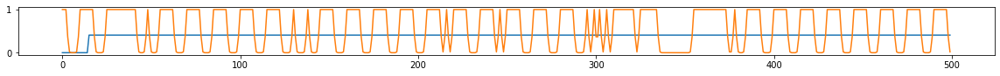

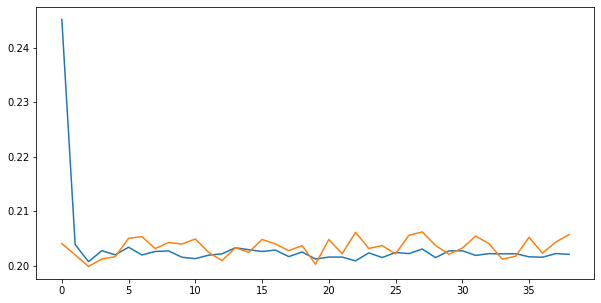

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2081                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 64
TRAIN LOSS: 0.2021406888961792
VAL LOSS: 0.20207877622710335
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.07232880847427998


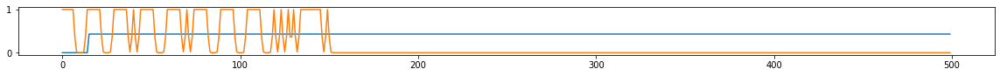

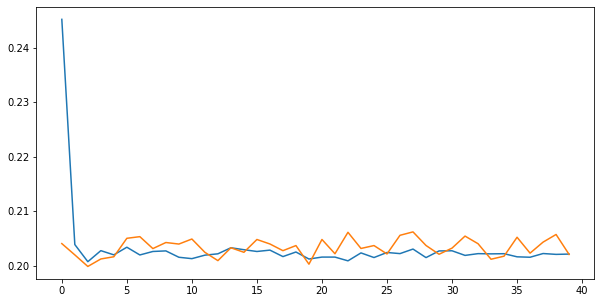

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.2000                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 64
TRAIN LOSS: 0.2028344948258665
VAL LOSS: 0.20232597324583265
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.3039096079178386


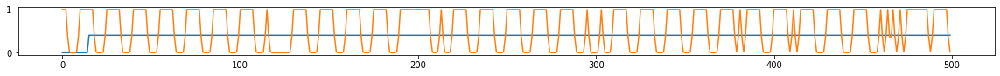

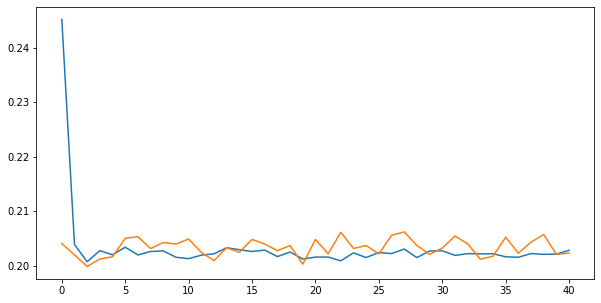

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1905                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 64
TRAIN LOSS: 0.20153151080012321
VAL LOSS: 0.2037582215335634
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.10867803264785157


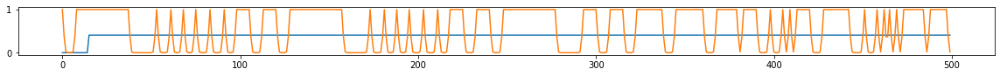

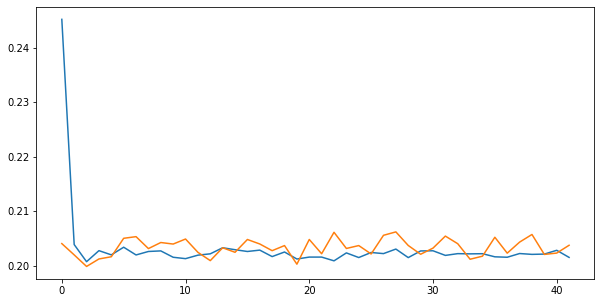

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2015                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 64
TRAIN LOSS: 0.2035804498526785
VAL LOSS: 0.20260405540466309
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.18042754048774542


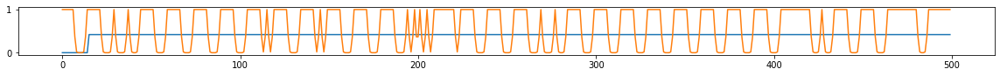

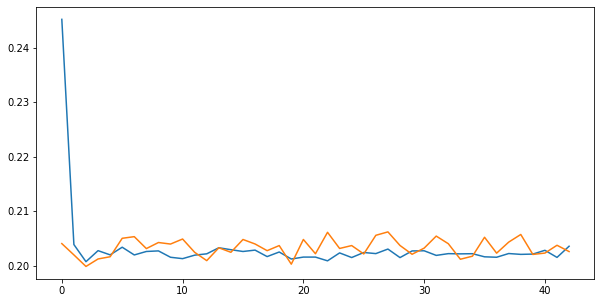

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2037                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 64
TRAIN LOSS: 0.20166562497615814
VAL LOSS: 0.20550844901137882
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.0798611111111111


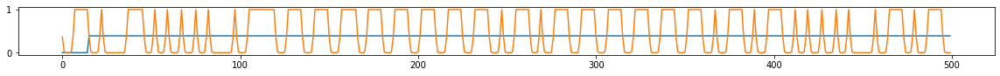

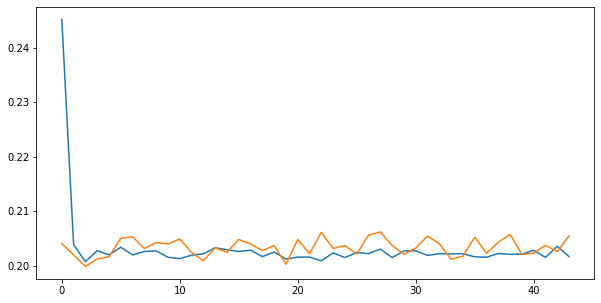

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2055                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 64
TRAIN LOSS: 0.20387334542142022
VAL LOSS: 0.20302094022432962
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.14073650365021373


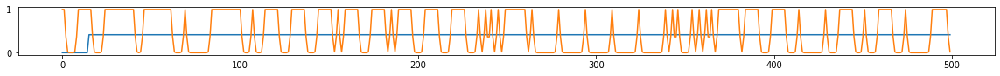

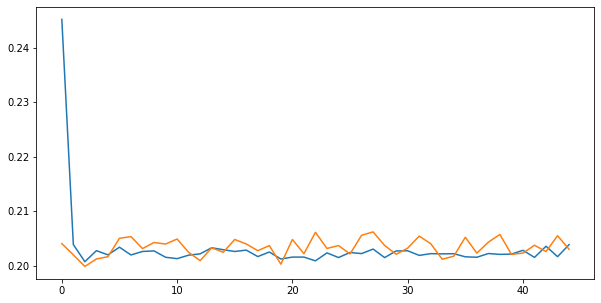

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2048                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 64
TRAIN LOSS: 0.20179099092880884
VAL LOSS: 0.2049625747733646
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.08632778570109173


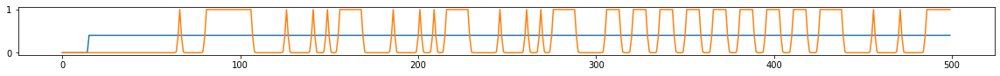

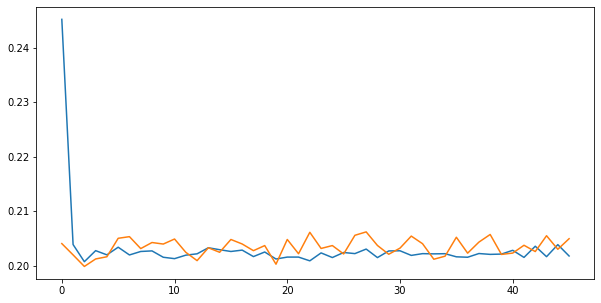

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2068                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 64
TRAIN LOSS: 0.20240026174320114
VAL LOSS: 0.2047490659687254
VAL_ACC05: 0.05555555555555555
VAL_ACC04: 0.05555555555555555


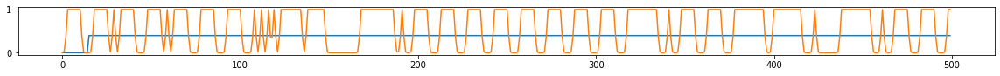

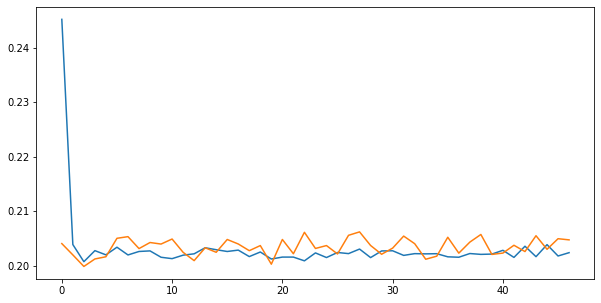

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2073                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 64
TRAIN LOSS: 0.20298472419381142
VAL LOSS: 0.20371607608265346
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.06700589769954868


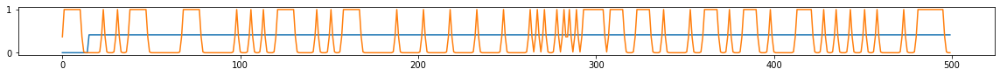

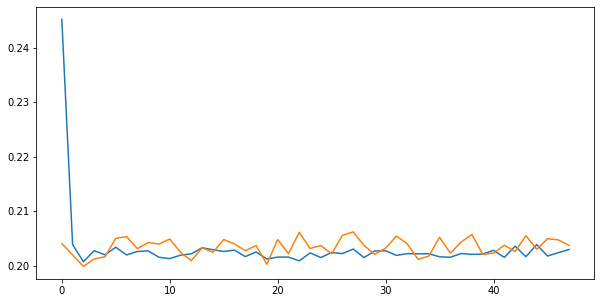

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.52it/s  0.2046                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 64
TRAIN LOSS: 0.20257220500045353
VAL LOSS: 0.2023109710878796
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.07642250103568082


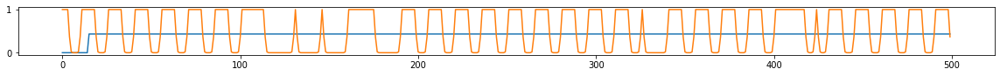

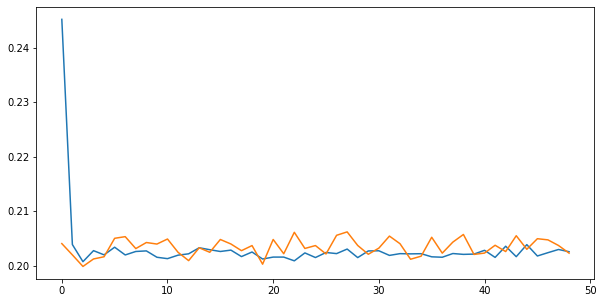

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1956                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 64
TRAIN LOSS: 0.20272046989864773
VAL LOSS: 0.2035409758488337
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.09054225719194231


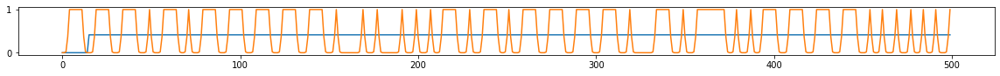

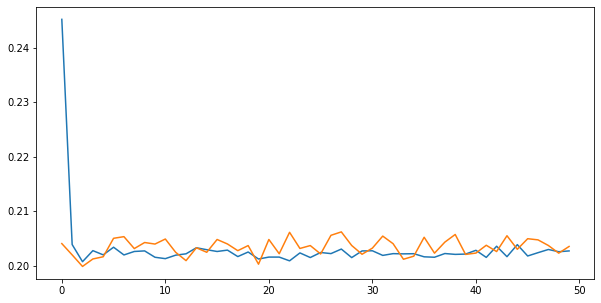

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2161                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 64
TRAIN LOSS: 0.2030675949321853
VAL LOSS: 0.20405106412039864
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.22694376543285516


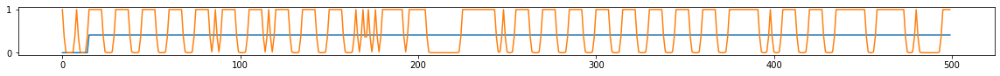

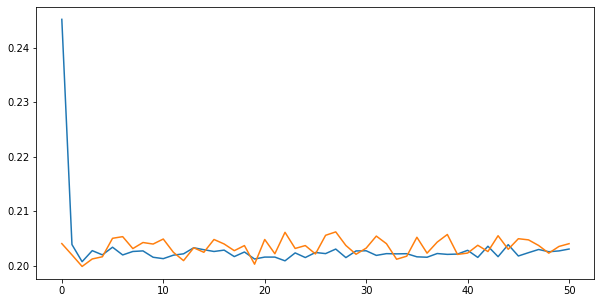

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1908                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 64
TRAIN LOSS: 0.20266447133488125
VAL LOSS: 0.20164287752575344
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.15630226907385877


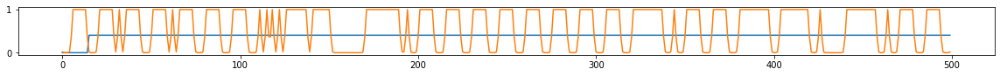

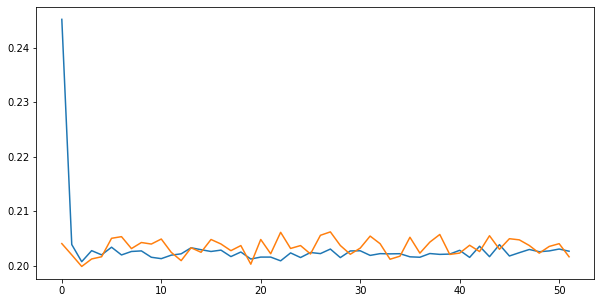

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1953                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 64
TRAIN LOSS: 0.20212296727630827
VAL LOSS: 0.20222406420442793
VAL_ACC05: 0.09375
VAL_ACC04: 0.09375


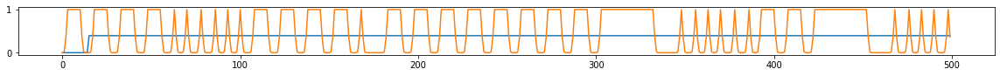

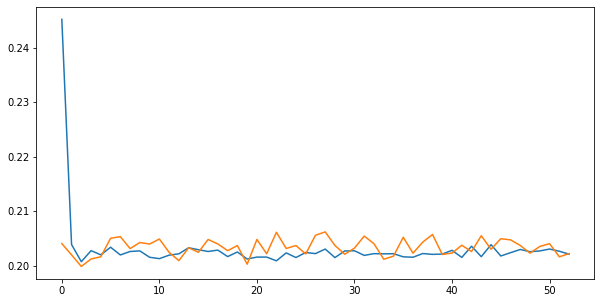

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2047                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 64
TRAIN LOSS: 0.20244689120186699
VAL LOSS: 0.2031314621369044
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.09518420336313954


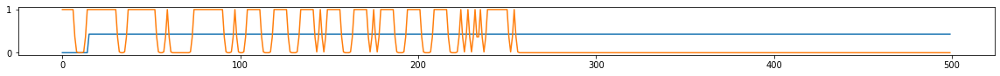

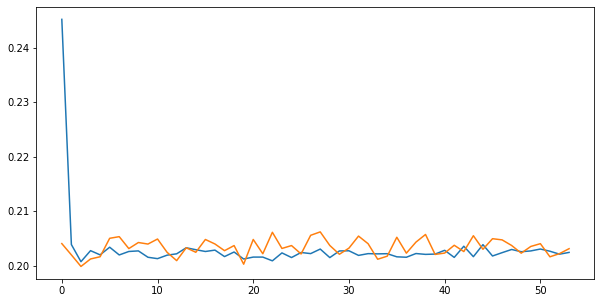

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1975                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 64
TRAIN LOSS: 0.20231767412688997
VAL LOSS: 0.20351885590288374
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.059027777777777776


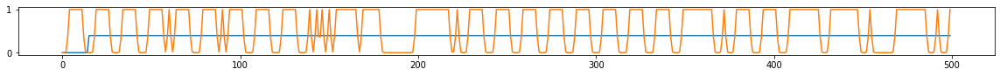

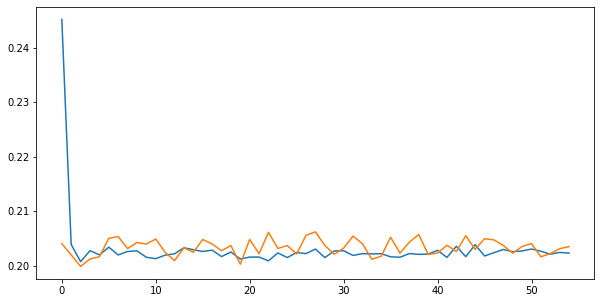

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1955                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 64
TRAIN LOSS: 0.20326917370160422
VAL LOSS: 0.20357477333810595
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.15572705960760413


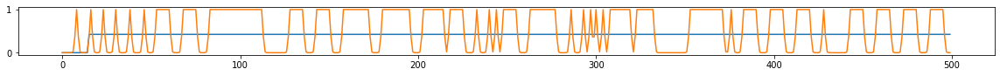

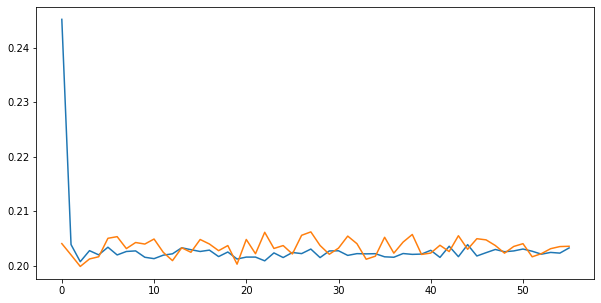

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1960                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 64
TRAIN LOSS: 0.20194465377264553
VAL LOSS: 0.20331467191378275
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.12145639378802536


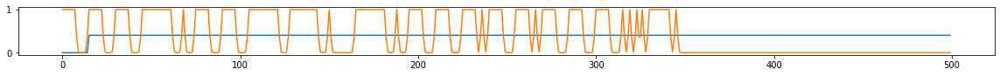

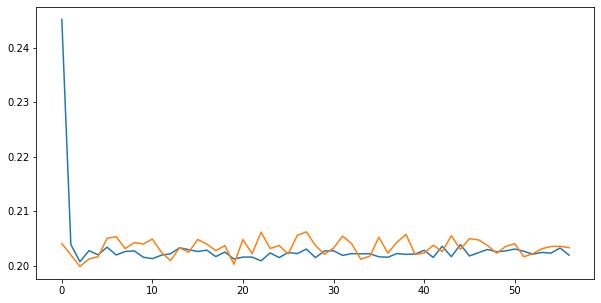

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2065                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 64
TRAIN LOSS: 0.20322353351447317
VAL LOSS: 0.202491980459955
VAL_ACC05: 0.0625
VAL_ACC04: 0.0654753880818581


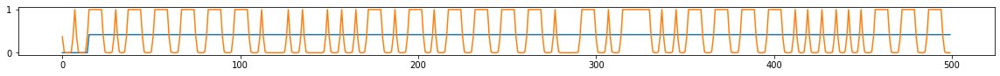

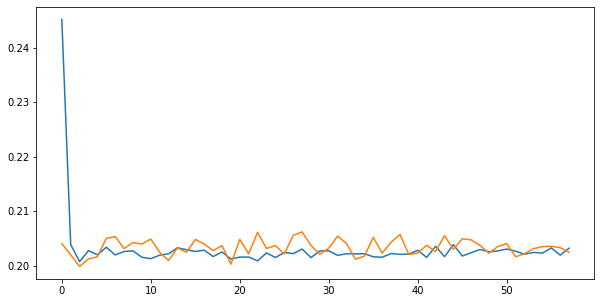

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2079                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 64
TRAIN LOSS: 0.20158334780070516
VAL LOSS: 0.20350233051511976
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.07302026238028385


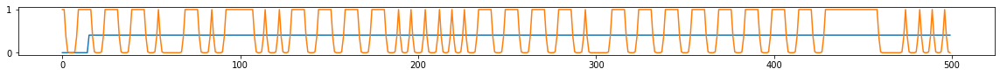

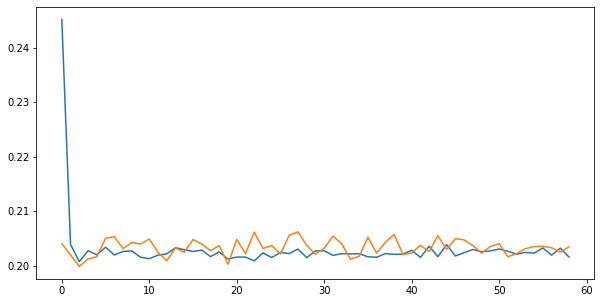

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.53it/s  0.1957                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 64
TRAIN LOSS: 0.20199242730935416
VAL LOSS: 0.20626778569486406
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.0798611111111111


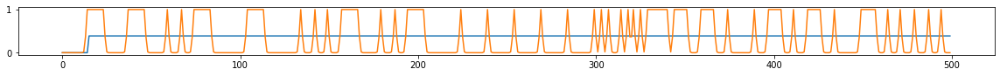

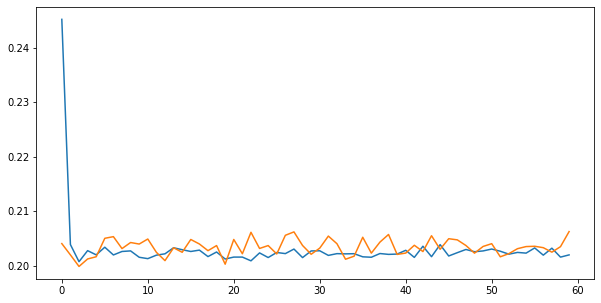

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1933                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 64
TRAIN LOSS: 0.2024694892267386
VAL LOSS: 0.2038605676756965
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.13591476417880954


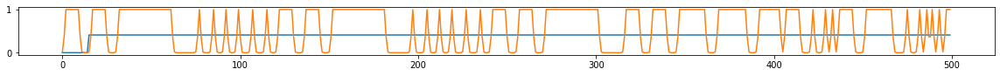

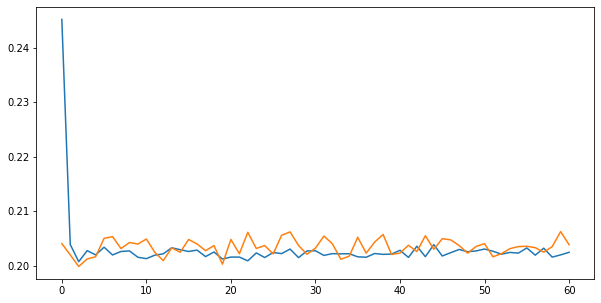

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1961                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 64
TRAIN LOSS: 0.20202611345383856
VAL LOSS: 0.20474360717667472
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.080947960911814


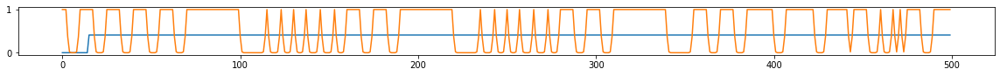

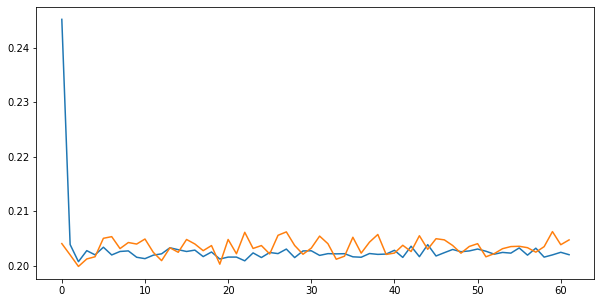

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2084                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 64
TRAIN LOSS: 0.20247715132104027
VAL LOSS: 0.20368289450804392
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.11882751726529985


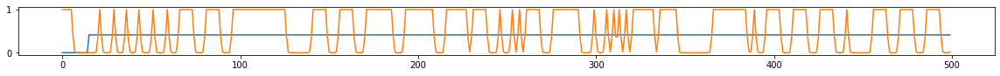

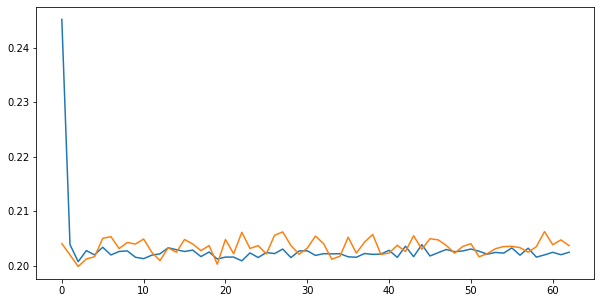

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1930                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 64
TRAIN LOSS: 0.20247272981537712
VAL LOSS: 0.20252019663651785
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.08864516416988982


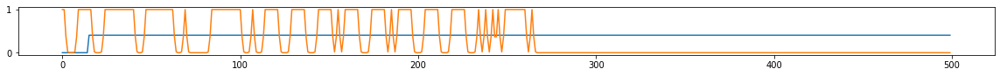

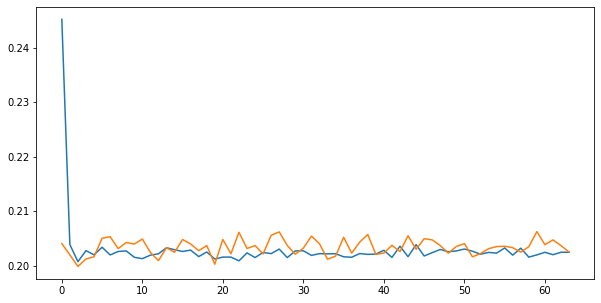

558.1886668205261 secs


In [ ]:
start = time.time()

epochs = 64
train()

end = time.time()
print(end - start, 'secs')

In [ ]:
torch.save(model.state_dict(), model_path + str(epoch_cum) + '.pt')

In [ ]:
train_hist = train_hist[10:]
val_hist = val_hist[10:]

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1985                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

64 of 128
TRAIN LOSS: 0.20231560700469547
VAL LOSS: 0.20383993950155047
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.16141236797279612


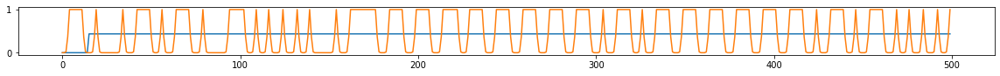

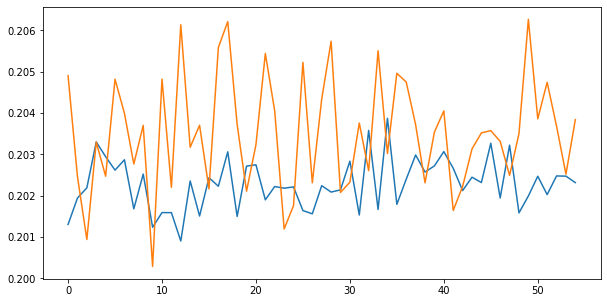

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1873                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

65 of 128
TRAIN LOSS: 0.2016977204216851
VAL LOSS: 0.20307575828499264
VAL_ACC05: 0.052083333333333336
VAL_ACC04: 0.0790171054182926


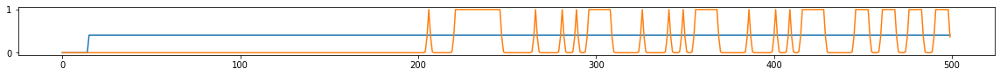

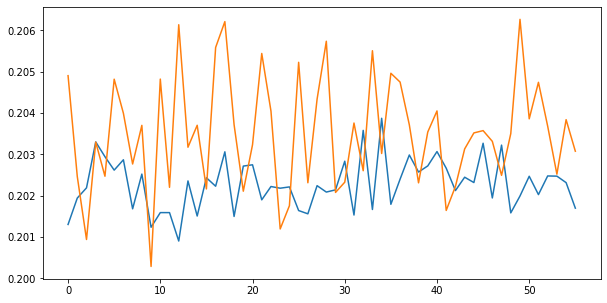

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.2025                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

66 of 128
TRAIN LOSS: 0.2021250737210115
VAL LOSS: 0.20263026489151847
VAL_ACC05: 0.05555555555555555
VAL_ACC04: 0.05628437311326679


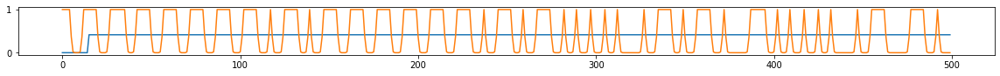

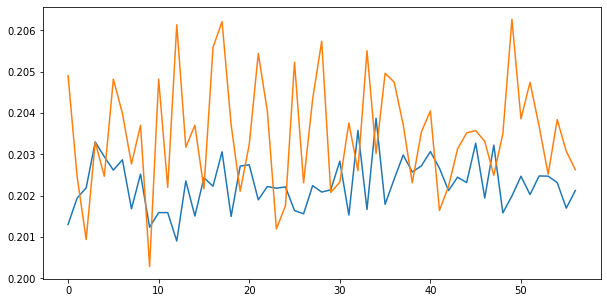

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1914                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

67 of 128
TRAIN LOSS: 0.2029620185494423
VAL LOSS: 0.20260659025775063
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.08194375594579392


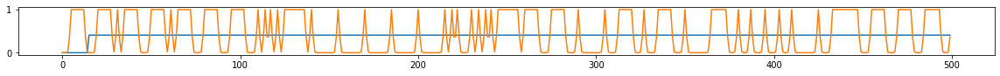

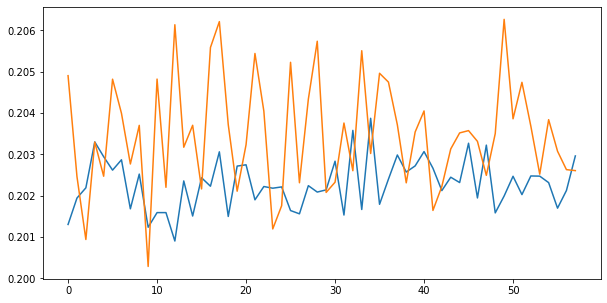

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1999                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

68 of 128
TRAIN LOSS: 0.2027737812863456
VAL LOSS: 0.20364635520511204
VAL_ACC05: 0.052083333333333336
VAL_ACC04: 0.10318741426748868


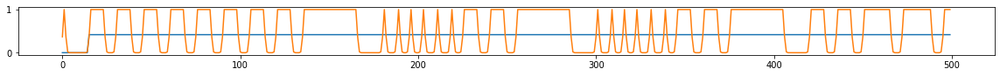

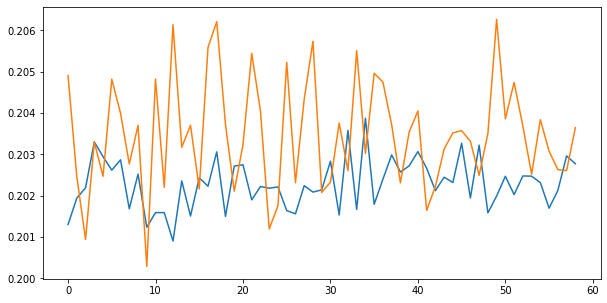

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2005                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

69 of 128
TRAIN LOSS: 0.20133120194077492
VAL LOSS: 0.20248307453261483
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.11798398444395142


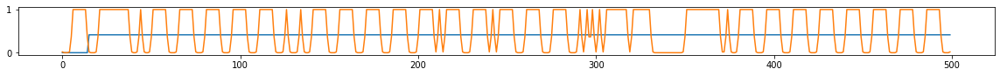

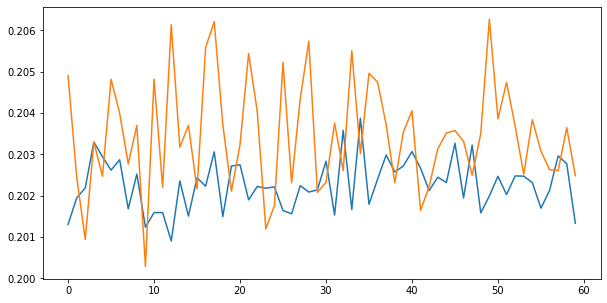

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.52it/s  0.2014                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

70 of 128
TRAIN LOSS: 0.20265697522295845
VAL LOSS: 0.2026762002044254
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.1855032991050475


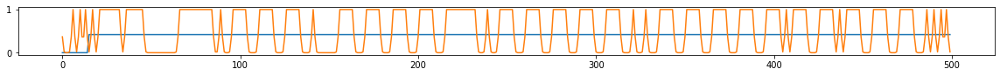

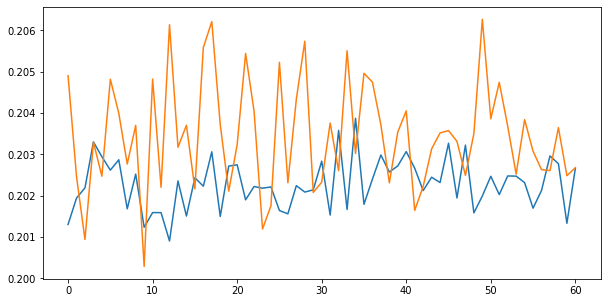

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1957                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

71 of 128
TRAIN LOSS: 0.2018210490544637
VAL LOSS: 0.2029816210269928
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.18075497785693118


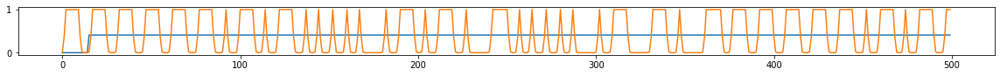

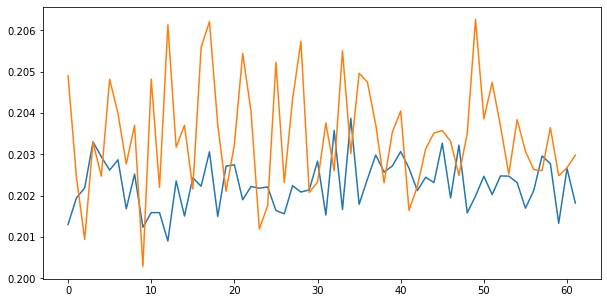

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2000                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

72 of 128
TRAIN LOSS: 0.20076870835489696
VAL LOSS: 0.2029016895426644
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.09596289642009043


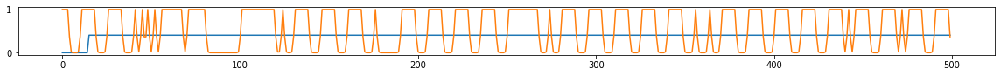

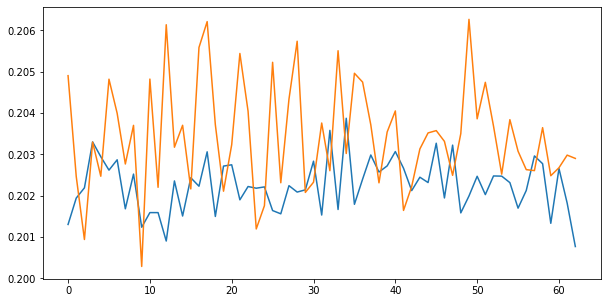

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1994                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

73 of 128
TRAIN LOSS: 0.20139932052956688
VAL LOSS: 0.20223726497756112
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.08680555555555555


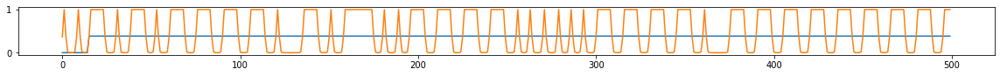

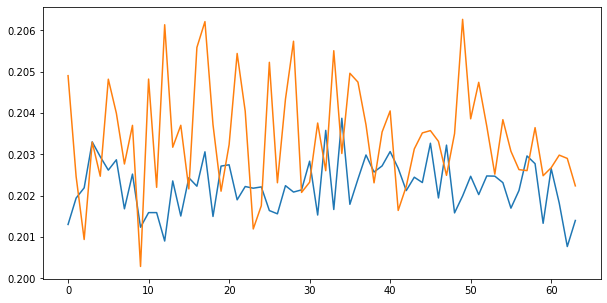

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2041                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

74 of 128
TRAIN LOSS: 0.20188351886139977
VAL LOSS: 0.20382210612297058
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.13245827244632866


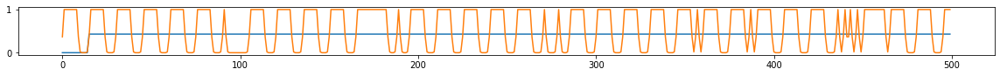

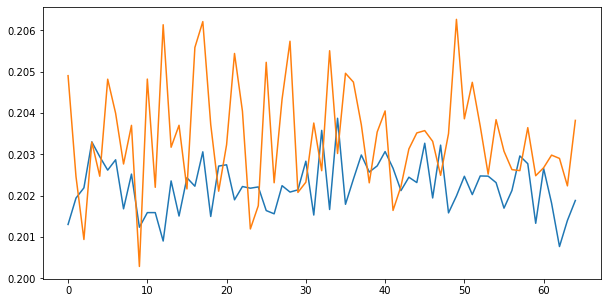

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1955                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

75 of 128
TRAIN LOSS: 0.20121032951606643
VAL LOSS: 0.20344213975800407
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.07472834757394461


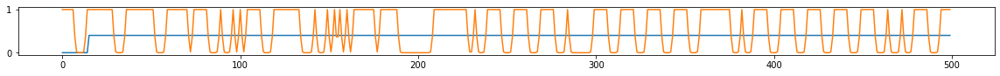

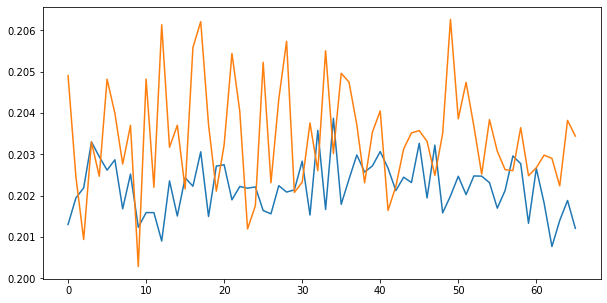

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2047                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

76 of 128
TRAIN LOSS: 0.2017514349685775
VAL LOSS: 0.20424824125236934
VAL_ACC05: 0.052083333333333336
VAL_ACC04: 0.07441006589157767


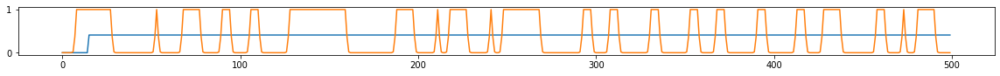

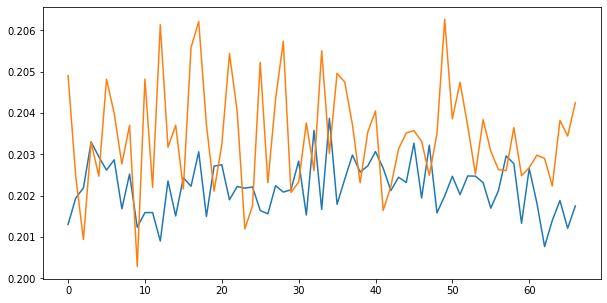

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1988                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

77 of 128
TRAIN LOSS: 0.2019982635974884
VAL LOSS: 0.20230129692289564
VAL_ACC05: 0.09027777777777778
VAL_ACC04: 0.2826636785526191


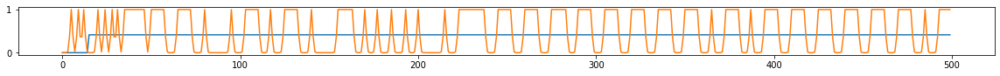

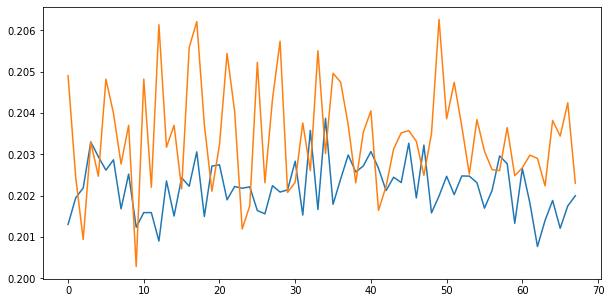

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1997                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

78 of 128
TRAIN LOSS: 0.20181847943200004
VAL LOSS: 0.2030678242444992
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08698832908067698


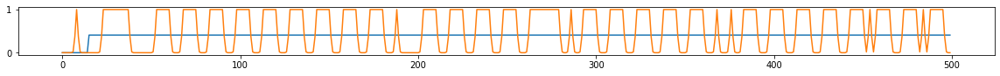

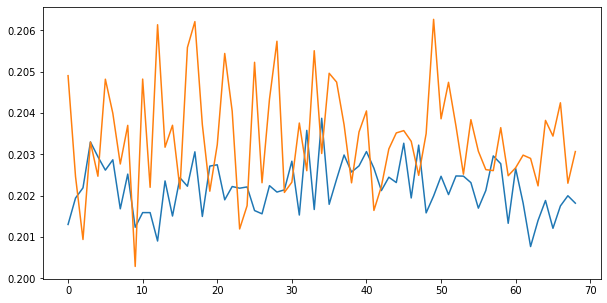

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1969                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

79 of 128
TRAIN LOSS: 0.20259741031461292
VAL LOSS: 0.20296551121605766
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.10400724005134628


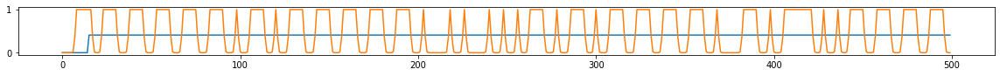

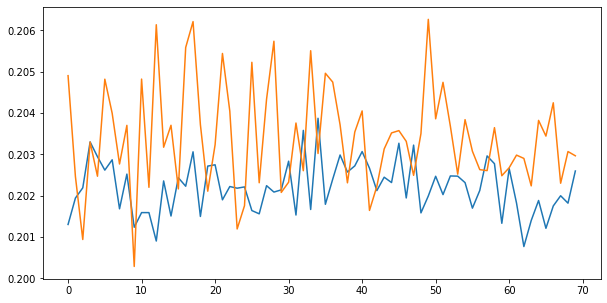

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.1916                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

80 of 128
TRAIN LOSS: 0.20226711904009184
VAL LOSS: 0.20331589215331608
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.07792719529664453


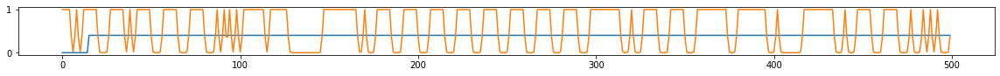

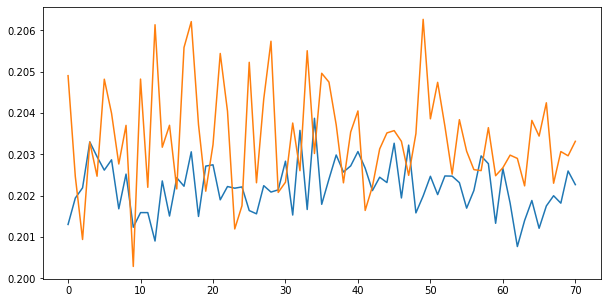

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2087                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

81 of 128
TRAIN LOSS: 0.20184684006704223
VAL LOSS: 0.2040272139840656
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.0763888888888889


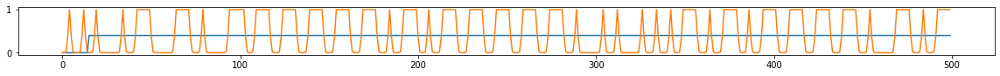

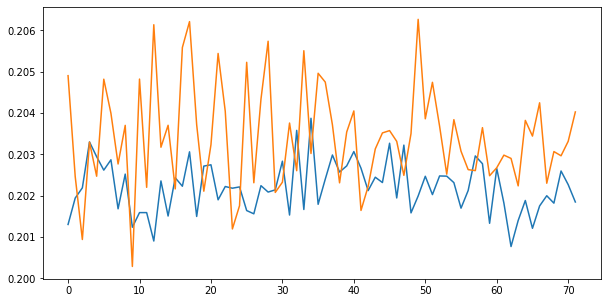

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.2062                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

82 of 128
TRAIN LOSS: 0.2032535837756263
VAL LOSS: 0.20295540822876823
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.09660410683072561


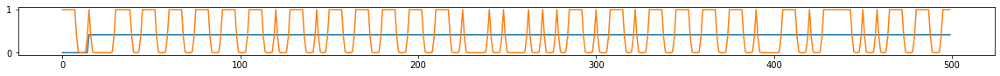

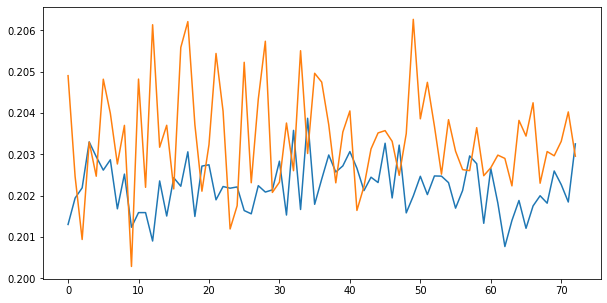

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.1996                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

83 of 128
TRAIN LOSS: 0.2023105708261331
VAL LOSS: 0.20503745641973284
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.19763951154950707


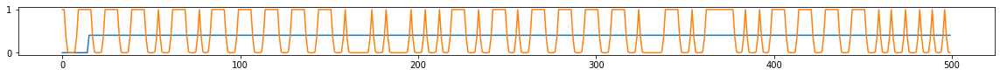

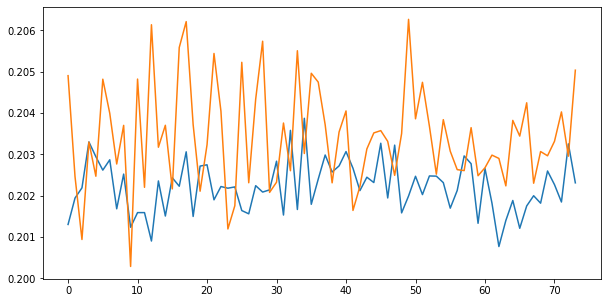

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2036                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

84 of 128
TRAIN LOSS: 0.2016767573853334
VAL LOSS: 0.20183624823888144
VAL_ACC05: 0.0625
VAL_ACC04: 0.06276218763898404


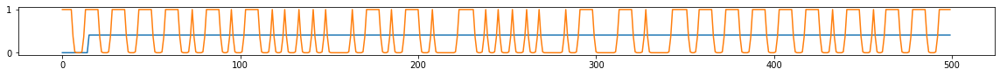

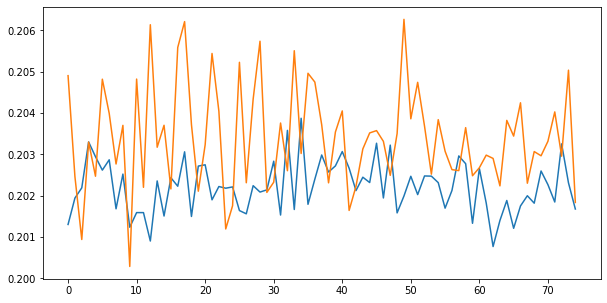

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1972                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

85 of 128
TRAIN LOSS: 0.20193155647979844
VAL LOSS: 0.20224660800562966
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08333333333333333


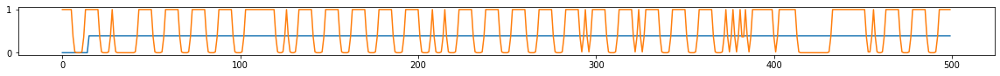

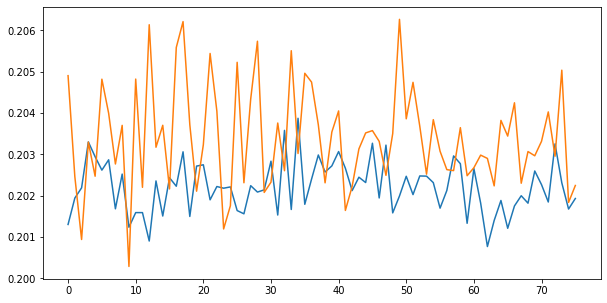

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1954                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

86 of 128
TRAIN LOSS: 0.2029465101659298
VAL LOSS: 0.20362199346224466
VAL_ACC05: 0.0625
VAL_ACC04: 0.06375040098579915


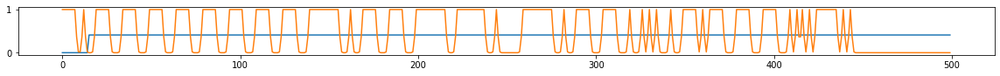

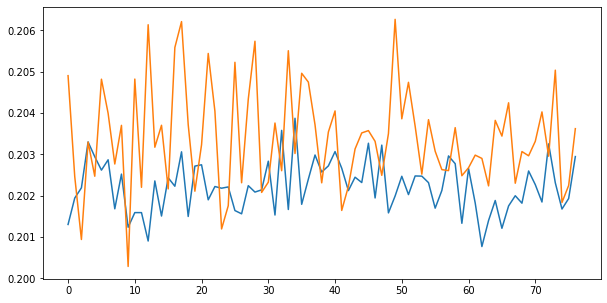

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2123                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

87 of 128
TRAIN LOSS: 0.20217196808920967
VAL LOSS: 0.20347633295589024
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.1976612951701094


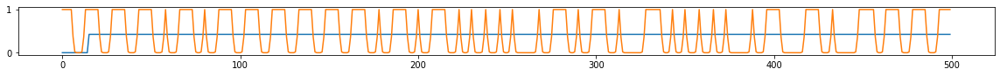

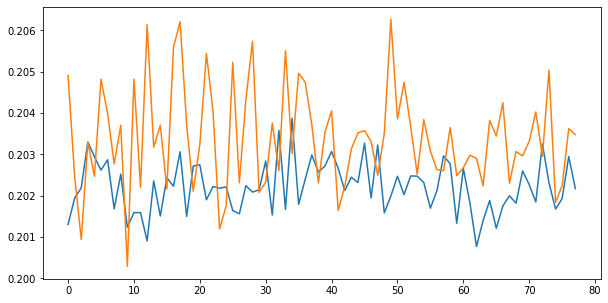

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2119                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

88 of 128
TRAIN LOSS: 0.20284746090571085
VAL LOSS: 0.20563055078188577
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.05936388003500833


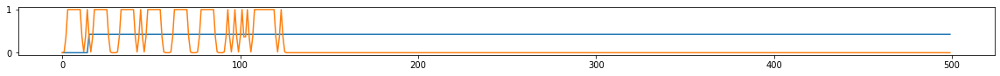

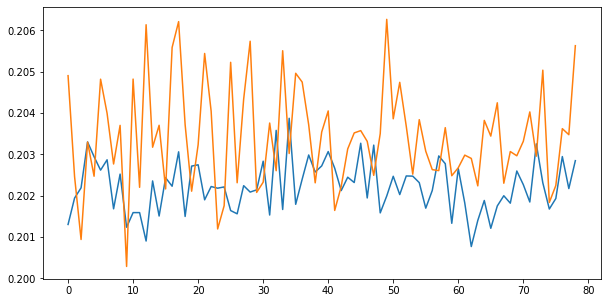

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2039                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

89 of 128
TRAIN LOSS: 0.20138536973132026
VAL LOSS: 0.2025750759575102
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.19639227071972953


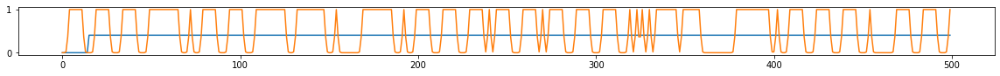

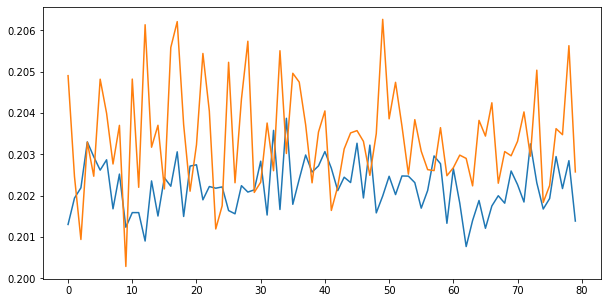

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.59it/s  0.2022                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

90 of 128
TRAIN LOSS: 0.20272908070021206
VAL LOSS: 0.20056760642263624
VAL_ACC05: 0.1111111111111111
VAL_ACC04: 0.1701213237912249


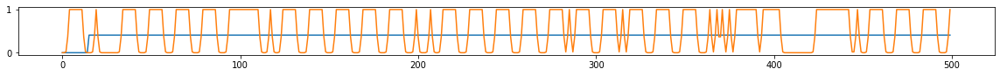

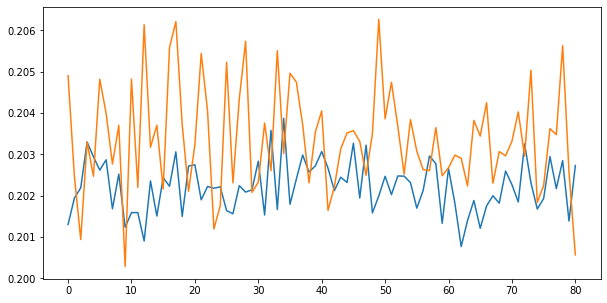

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2090                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

91 of 128
TRAIN LOSS: 0.20158249139785767
VAL LOSS: 0.204324366317855
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.07000120341226375


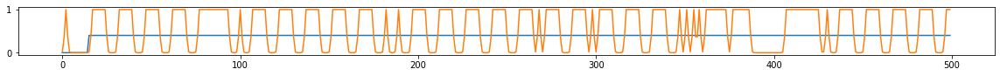

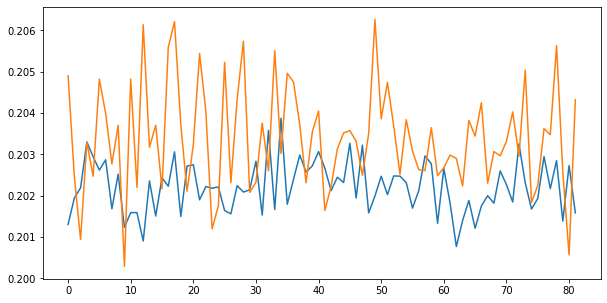

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.54it/s  0.2056                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

92 of 128
TRAIN LOSS: 0.20276401564478874
VAL LOSS: 0.20328185127841103
VAL_ACC05: 0.09027777777777778
VAL_ACC04: 0.1314911677159817


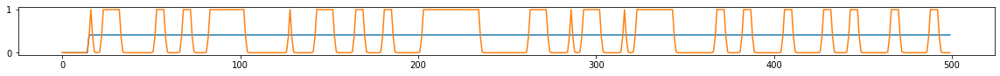

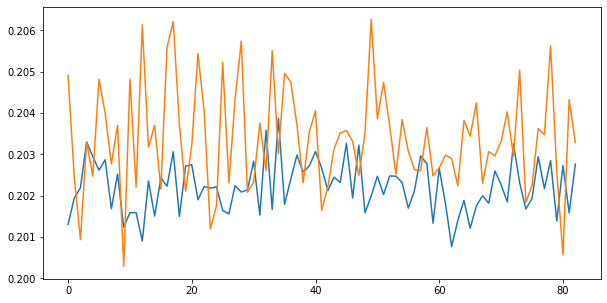

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2006                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

93 of 128
TRAIN LOSS: 0.20221767615940836
VAL LOSS: 0.20264671246210733
VAL_ACC05: 0.0625
VAL_ACC04: 0.14366592841300604


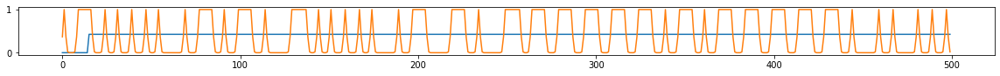

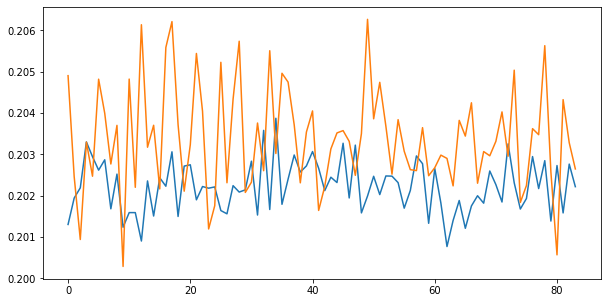

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2040                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

94 of 128
TRAIN LOSS: 0.2016918555729919
VAL LOSS: 0.2041360918018553
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.08103071783599787


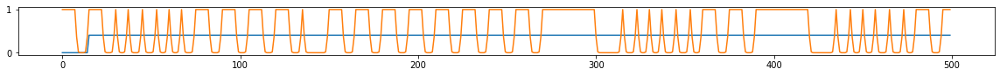

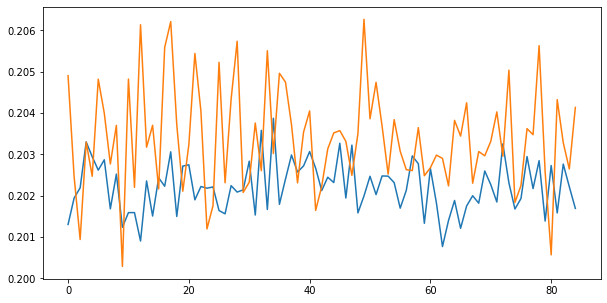

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2072                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

95 of 128
TRAIN LOSS: 0.20287502391470802
VAL LOSS: 0.20563497477107578
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06683658810672369


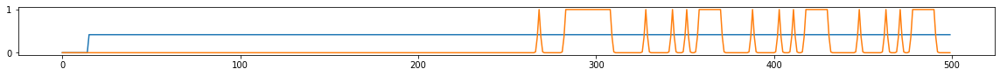

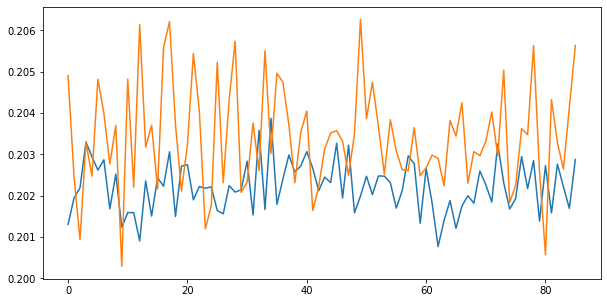

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2013                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

96 of 128
TRAIN LOSS: 0.20222226488921377
VAL LOSS: 0.20158456100357902
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08391155217541263


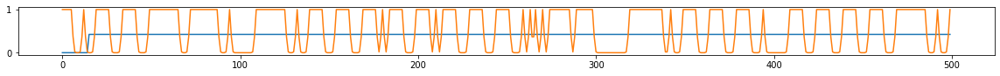

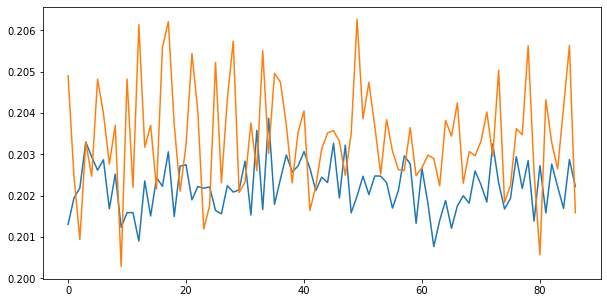

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2088                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

97 of 128
TRAIN LOSS: 0.201878868871265
VAL LOSS: 0.20215492281648847
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.07795833618750485


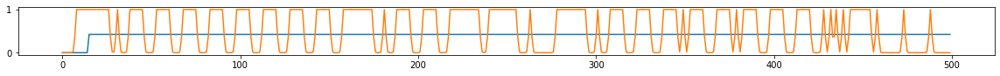

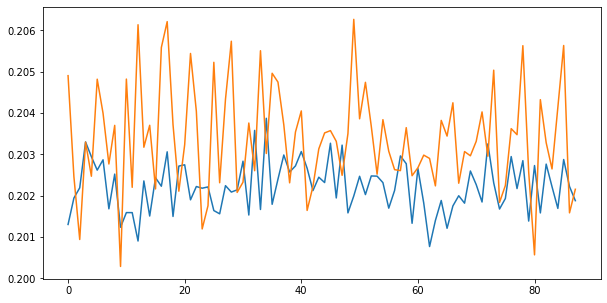

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2013                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

98 of 128
TRAIN LOSS: 0.20245031432973015
VAL LOSS: 0.2030637032455868
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.08024688045876573


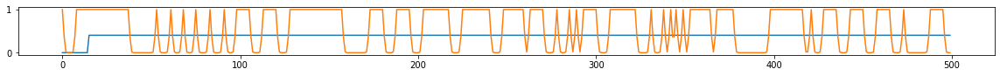

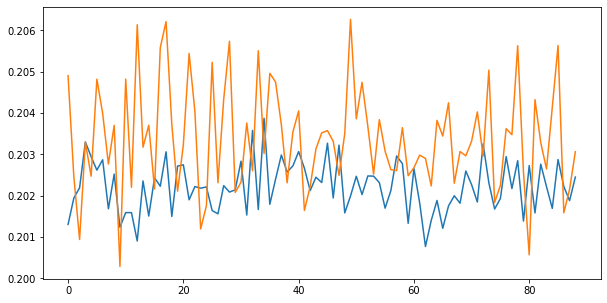

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2007                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

99 of 128
TRAIN LOSS: 0.20209837166799438
VAL LOSS: 0.2031215942568249
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.08235353998172289


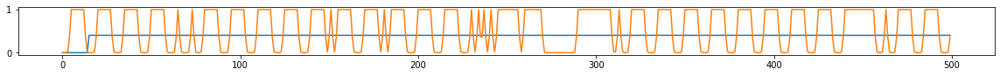

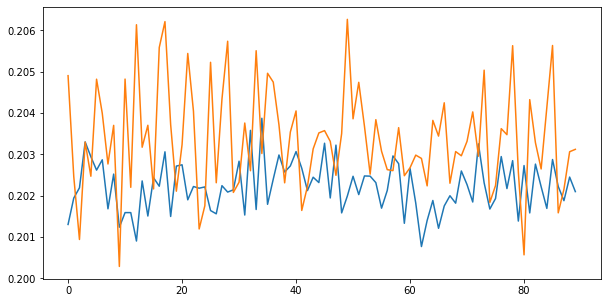

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2040                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

100 of 128
TRAIN LOSS: 0.20220729750063685
VAL LOSS: 0.2047077433930503
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.09160977594465997


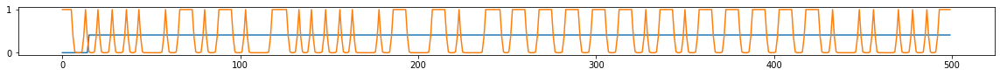

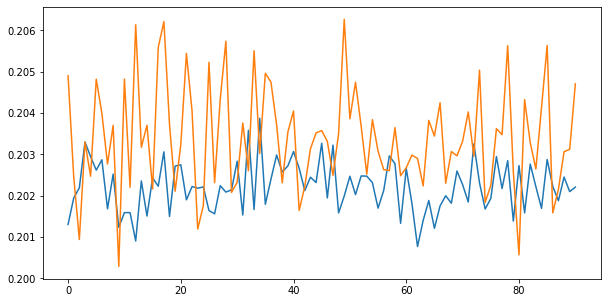

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1951                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

101 of 128
TRAIN LOSS: 0.2006645674506823
VAL LOSS: 0.20115354988310072
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.08680555555555555


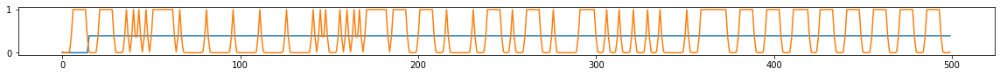

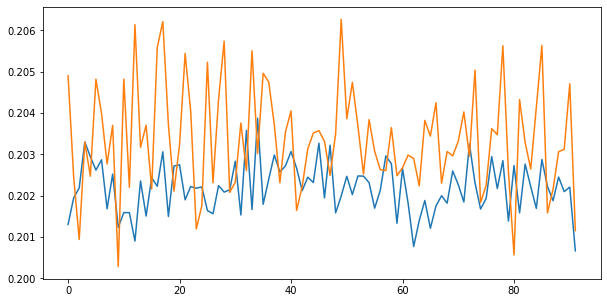

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1930                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

102 of 128
TRAIN LOSS: 0.20259714499115944
VAL LOSS: 0.20359653896755642
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.07767635970555155


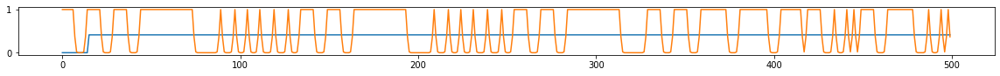

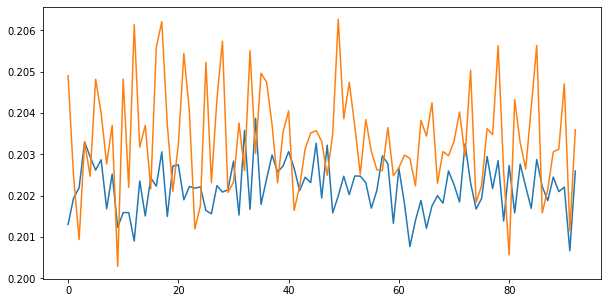

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2087                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

103 of 128
TRAIN LOSS: 0.2022724486887455
VAL LOSS: 0.20156770116753048
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.07675591827438445


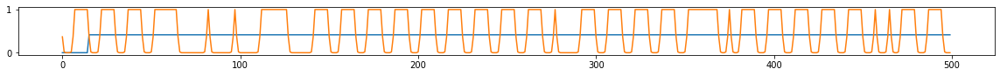

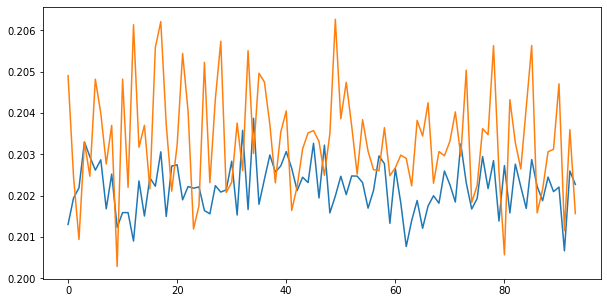

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.1949                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

104 of 128
TRAIN LOSS: 0.20168203653560746
VAL LOSS: 0.20262621839841208
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.0861416581485665


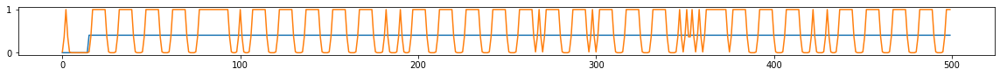

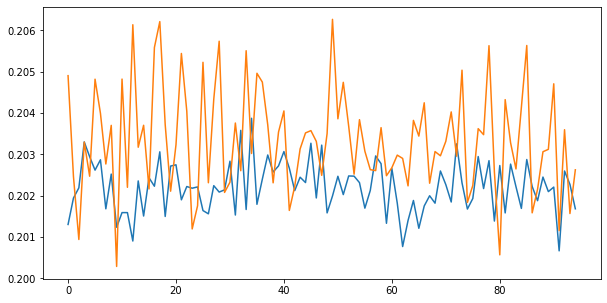

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2071                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

105 of 128
TRAIN LOSS: 0.20237809585200417
VAL LOSS: 0.20401822527249655
VAL_ACC05: 0.0625
VAL_ACC04: 0.06536058893642115


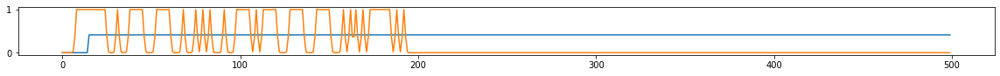

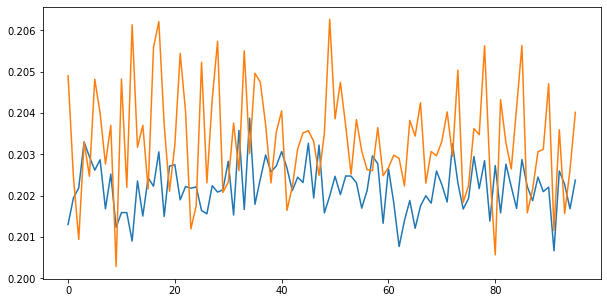

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2010                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

106 of 128
TRAIN LOSS: 0.20247956737875938
VAL LOSS: 0.20338333977593315
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.07296977114833399


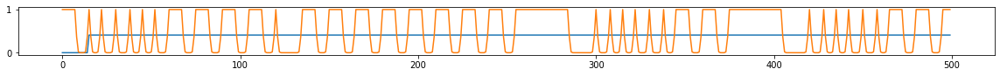

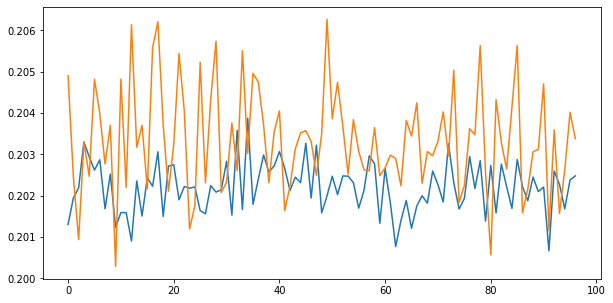

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.60it/s  0.2144                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

107 of 128
TRAIN LOSS: 0.20366939695345032
VAL LOSS: 0.20456219712893167
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06770673632630751


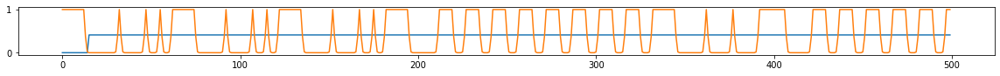

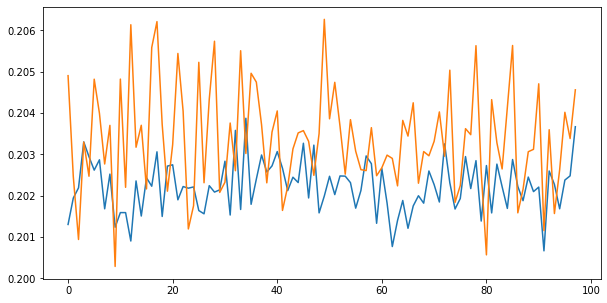

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2091                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

108 of 128
TRAIN LOSS: 0.2023174042503039
VAL LOSS: 0.203421488404274
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.20370782455850453


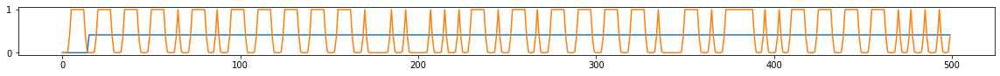

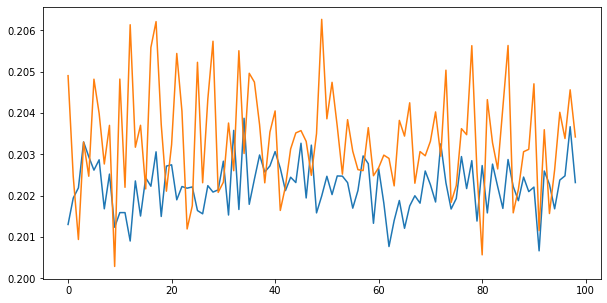

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.54it/s  0.1946                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

109 of 128
TRAIN LOSS: 0.2022119015455246
VAL LOSS: 0.20231139328744677
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.0834424172173245


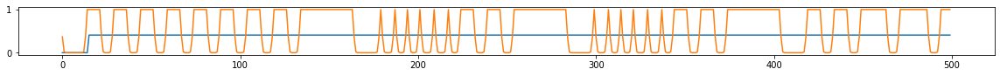

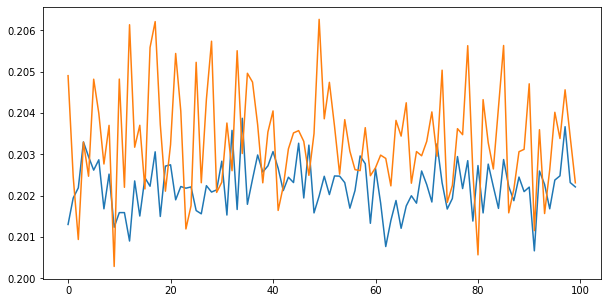

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2006                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

110 of 128
TRAIN LOSS: 0.2024165727198124
VAL LOSS: 0.20214086936579811
VAL_ACC05: 0.0763888888888889
VAL_ACC04: 0.10415656406651846


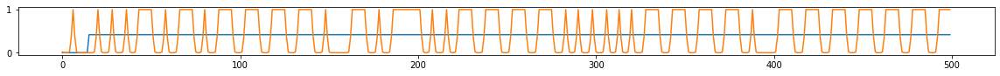

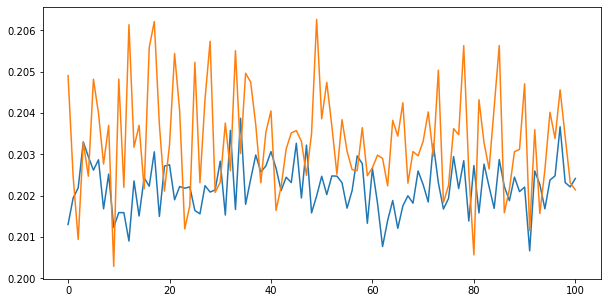

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.58it/s  0.2078                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

111 of 128
TRAIN LOSS: 0.20294097686807314
VAL LOSS: 0.20352324181132847
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.2547136925590586


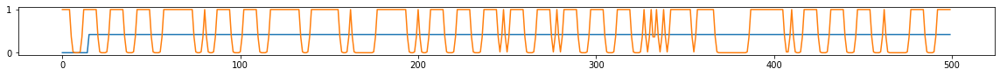

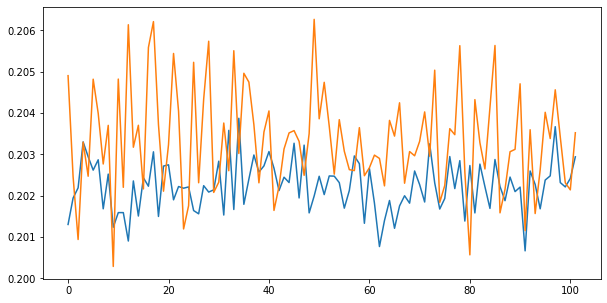

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.61it/s  0.2048                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

112 of 128
TRAIN LOSS: 0.20138918401466477
VAL LOSS: 0.20328687959247166
VAL_ACC05: 0.06944444444444445
VAL_ACC04: 0.06944444444444445


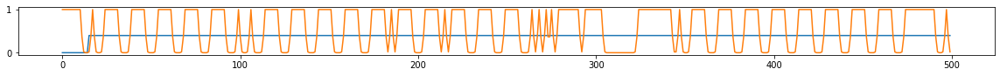

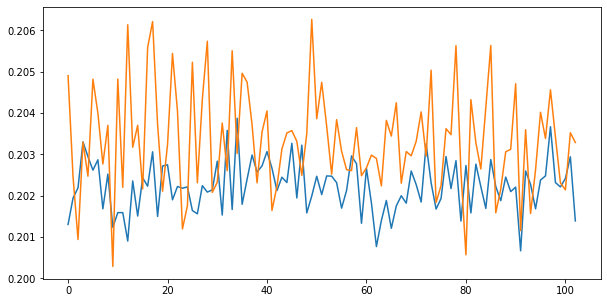

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2044                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

113 of 128
TRAIN LOSS: 0.2016156849761804
VAL LOSS: 0.2042114320728514
VAL_ACC05: 0.04861111111111111
VAL_ACC04: 0.05019568877294281


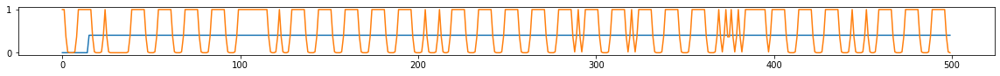

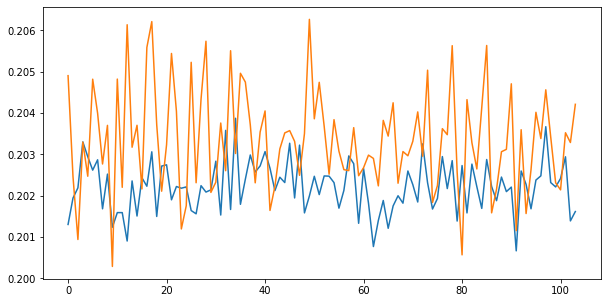

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.2056                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

114 of 128
TRAIN LOSS: 0.20190353153480423
VAL LOSS: 0.2071623769071367
VAL_ACC05: 0.07291666666666667
VAL_ACC04: 0.231911408811721


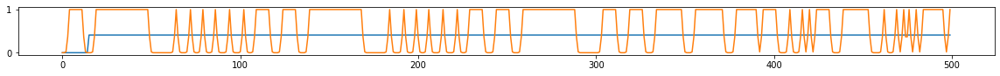

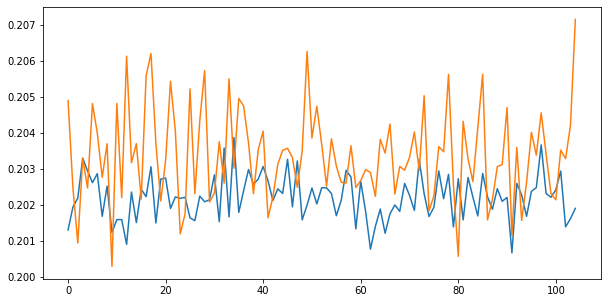

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2022                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

115 of 128
TRAIN LOSS: 0.20253832555479473
VAL LOSS: 0.20257437394724953
VAL_ACC05: 0.05555555555555555
VAL_ACC04: 0.05557855040470935


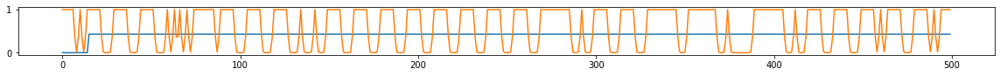

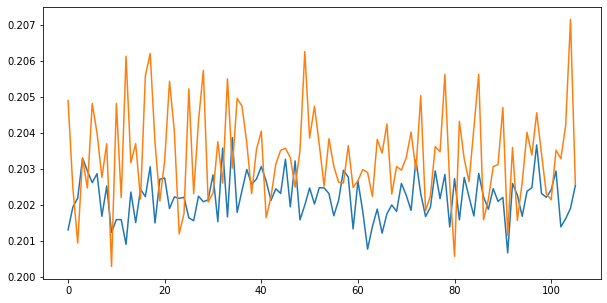

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.1981                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

116 of 128
TRAIN LOSS: 0.20215145498514175
VAL LOSS: 0.20480228298240238
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08493273645900563


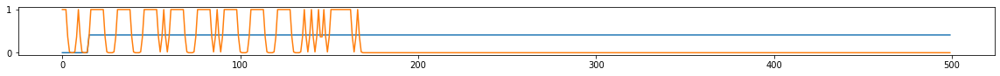

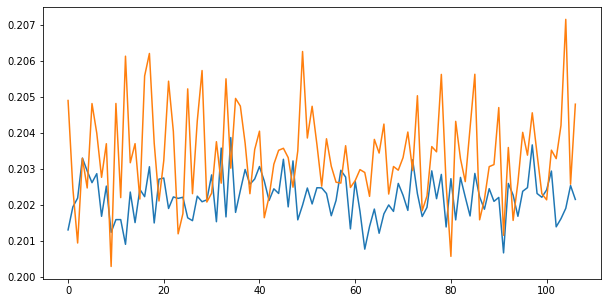

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2090                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

117 of 128
TRAIN LOSS: 0.20320394842161071
VAL LOSS: 0.20572818650139701
VAL_ACC05: 0.059027777777777776
VAL_ACC04: 0.06045154875257603


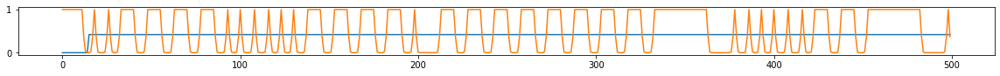

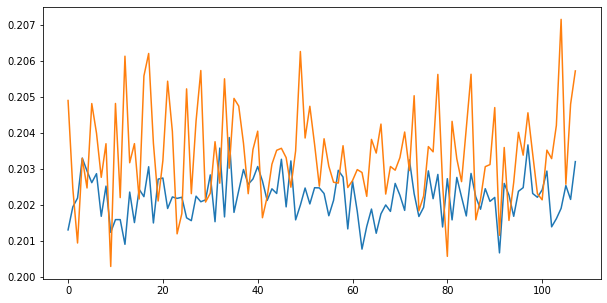

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2029                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

118 of 128
TRAIN LOSS: 0.20195263086093795
VAL LOSS: 0.20427396893501282
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06623367793019218


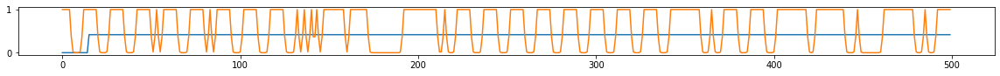

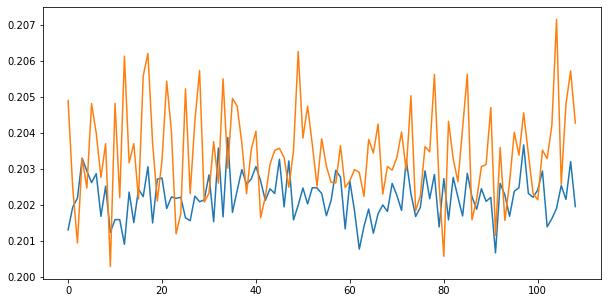

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2095                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

119 of 128
TRAIN LOSS: 0.20268269669678476
VAL LOSS: 0.20321845511595407
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06608286759881267


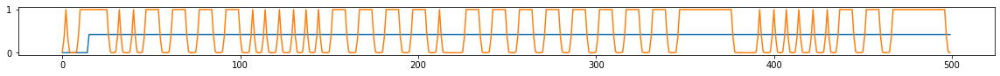

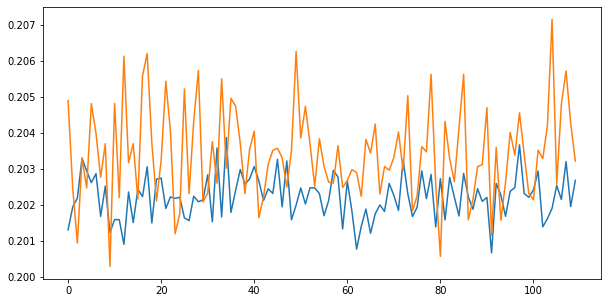

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2077                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

120 of 128
TRAIN LOSS: 0.20294041600492266
VAL LOSS: 0.20223396519819895
VAL_ACC05: 0.08680555555555555
VAL_ACC04: 0.08680555555555555


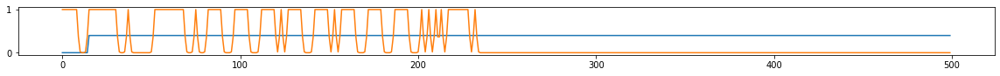

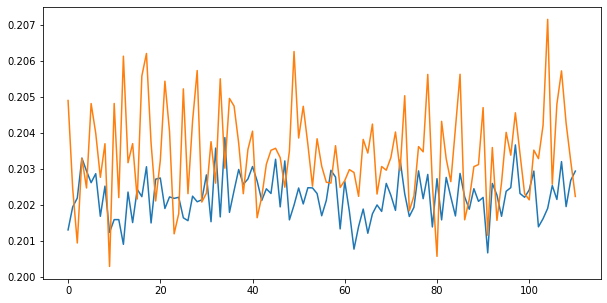

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2122                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

121 of 128
TRAIN LOSS: 0.20184019746051896
VAL LOSS: 0.20212597979439628
VAL_ACC05: 0.10069444444444445
VAL_ACC04: 0.10086825017989064


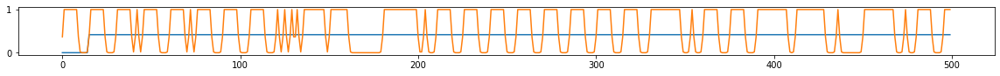

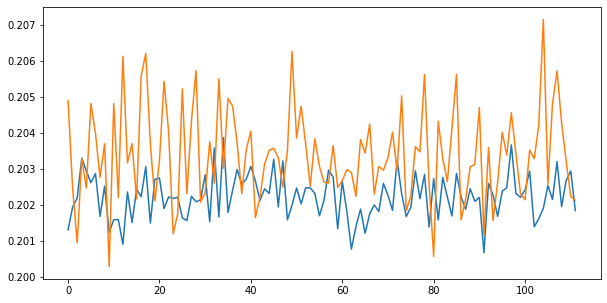

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2044                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

122 of 128
TRAIN LOSS: 0.20340148152576554
VAL LOSS: 0.20296100113126966
VAL_ACC05: 0.0798611111111111
VAL_ACC04: 0.0810180368530686


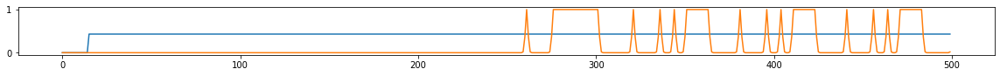

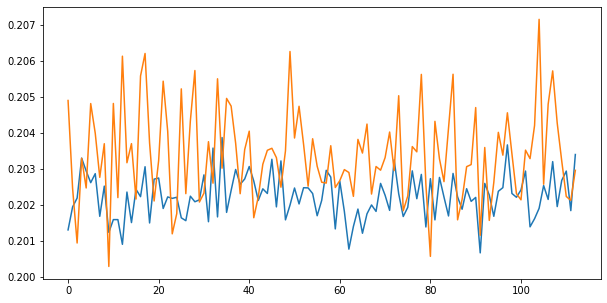

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.56it/s  0.2042                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

123 of 128
TRAIN LOSS: 0.2021098310748736
VAL LOSS: 0.20150506661997902
VAL_ACC05: 0.06597222222222222
VAL_ACC04: 0.06597222222222222


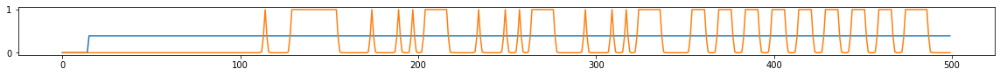

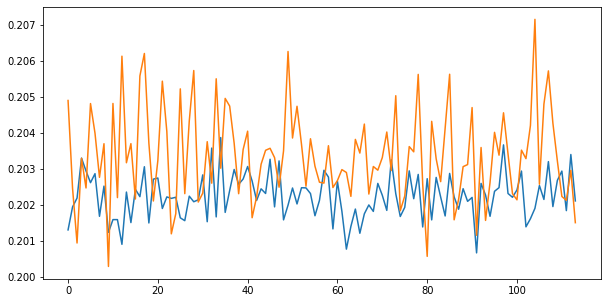

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.57it/s  0.2028                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

124 of 128
TRAIN LOSS: 0.20219487489925492
VAL LOSS: 0.20308246049616072
VAL_ACC05: 0.09027777777777778
VAL_ACC04: 0.11010392141618128


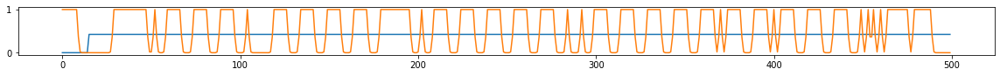

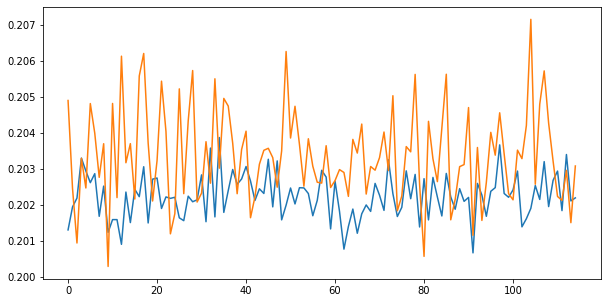

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.55it/s  0.1960                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

125 of 128
TRAIN LOSS: 0.20170356291863653
VAL LOSS: 0.20224825541178384
VAL_ACC05: 0.0625
VAL_ACC04: 0.0931159682355575


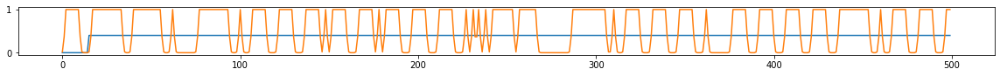

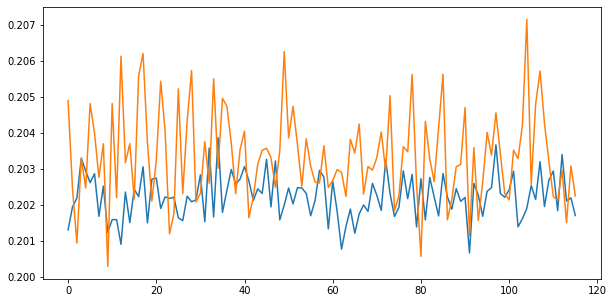

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.54it/s  0.2019                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

126 of 128
TRAIN LOSS: 0.2014790926542547
VAL LOSS: 0.20426370203495026
VAL_ACC05: 0.08333333333333333
VAL_ACC04: 0.08333333333333333


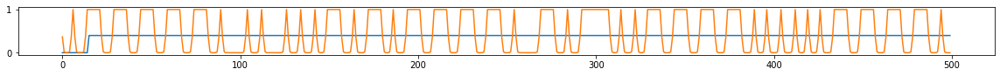

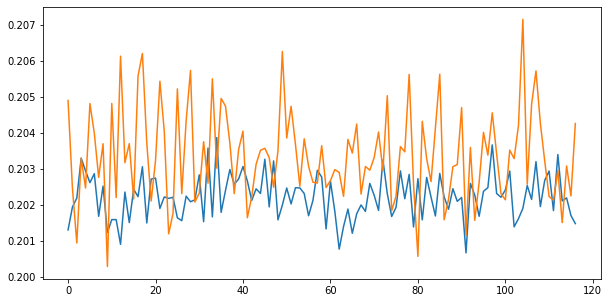

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:06<00:00:00  5.52it/s  0.2019                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

127 of 128
TRAIN LOSS: 0.2023433968424797
VAL LOSS: 0.201257414287991
VAL_ACC05: 0.0625
VAL_ACC04: 0.06356675762842878


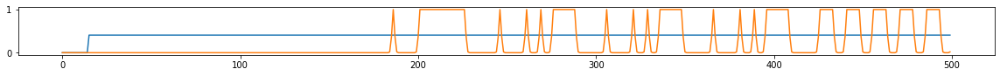

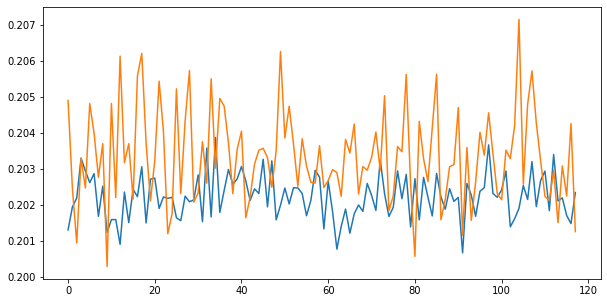

562.3880369663239 secs


In [ ]:
start = time.time()

epochs = 64
train()

end = time.time()
print(end - start, 'secs')

In [ ]:
torch.save(model.state_dict(), model_path + str(epoch_cum) + '.pt')

# Test model

In [ ]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'

In [ ]:
log_spect = LOG_SPECT(sample_rate=sample_rate, hop_size=hop_size, n_bands=[24], mode='offline')
osubeatmap = Beatmap(osud, osuf, log_spect, sample_rate=sample_rate, hop_size=hop_size, width=width, peak_type=peak_type, tmp='./wav/')

In [ ]:
a, b, o = osubeatmap.get_audio(), osubeatmap.get_beats(), osubeatmap.get_hitobjects()
h = osubeatmap.get_hits()
A, B, O = a.to(device).unsqueeze(0), b.to(device).unsqueeze(0), o.to(device).unsqueeze(0)

In [ ]:
model.to(device)
model.init_hidden(1)
model.eval()
P = model(A, B, O)

In [ ]:
p = P.cpu().detach().numpy().squeeze(0)
acc = hit_precentage(p, h, 0.4)

print(acc)

0.0


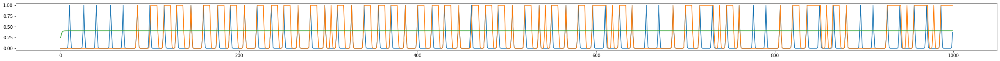

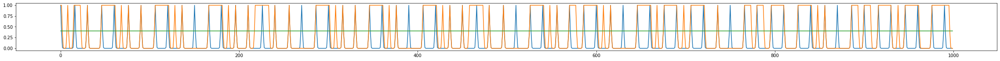

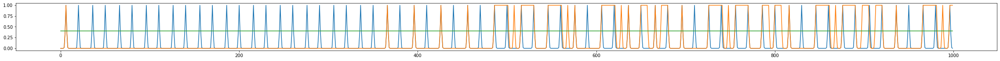

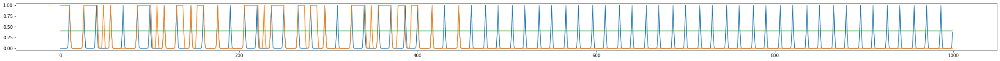

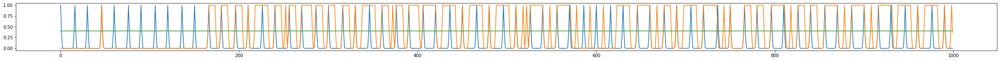

...

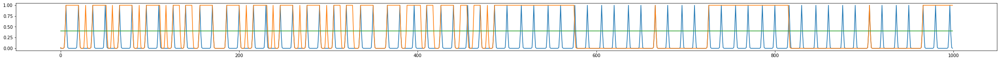

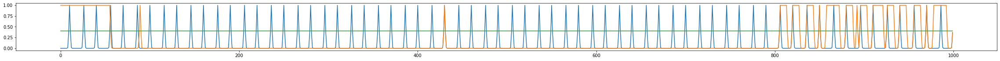

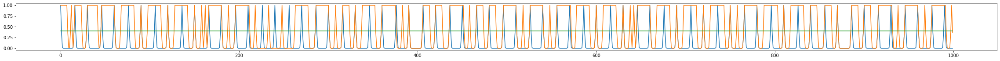

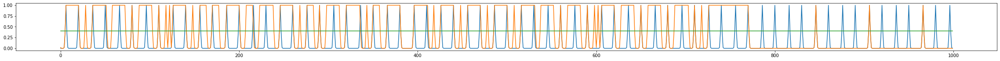

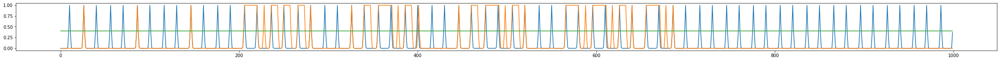

In [ ]:
plt.rcParams["figure.figsize"] = (40,2)
for i in range(int(len(p)/1000) - 1):
    plt.plot(b[1000*i:1000*(i+1)])
    plt.plot(h[1000*i:1000*(i+1)])
    plt.plot(p[1000*i:1000*(i+1)])
    plt.show()

# Create Replay Video

In [ ]:
np.save('pred.npy', p)

In [ ]:
eosud = osud.replace('/', '\/')

In [ ]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosudqq\/$osuf\",/" data.json

In [ ]:
!python create_replay.py pred.npy 0.4

2022-04-01 20:09:45,179:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-01 20:09:45,179:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '/', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'video.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mp4v', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f39095a2e60>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb': [200, 214, 229], 'Alpha': 0.9, 'Font': 'local/python/res/VAG-Rundschrift-D.ttf', 'Background': 'local/python/res/pptempla

In [ ]:
!mpv video.mp4

=[file] Cannot open file 'video.mp4': No such file or directory
Failed to open video.mp4.

Exiting... (Errors when loading file)
>